<a href="https://colab.research.google.com/github/SashaSBonacina/PET-Alzheimer-Prediction-Thesis/blob/main/Code_29_8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Set up

## Importing libraries

In [3]:
from google.colab import drive
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
import cv2, re, itertools,pathlib
from skimage import transform
import scipy.ndimage as ndi
from keras.models import Model
from keras.layers import Input, Dense, Flatten, Conv3D, MaxPooling3D, concatenate
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from sklearn.model_selection import KFold
from sklearn import metrics
from sklearn.metrics import r2_score
from keras import metrics


In [4]:
from keras.models import Model
from keras.layers import Input, Dense, Flatten, Conv3D, MaxPooling3D, concatenate
from keras.models import load_model
from sklearn.model_selection import StratifiedKFold
from keras.callbacks import ReduceLROnPlateau
import keras.backend as K
from tensorflow.keras.initializers import GlorotUniform
from keras.optimizers import Adam
from keras.backend import dropout
import time
from sklearn.model_selection import cross_val_score
import traceback

In [5]:
from numpy.random import seed
seed(42)
# Set the random seed
tf.random.set_seed(42)

## Mounting google drive to access the data

In [6]:
drive.mount('/content/drive') #mounting drive

Mounted at /content/drive


## Loading in CSV with Image ID, Age, Sex

In [7]:
cols = ['Image Data ID', 'Subject', 'Group', 'Sex', 'Age', 'Visit',
       'Description', 'Type', 'Acq Date'] # we dont need all the columns
df = pd.read_csv('/content/drive/MyDrive/CN FOR BAE DATA/Tx_Origin_SpatNORM_CN.csv', usecols = cols)
df.columns = ['ID', 'Subject', 'Group', 'Sex', 'Age', 'Visit',
       'Descrip', 'Type', 'Acq Date'] # renaming cols


In [8]:
df.head()

,ID,Subject,Group,Sex,Age,Visit,Descrip,Type,Acq Date
0,I387827,024_S_4084,CN,F,71,v21,[F-18]AV-45 Dy2 4i/16s AV45,Original,8/27/2013
1,I388229,024_S_4158,CN,M,86,v21,[F-18]AV-45 Dy2 4i/16s AV45,Original,8/30/2013
2,I509380,024_S_4158,CN,M,88,v41,[F-18]AV-45 Dy1 4i/16s AV45,Original,9/03/2015
3,I388228,024_S_4158,CN,M,86,v21,[F-18]AV-45 Dy1 4i/1 Early AV45,Original,8/30/2013
4,I387826,024_S_4084,CN,F,71,v21,[F-18]AV-45 Dy1 4i/1 Early AV45,Original,8/27/2013


Collecting file paths with the images

In [9]:
directory = '/content/drive/MyDrive/CN FOR BAE DATA/Tx_Origin_SpatNORM_CN_imageID' # enter the dir were the images are stored
image_ids = []
for filename in os.listdir(directory):
  image_ids.append(filename)
print(len(image_ids))

102


In [10]:
df = df[df['ID'].isin(image_ids)] #filterring the df so it only contains the data we need
df = df.reset_index()

In [11]:
df.shape

(102, 10)

Adding the image paths to the df for the corresponding image ID

In [12]:
# new colunm for the paths
df['Loc'] = ''
# iterate over files in that directory
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    image_id_folder = filename

    for image in os.listdir(f):
      f = os.path.join(f, image)
      if os.path.isfile(f) and f.endswith('nii'):  # checking if it is a file and a .nii file
          df.loc[df['ID']==image_id_folder, 'Loc' ] = f # appending the path

In [13]:
df['Sex'] = df['Sex'].apply(lambda x: 1 if x == 'M' else -1)

# Data Information (vis)

## Bar graphs

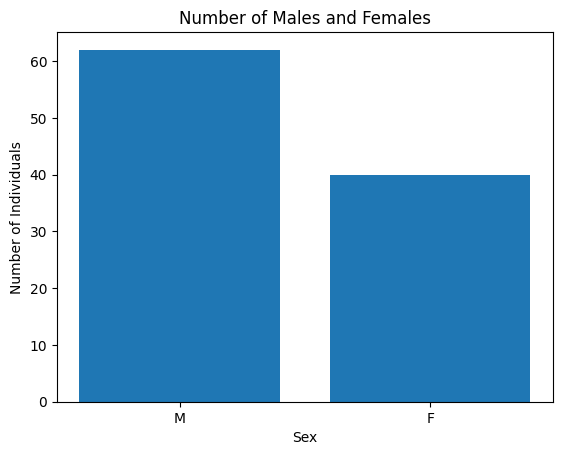

In [ ]:
sex_counts = df["Sex"].value_counts()
# Plot the bar chart
plt.bar(sex_counts.index, sex_counts.values)
plt.xlabel("Sex")
plt.ylabel("Number of Individuals")
plt.title("Number of Males and Females")
plt.show()

Text(0.5, 1.0, 'Age Distribution for CN data')

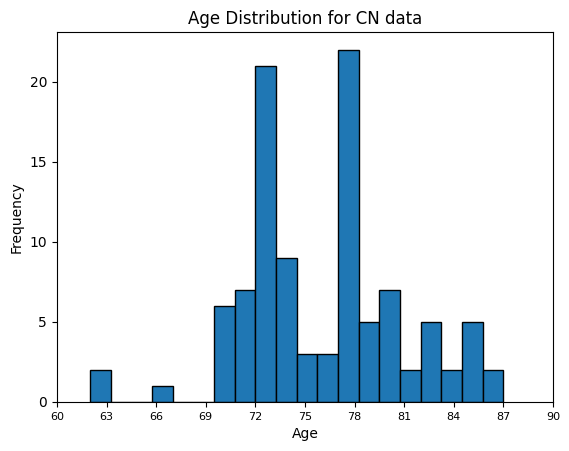

In [ ]:
plt.hist(df["Age"], bins=20, edgecolor="black")
plt.xlabel("Age")
plt.ylabel("Frequency")
num_ticks = 11  # The number of ticks you want
x_ticks = np.linspace(60, 90, num_ticks)
plt.xticks(x_ticks, fontsize=8)

plt.title("Age Distribution for CN data")

In [ ]:
len(df['Subject'].unique())

102

Each subject has only 1 image in the df

No reshaping needed as all are the same shape! This is because the same processing steps were taken by ADNI for each image.

Furthermore each image is 3d not 4d, so t has been average through the image in processing

## Looking at one image

<class 'nibabel.nifti1.Nifti1Image'>
<class 'numpy.memmap'>


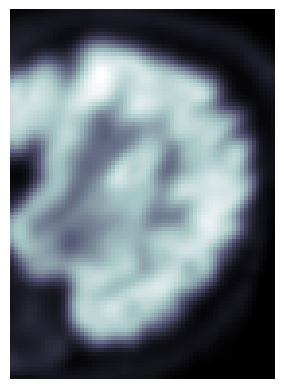

In [ ]:
x = list(df['Loc'])[11] # getting a random image path
brain_vol = nib.load(x)
# What is the type of this object?
print(type(brain_vol))
brain_vol_data = brain_vol.get_fdata()
print(type(brain_vol_data))
plt.imshow(brain_vol_data[60], cmap='bone')
plt.axis('off')
plt.show()

# BAE

## Preparing the data

In [14]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv3D, MaxPooling3D, Flatten, Dense, Dropout
import keras
from keras.models import load_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score



Extracting data in the correct format for the model

In [15]:
# Extract image data and corresponding ages from the DataFrame
image_paths = df['Loc'].values
ages = df['Age'].values
sexes = df['Sex'].values

# Initialize empty lists to store image arrays and labels
image_data = []

# Loop through each image path, load the image, and append to the lists
for path, age in zip(image_paths, ages):
    image = nib.load(path).get_fdata()
    image_data.append(image)

# Convert lists to numpy arrays
image_data = np.array(image_data)

# Reshape the image data to match the CNN input shape (128, 128, 82, 6) -> (samples, 128, 128, 82, 6)
image_data = image_data.reshape(-1, 79, 95, 68, 1)



In [16]:
train_idx, test_idx, bae_3d_sexes_train, bae_3d_sexes_test = train_test_split(np.arange(102), sexes, test_size=0.2, stratify=sexes)

In [17]:
count = 0
locations = []
shape = image_data.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(image_data[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)

9677


In [18]:
from collections import Counter
Counter([ele[0] for ele in locations])

Counter({10: 5392, 60: 4285})

images 10 and 60 have some nans, as this is only 1% of the image we can replace the pixels with averages

In [19]:
x = list(df['Loc'])[10] # getting a random image path
brain_vol = nib.load(x)
# What is the type of this object?
type(brain_vol)

nibabel.nifti1.Nifti1Image

In [20]:
brain_vol_data = brain_vol.get_fdata()
type(brain_vol_data)

numpy.memmap

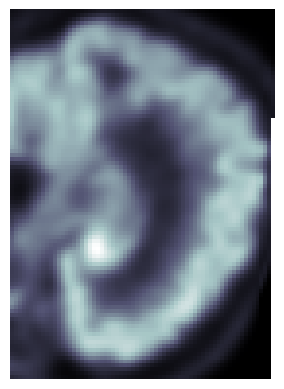

In [21]:
plt.imshow(brain_vol_data[50], cmap='bone')
plt.axis('off')
plt.show()

we can see the nans on the right hand side of the image

In [22]:
for location in locations:
  surrounding_pixels = []
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]-1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]+1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]-1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]+1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]][location[3]-1])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]][location[3]+1])
  except:
    None
  image_data[location[0]][location[1]][location[2]][location[3]]  =  np.nanmean(surrounding_pixels)


In [23]:
"""count = 0
shape = image_data.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(image_data[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)"""

'count = 0\nshape = image_data.shape\nfor a in range(shape[0]):\n  for b in range(shape[1]):\n    for c in range(shape[2]):\n      for d in range(shape[3]):\n        if pd.isna(image_data[a][b][c][d]):\n          locations.append([a,b,c,d])\n          count+=1\nprint(count)'

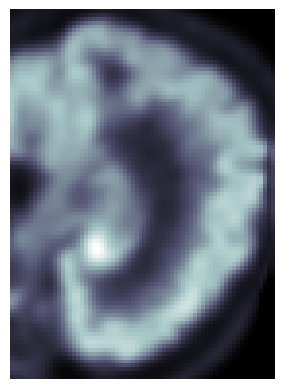

In [24]:
plt.imshow(image_data[10][50], cmap='bone')
plt.axis('off')
plt.show()

th e image data now have no Nans, i have filled in the nana by looking at pixels around the nan

In [25]:
image_data.shape

(102, 79, 95, 68, 1)

In [26]:
bae_3d_im_train, bae_3d_im_test = image_data[train_idx], image_data[test_idx]
bae_3d_ages_train, bae_3d_ages_test = ages[train_idx], ages[test_idx]

### Baseline
the baseline will be the average of the ages

In [27]:
mean_age = np.mean(ages)

In [28]:
predictions = np.ones(len(ages))*mean_age


# Calculate different evaluation metrics
mse = mean_squared_error(ages, predictions)
mae = mean_absolute_error(ages, predictions)
r2 = r2_score(ages, predictions)

# Display the metrics
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

Mean Squared Error: 23.24423298731257
Mean Absolute Error: 3.951557093425605
R-squared: 0.0


## 3D model

### V1
model without sex, without transfer learning, ...

In [ ]:
def compile_model():
  model = Sequential() # using sequential

  # Add 3D Convolutional layers with MaxPooling
  model.add(Conv3D(32, kernel_size=(3, 3, 3), activation='relu', input_shape=(79, 95, 68, 1)))
  model.add(MaxPooling3D(pool_size=(2, 2, 2)))
  model.add(Conv3D(64, kernel_size=(3, 3, 3), activation='relu', input_shape=(79, 95, 68, 1)))
  model.add(MaxPooling3D(pool_size=(2, 2, 2)))


  # Flatten the output and add Dense layers for age prediction
  model.add(Flatten())
  model.add(Dense(128, activation='relu'))
  model.add(Dense(1, activation='linear'))  # Use 'linear' activation for regression tasks

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam',metrics=[metrics.mean_absolute_error])
  return model

In [ ]:
def cross_validate(X, y, K = 5):

    scores = []
    histories = []
    r2 = []
    for train, test in KFold(n_splits=K, shuffle=True).split(X,y):
        model = compile_model() # compile model
        histories.append(model.fit(X[train], y[train],
                                   validation_data = (X[test],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate(X[test], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict(X[test]), y[test]))
    print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())
    print("average test r2: ", np.mean(r2))
    print(model.summary())
    return scores, histories, r2

In [ ]:
scores_111, histories_111, r2_111 = cross_validate(image_data, ages, K = 5)

Epoch 1/200
6/6 [==============================] - 6s 432ms/step - loss: 3070.9160 - mean_absolute_error: 46.3786 - val_loss: 2167.8105 - val_mean_absolute_error: 46.2958
Epoch 2/200
6/6 [==============================] - 1s 244ms/step - loss: 1215.9377 - mean_absolute_error: 31.8668 - val_loss: 507.8205 - val_mean_absolute_error: 21.9146
Epoch 3/200
6/6 [==============================] - 1s 243ms/step - loss: 428.7243 - mean_absolute_error: 18.2904 - val_loss: 339.3802 - val_mean_absolute_error: 17.7119
Epoch 4/200
6/6 [==============================] - 1s 242ms/step - loss: 377.4108 - mean_absolute_error: 18.6187 - val_loss: 26.4095 - val_mean_absolute_error: 4.5914
Epoch 5/200
6/6 [==============================] - 1s 247ms/step - loss: 173.5617 - mean_absolute_error: 11.4009 - val_loss: 26.2886 - val_mean_absolute_error: 4.5267
Epoch 6/200
6/6 [==============================] - 1s 243ms/step - loss: 94.5712 - mean_absolute_error: 8.0312 - val_loss: 72.3813 - val_mean_absolute_error

1/1 [==============================] - 0s 107ms/step
Epoch 1/200
6/6 [==============================] - 3s 306ms/step - loss: 1306.4696 - mean_absolute_error: 24.0980 - val_loss: 154.9322 - val_mean_absolute_error: 11.5480
Epoch 2/200
6/6 [==============================] - 2s 263ms/step - loss: 165.5886 - mean_absolute_error: 11.0473 - val_loss: 76.0516 - val_mean_absolute_error: 7.7382
Epoch 3/200
6/6 [==============================] - 2s 260ms/step - loss: 76.7667 - mean_absolute_error: 7.4181 - val_loss: 35.8663 - val_mean_absolute_error: 4.7837
Epoch 4/200
6/6 [==============================] - 2s 260ms/step - loss: 67.4920 - mean_absolute_error: 6.8145 - val_loss: 125.1193 - val_mean_absolute_error: 10.0371
Epoch 5/200
6/6 [==============================] - 2s 260ms/step - loss: 50.1855 - mean_absolute_error: 5.6139 - val_loss: 33.6515 - val_mean_absolute_error: 4.7036
Epoch 6/200
6/6 [==============================] - 2s 259ms/step - loss: 31.5762 - mean_absolute_error: 4.6221 - 

1/1 [==============================] - 0s 108ms/step
average test MSE:  29.510755920410155
average test MAE:  4.453466463088989
average test r2:  -2.512281929073577
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_8 (Conv3D)           (None, 77, 93, 66, 32)    896       
                                                                 
 max_pooling3d_8 (MaxPooling  (None, 38, 46, 33, 32)   0         
 3D)                                                             
                                                                 
 conv3d_9 (Conv3D)           (None, 36, 44, 31, 64)    55360     
                                                                 
 max_pooling3d_9 (MaxPooling  (None, 18, 22, 15, 64)   0         
 3D)                                                             
                                                                 
 flatten_39 (Flatten)

Zoom in on the graph

We see that the model is unstable and over fits for high epochs

In [ ]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
model = compile_model()
X_train, X_test, y_train, y_test, sex_train, sex_test= train_test_split(image_data, ages, sexes, test_size=0.2)
model.fit(X_train, y_train, epochs = 200, batch_size = 16)
predictions = model.predict(X_test)




Epoch 1/200
6/6 [==============================] - 3s 223ms/step - loss: 4804.8862 - mean_absolute_error: 51.9270
Epoch 2/200
6/6 [==============================] - 1s 213ms/step - loss: 3190.2498 - mean_absolute_error: 55.7494
Epoch 3/200
6/6 [==============================] - 1s 213ms/step - loss: 524.8180 - mean_absolute_error: 19.6900
Epoch 4/200
6/6 [==============================] - 1s 212ms/step - loss: 223.7456 - mean_absolute_error: 12.9612
Epoch 5/200
6/6 [==============================] - 1s 212ms/step - loss: 316.8080 - mean_absolute_error: 16.2415
Epoch 6/200
6/6 [==============================] - 1s 212ms/step - loss: 112.7458 - mean_absolute_error: 9.2924
Epoch 7/200
6/6 [==============================] - 1s 213ms/step - loss: 35.9838 - mean_absolute_error: 4.8623
Epoch 8/200
6/6 [==============================] - 1s 211ms/step - loss: 47.0837 - mean_absolute_error: 5.4628
Epoch 9/200
6/6 [==============================] - 1s 212ms/step - loss: 42.8200 - mean_absolute_er

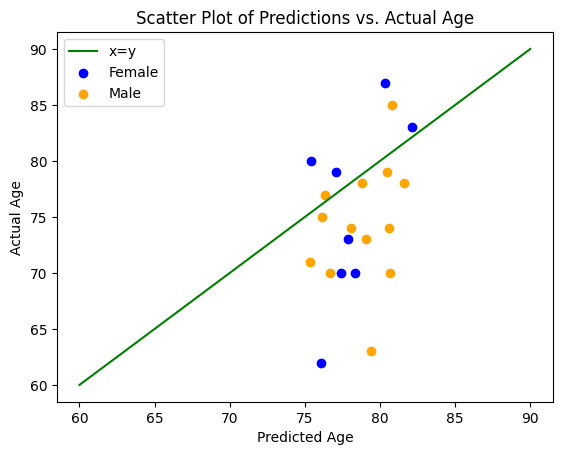

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(sex_test == g)
    plt.scatter(predictions[i], y_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
del model
import gc
gc.collect()
tf.keras.backend.clear_session()

We see more males (1) above the line and females below, perhaps adding sex as a feature can improve the model? This will be done later

### V2
Adding early stopping to prevent overfitting

In [ ]:
model = Sequential() # using sequential

# Add 3D Convolutional layers with MaxPooling
model.add(Conv3D(32, kernel_size=(3, 3, 3), activation='relu', input_shape=(79, 95, 68, 1)))
model.add(MaxPooling3D(pool_size=(2, 2, 2)))
model.add(Conv3D(64, kernel_size=(3, 3, 3), activation='relu'))
model.add(MaxPooling3D(pool_size=(2, 2, 2)))

# Flatten the output and add Dense layers for age prediction
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))  # Use 'linear' activation for regression tasks

# Compile the model
model.compile(loss='mean_squared_error', optimizer='adam')

Lets train the model with early stopping

In [ ]:
callbacks = [EarlyStopping(monitor='val_loss', patience=100),
             ModelCheckpoint(filepath='basic_model.h5', monitor='val_loss', save_best_only=True)]

Epoch 1/200
4/4 [==============================] - 6s 877ms/step - loss: 1815.9822 - val_loss: 17.6195
Epoch 2/200
4/4 [==============================] - 1s 308ms/step - loss: 65.1401 - val_loss: 85.7217
Epoch 3/200
4/4 [==============================] - 1s 307ms/step - loss: 76.2787 - val_loss: 24.1464
Epoch 4/200
4/4 [==============================] - 1s 306ms/step - loss: 45.3227 - val_loss: 34.7534
Epoch 5/200
4/4 [==============================] - 1s 309ms/step - loss: 41.3167 - val_loss: 18.3467
Epoch 6/200
4/4 [==============================] - 1s 305ms/step - loss: 33.2154 - val_loss: 23.7530
Epoch 7/200
4/4 [==============================] - 1s 306ms/step - loss: 31.8532 - val_loss: 33.6271
Epoch 8/200
4/4 [==============================] - 1s 310ms/step - loss: 42.9918 - val_loss: 24.5418
Epoch 9/200
4/4 [==============================] - 1s 308ms/step - loss: 32.6458 - val_loss: 18.5745
Epoch 10/200
4/4 [==============================] - 1s 306ms/step - loss: 31.1114 - val_l

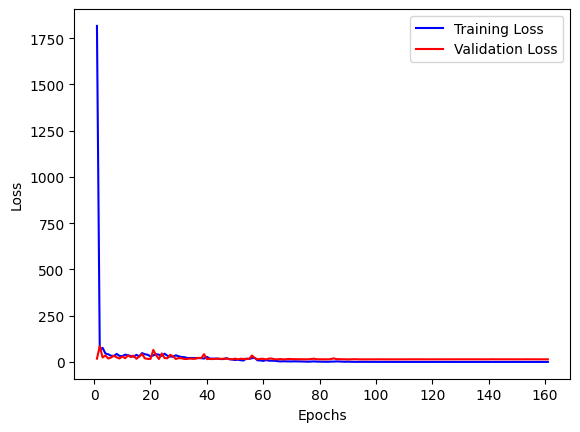

In [ ]:
# Run model.fit() and store the training history
history = model.fit(train_data, train_labels, epochs=200, batch_size=16, validation_split=0.2, callbacks = callbacks)

# Access the loss values from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


Zoom in on the graph

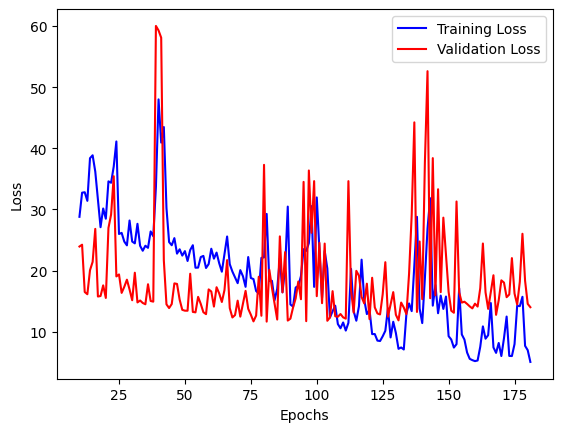

In [ ]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

We see that the model begins to over fit for high epochs and this is where the early stopping stops the models from training

In [ ]:
saved_model = load_model('basic_model.h5')
train_acc = saved_model.evaluate(train_data, train_labels, verbose=0)
test_acc = saved_model.evaluate(test_data, test_labels, verbose=0)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

Train: 14.208, Test: 17.417


In [ ]:
# Evaluate the model on the test set
test_loss = saved_model.evaluate(test_data, test_labels)
print("Test Loss:", test_loss)


1/1 [==============================] - 0s 152ms/step - loss: 17.4171
Test Loss: 17.417123794555664


In [ ]:
predictions = saved_model.predict(test_data)
# Calculate different evaluation metrics
mse = mean_squared_error(test_labels, predictions)
mae = mean_absolute_error(test_labels, predictions)
r2 = r2_score(test_labels, predictions)

# Display the metrics
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

1/1 [==============================] - 0s 93ms/step
Mean Squared Error: 17.417124618923047
Mean Absolute Error: 3.4120225452241444
R-squared: 0.10478415420220688


The model has improved a very small amount

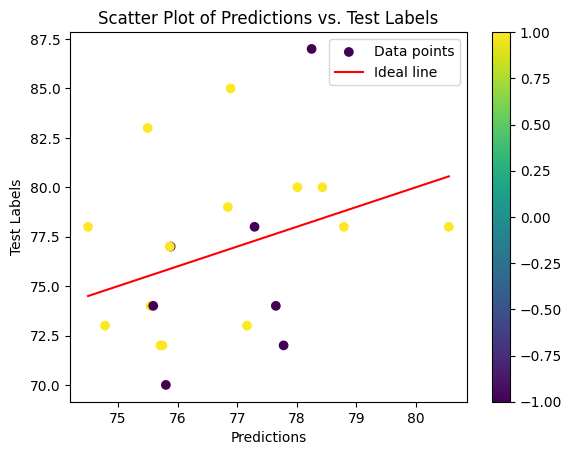

In [ ]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
plt.scatter(predictions, test_labels, c=test_sex, cmap='viridis', label='Data points')
plt.plot([min(predictions), max(predictions)], [min(predictions), max(predictions)], c='red', label='Ideal line')

# Add labels and title
plt.xlabel('Predictions')
plt.ylabel('Test Labels')
plt.title('Scatter Plot of Predictions vs. Test Labels')

# Add a legend
plt.legend()

# Show the plot
plt.colorbar()  # Add a colorbar to show the mapping of colors to sex_train values
plt.show()



Somehow sex is now more scattered, we can still try adding it as a feature to see if it helps


###  V3
Adding sex as a feature with early stopping

In [ ]:

def compile_model():
    # Define the input layer for the 3D Convolutional network
    input_img = Input(shape=(79, 95, 68, 1))

    # Apply 3D Convolutional layers with MaxPooling using the Functional API
    x = Conv3D(32, kernel_size=(3, 3, 3), activation='relu')(input_img)
    x = MaxPooling3D(pool_size=(2, 2, 2))(x)
    x = Conv3D(64, kernel_size=(3, 3, 3), activation='relu')(x)
    x = MaxPooling3D(pool_size=(2, 2, 2))(x)

    # Flatten the output and add Dense layers for age prediction
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    output_img = Dense(16, activation='relu')(x)

    # Define the input layer for the extra feature
    input_extra = Input(shape=(1,))

    # Concatenate the output of the Convolutional network with the extra feature
    merged = concatenate([output_img, input_extra])

    # Add Dense layers for further prediction
    merged = Dense(8, activation='relu')(merged)
    output = Dense(1, activation='linear')(merged)  # Use 'linear' activation for regression tasks

    # Define the model with both inputs and the final output
    model = Model(inputs=[input_img, input_extra], outputs=output)

    # Compile the model
    model.compile(loss='mean_squared_error', optimizer='adam',metrics=[metrics.mean_absolute_error])
    return model


In [ ]:

def cross_validate(X, y, z, K = 5):
    scores = []
    histories = []
    r2 = []

    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = compile_model() # compile model
        histories.append(model.fit([X[train], z[train]], y[train],
                                   validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict([X[test], z[test]]), y[test]))
    print(model.summary())
    return scores, histories, r2

In [ ]:
scores_112, histories_112, r2_112 = cross_validate(image_data, ages, sexes, K = 5)

Epoch 1/200
6/6 [==============================] - 16s 449ms/step - loss: 4542.5005 - mean_absolute_error: 53.8300 - val_loss: 3112.8381 - val_mean_absolute_error: 55.4792
Epoch 2/200
6/6 [==============================] - 2s 248ms/step - loss: 2384.7485 - mean_absolute_error: 48.0877 - val_loss: 112.6366 - val_mean_absolute_error: 9.5458
Epoch 3/200
6/6 [==============================] - 1s 248ms/step - loss: 647.9234 - mean_absolute_error: 22.6975 - val_loss: 105.0388 - val_mean_absolute_error: 8.7975
Epoch 4/200
6/6 [==============================] - 1s 248ms/step - loss: 269.3250 - mean_absolute_error: 13.8823 - val_loss: 539.6708 - val_mean_absolute_error: 22.5309
Epoch 5/200
6/6 [==============================] - 1s 246ms/step - loss: 227.7699 - mean_absolute_error: 12.6748 - val_loss: 174.2254 - val_mean_absolute_error: 12.0158
Epoch 6/200
6/6 [==============================] - 2s 251ms/step - loss: 153.5700 - mean_absolute_error: 11.3018 - val_loss: 49.5648 - val_mean_absolute_

1/1 [==============================] - 0s 99ms/step
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d_8 (Conv3D)              (None, 77, 93, 66,   896         ['input_9[0][0]']                
                                32)                                                               
                                                                                                  
 max_pooling3d_8 (MaxPooling3D)  (None, 38, 46, 33,   0          ['conv3d_8[0][0]']               
                                32)     

In [ ]:
np.mean([-1.7082423686411716, -1.3497437460218027, -2.4773533967008077, -2.722611121147865])

-2.064487658127912

In [ ]:
np.mean([r2_112[:1] + r2_112[2:]])

-2.5622068467075256

In [ ]:
scores_112

[[31.456600189208984, 4.581780433654785],
 [5812.4541015625, 76.0911865234375],
 [22.368276596069336, 3.43837308883667],
 [19.19979476928711, 3.5631489753723145],
 [30.954029083251953, 4.520724296569824]]

In [ ]:
np.mean([4.581780433654785, 3.43837308883667,3.5631489753723145, 4.520724296569824])

4.026006698608398

In [ ]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
model = compile_model()
X_train, X_test, y_train, y_test, sex_train, sex_test= train_test_split(image_data, ages, sexes, test_size=0.2)
model.fit([X_train, sex_train], y_train, epochs = 200, batch_size = 16)
predictions = model.predict([X_test, sex_test])

Epoch 1/200
6/6 [==============================] - 3s 232ms/step - loss: 1304.9496 - mean_absolute_error: 26.0095
Epoch 2/200
6/6 [==============================] - 1s 231ms/step - loss: 132.9226 - mean_absolute_error: 9.6069
Epoch 3/200
6/6 [==============================] - 1s 230ms/step - loss: 41.9616 - mean_absolute_error: 5.0215
Epoch 4/200
6/6 [==============================] - 1s 229ms/step - loss: 30.8599 - mean_absolute_error: 4.5325
Epoch 5/200
6/6 [==============================] - 1s 228ms/step - loss: 25.4729 - mean_absolute_error: 3.9464
Epoch 6/200
6/6 [==============================] - 1s 228ms/step - loss: 22.9068 - mean_absolute_error: 3.8876
Epoch 7/200
6/6 [==============================] - 1s 228ms/step - loss: 47.5561 - mean_absolute_error: 5.8436
Epoch 8/200
6/6 [==============================] - 1s 229ms/step - loss: 45.5302 - mean_absolute_error: 5.3573
Epoch 9/200
6/6 [==============================] - 1s 229ms/step - loss: 32.3337 - mean_absolute_error: 4.71

1/1 [==============================] - 0s 103ms/step


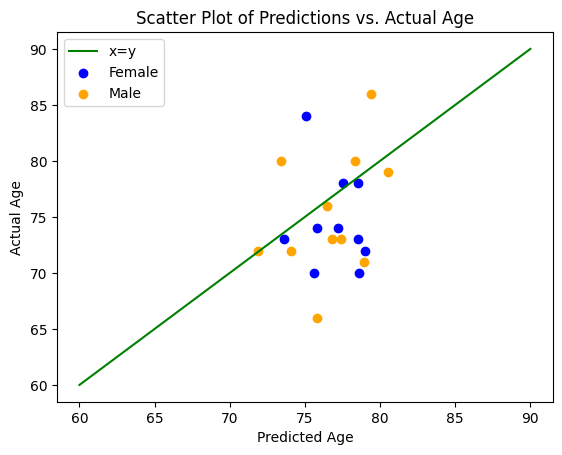

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(sex_test == g)
    plt.scatter(predictions[i], y_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
callbacks = [EarlyStopping(monitor='val_loss', patience=100),
             ModelCheckpoint(filepath='basic_sex_model.h5', monitor='val_loss', save_best_only=True)]

Epoch 1/100
4/4 [==============================] - 5s 1s/step - loss: 6828.8145 - val_loss: 4467.8594
Epoch 2/100
4/4 [==============================] - 3s 951ms/step - loss: 4400.7495 - val_loss: 3781.1741
Epoch 3/100
4/4 [==============================] - 4s 1s/step - loss: 2814.3694 - val_loss: 778.1365
Epoch 4/100
4/4 [==============================] - 1s 305ms/step - loss: 420.5643 - val_loss: 1214.3479
Epoch 5/100
4/4 [==============================] - 4s 1s/step - loss: 869.3428 - val_loss: 41.4731
Epoch 6/100
4/4 [==============================] - 1s 306ms/step - loss: 147.5361 - val_loss: 412.9963
Epoch 7/100
4/4 [==============================] - 1s 307ms/step - loss: 404.7803 - val_loss: 168.4288
Epoch 8/100
4/4 [==============================] - 1s 308ms/step - loss: 75.8432 - val_loss: 111.7802
Epoch 9/100
4/4 [==============================] - 1s 305ms/step - loss: 161.4918 - val_loss: 101.1150
Epoch 10/100
4/4 [==============================] - 1s 305ms/step - loss: 51.0

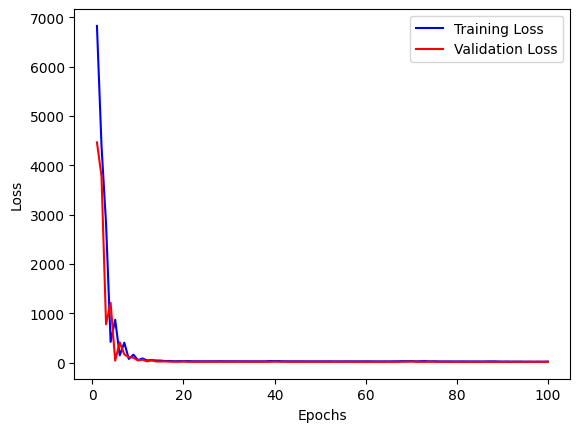

In [ ]:
# Run model.fit() and store the training history
history = model.fit([train_data, train_sex], train_labels, epochs=100, batch_size=16, validation_split=0.2, callbacks = callbacks)

# Access the loss values from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

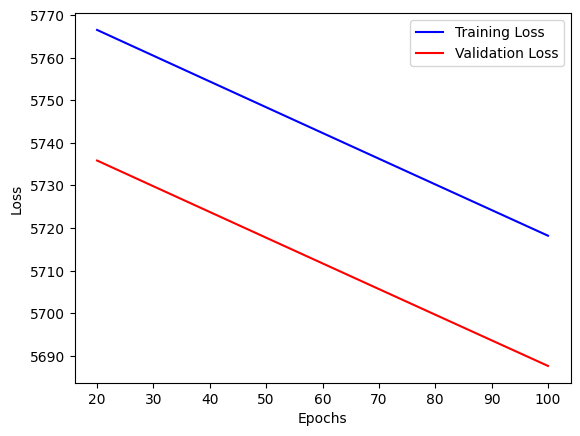

In [ ]:
epochs = range(20, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[19:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[19:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
saved_model = load_model('basic_sex_model.h5')
train_acc = saved_model.evaluate([train_data, train_sex], train_labels, verbose=0)
test_acc = saved_model.evaluate([test_data, test_sex], test_labels, verbose=0)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

Train: 20.991, Test: 18.977


In [ ]:
predictions = saved_model.predict([test_data, test_sex])
# Calculate different evaluation metrics
mse = mean_squared_error(test_labels, predictions)
mae = mean_absolute_error(test_labels, predictions)
r2 = r2_score(test_labels, predictions)

# Display the metrics
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

1/1 [==============================] - 0s 98ms/step
Mean Squared Error: 18.97686843771953
Mean Absolute Error: 3.5381048293340776
R-squared: 0.024615503375953973


The model has improved slightly

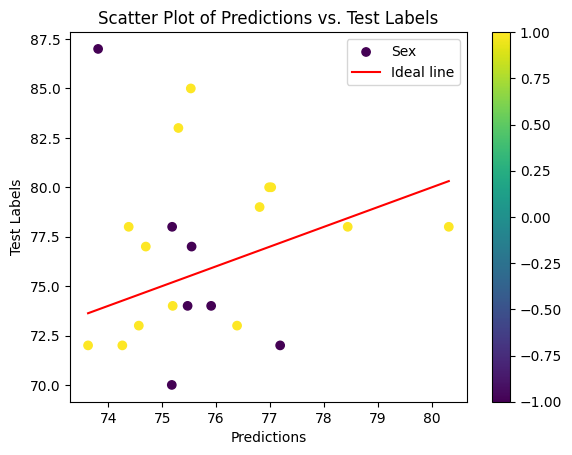

In [ ]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
plt.scatter(predictions, test_labels, c=test_sex, cmap='viridis', label='Sex')
plt.plot([min(predictions), max(predictions)], [min(predictions), max(predictions)], c='red', label='Ideal line')

# Add labels and title
plt.xlabel('Predictions')
plt.ylabel('Test Labels')
plt.title('Scatter Plot of Predictions vs. Test Labels')

# Add a legend
plt.legend()

# Show the plot
plt.colorbar()  # Add a colorbar to show the mapping of colors to sex_train values
plt.show()



We see that after adding sex the poins are more equally spread however the model still does not perform too well, perhaps tuning the model will help

### V4
Tuning the model with bayesian optimisation, this is more effecient than grid and random search (typically)

In [ ]:
pip install optuna

In [ ]:
from keras.backend import dropout
import time
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from keras.optimizers import Adam
import traceback
import gc

def create_model(kernel_size, num_layers, neurons1, neurons2, neurons3, learning_rate, dilation_rate, pool_size, dropout = dropout, activation = 'relu', strides=(1,1,1), padding='same'):
  # Define the input layer for the 3D Convolutional network
  input_img = Input(shape=(79, 95, 68, 1))
  x = Conv3D(neurons1, kernel_size=kernel_size, activation=activation, dilation_rate = dilation_rate)(input_img)
  x = MaxPooling3D(pool_size=pool_size)(x)
  x = Dropout(dropout)(x)
  # Apply 3D Convolutional layers with MaxPooling using the Functional API
  for i in range(num_layers):
    try:
      x = Conv3D(neurons1, kernel_size=kernel_size, activation=activation, dilation_rate = dilation_rate)(x)
      x = MaxPooling3D(pool_size=pool_size)(x)
      x = Dropout(dropout)(x)
    except:
      traceback.print_exc()
  # Flatten the output and add Dense layers for age prediction
  x = Flatten()(x)
  x = Dense(neurons2, activation=activation)(x)
  output_img = Dense(128, activation='relu')(x)
  # Define the input layer for the extra feature
  input_extra = Input(shape=(1,))
  # Concatenate the output of the Convolutional network with the extra feature
  merged = concatenate([output_img, input_extra])
  # Add Dense layers for further prediction
  merged = Dense(neurons3, activation=activation)(merged)
  output = Dense(1, activation='linear')(merged)  # Use 'linear' activation for regression tasks
  # Define the model with both inputs and the final output
  model = Model(inputs=[input_img, input_extra], outputs=output)
  optimizer = Adam(learning_rate=learning_rate)
  # Compile the model
  model.compile(loss='mean_squared_error', optimizer=optimizer)
  return model




def objective(trial, X = image_data,y=ages,z=sexes,K = 5):
    global the_best_score
    """return the mse"""
    num_layers = trial.suggest_int('num_layers', low = 1, high = 2, step = 1)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 64, step = 4)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 64, step = 4)
    neurons3 = trial.suggest_int('neurons3', low = 2, high = 64, step = 4)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 64, step = 8)
    learning_rate = trial.suggest_float('learning_rate', low = 0.00001, high = 0.01, step = 0.0005)
    dropout = trial.suggest_float('dropout', low = 0.05, high =0.4, step =10)
    kernel_size = trial.suggest_int('kernel_size', low = 2, high =5, step =1)
    dilation_rate = trial.suggest_int('dilation_rate', low = 1, high =3, step =1)
    pool_size = trial.suggest_int('pool_size', low = 1, high =3, step =1)

    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, start_from_epoch=50, baseline = 100)
    # random forest classifier object
    scores = []
    best_scores = []
    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = create_model(kernel_size = (kernel_size,kernel_size,kernel_size), num_layers = num_layers, neurons1 = neurons1, neurons2 = neurons2, neurons3 = neurons3, learning_rate = learning_rate, dilation_rate=(dilation_rate,dilation_rate,dilation_rate), pool_size=(pool_size,pool_size,pool_size), dropout=dropout)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=125, batch_size=batch_size, callbacks= [callback]).history
          scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0))# evaluate the test dataset
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=20, gc_after_trial=True)
time_bayesian = time.time() - time_start

columns = ['Number of iterations', 'Iteration Number of Optimal Hyperparamters', 'Score', 'Time Elapsed (s)']

# store result in a data frame
values_bayesian = [100, study.best_trial.number, study.best_trial.value, time_bayesian]
results_bayesian = pd.DataFrame([values_bayesian], columns = columns)

[I 2023-08-25 16:08:40,691] A new study created in memory with name: no-name-e5a08c86-388c-45a0-b2dd-6c14872a2fd2
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by [0.05, 0.05].
  warnings.warn(


Epoch 1/125
6/6 [==============================] - 5s 448ms/step - loss: 88969.4609 - val_loss: 3674.6887
Epoch 2/125
6/6 [==============================] - 2s 322ms/step - loss: 1089.7338 - val_loss: 121.5188
Epoch 3/125
6/6 [==============================] - 2s 321ms/step - loss: 633.3618 - val_loss: 148.9401
Epoch 4/125
6/6 [==============================] - 2s 322ms/step - loss: 423.2894 - val_loss: 1290.3792
Epoch 5/125
6/6 [==============================] - 2s 322ms/step - loss: 317.9021 - val_loss: 296.7629
Epoch 6/125
6/6 [==============================] - 2s 322ms/step - loss: 282.5038 - val_loss: 83.9244
Epoch 7/125
6/6 [==============================] - 2s 321ms/step - loss: 376.9296 - val_loss: 1004.4780
Epoch 8/125
6/6 [==============================] - 2s 323ms/step - loss: 292.2971 - val_loss: 51.1075
Epoch 9/125
6/6 [==============================] - 2s 322ms/step - loss: 192.4137 - val_loss: 362.8545
Epoch 10/125
6/6 [==============================] - 2s 323ms/step - l

[I 2023-08-25 16:21:40,491] Trial 0 finished with value: 2435.6233963012696 and parameters: {'num_layers': 2, 'neurons1': 6, 'neurons2': 42, 'neurons3': 26, 'batch_size': 16, 'learning_rate': 0.00601, 'dropout': 0.05, 'kernel_size': 2, 'dilation_rate': 2, 'pool_size': 1}. Best is trial 0 with value: 2435.6233963012696.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by [0

Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-28-3c72a69a1d9d>", line 66, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_25/max_pooling3d_63/MaxPool3D' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.la

Epoch 1/125
11/11 [==============================] - 5s 297ms/step - loss: 22766.8125 - val_loss: 1896.5732
Epoch 2/125
11/11 [==============================] - 2s 218ms/step - loss: 569.3665 - val_loss: 185.2666
Epoch 3/125
11/11 [==============================] - 2s 218ms/step - loss: 117.8085 - val_loss: 28.3888
Epoch 4/125
11/11 [==============================] - 2s 219ms/step - loss: 113.9799 - val_loss: 192.5909
Epoch 5/125
11/11 [==============================] - 2s 218ms/step - loss: 70.9473 - val_loss: 100.8729
Epoch 6/125
11/11 [==============================] - 2s 219ms/step - loss: 42.9468 - val_loss: 33.2713
Epoch 7/125
11/11 [==============================] - 2s 219ms/step - loss: 60.5486 - val_loss: 128.4658
Epoch 8/125
11/11 [==============================] - 2s 220ms/step - loss: 84.4587 - val_loss: 64.5412
Epoch 9/125
11/11 [==============================] - 2s 221ms/step - loss: 68.8338 - val_loss: 112.5579
Epoch 10/125
11/11 [==============================] - 2s 221

[I 2023-08-25 16:43:06,193] Trial 2 finished with value: 51.95138664245606 and parameters: {'num_layers': 1, 'neurons1': 46, 'neurons2': 38, 'neurons3': 10, 'batch_size': 8, 'learning_rate': 0.00801, 'dropout': 0.05, 'kernel_size': 4, 'dilation_rate': 3, 'pool_size': 2}. Best is trial 2 with value: 51.95138664245606.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by [0.0

Epoch 1/125
4/4 [==============================] - 3s 424ms/step - loss: 5748.9897 - val_loss: 4686.9385
Epoch 2/125
4/4 [==============================] - 0s 127ms/step - loss: 3181.8818 - val_loss: 380.8617
Epoch 3/125
4/4 [==============================] - 0s 120ms/step - loss: 1013.9907 - val_loss: 134.4550
Epoch 4/125
4/4 [==============================] - 0s 126ms/step - loss: 500.9504 - val_loss: 901.7470
Epoch 5/125
4/4 [==============================] - 0s 125ms/step - loss: 527.0599 - val_loss: 29.4616
Epoch 6/125
4/4 [==============================] - 0s 127ms/step - loss: 277.0748 - val_loss: 101.2344
Epoch 7/125
4/4 [==============================] - 0s 122ms/step - loss: 87.4561 - val_loss: 261.9198
Epoch 8/125
4/4 [==============================] - 0s 126ms/step - loss: 196.5688 - val_loss: 52.4031
Epoch 9/125
4/4 [==============================] - 0s 121ms/step - loss: 52.8061 - val_loss: 71.0954
Epoch 10/125
4/4 [==============================] - 0s 122ms/step - loss: 

[I 2023-08-25 16:48:06,425] Trial 3 finished with value: 41.112267684936526 and parameters: {'num_layers': 1, 'neurons1': 6, 'neurons2': 58, 'neurons3': 6, 'batch_size': 24, 'learning_rate': 0.00201, 'dropout': 0.05, 'kernel_size': 5, 'dilation_rate': 3, 'pool_size': 3}. Best is trial 3 with value: 41.112267684936526.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by [0.

Epoch 1/125
3/3 [==============================] - 2s 376ms/step - loss: 5847.6865 - val_loss: 5557.3872
Epoch 2/125
3/3 [==============================] - 0s 82ms/step - loss: 5687.6353 - val_loss: 5150.4844
Epoch 3/125
3/3 [==============================] - 0s 90ms/step - loss: 4429.4482 - val_loss: 2893.1152
Epoch 4/125
3/3 [==============================] - 0s 83ms/step - loss: 544.7090 - val_loss: 302.4848
Epoch 5/125
3/3 [==============================] - 0s 99ms/step - loss: 570.5295 - val_loss: 2284.3267
Epoch 6/125
3/3 [==============================] - 0s 90ms/step - loss: 729.1617 - val_loss: 2691.1506
Epoch 7/125
3/3 [==============================] - 0s 82ms/step - loss: 1013.9591 - val_loss: 1768.1416
Epoch 8/125
3/3 [==============================] - 0s 86ms/step - loss: 195.0097 - val_loss: 492.7818
Epoch 9/125
3/3 [==============================] - 0s 83ms/step - loss: 276.2383 - val_loss: 605.4499
Epoch 10/125
3/3 [==============================] - 0s 82ms/step - loss

[I 2023-08-25 16:50:19,561] Trial 4 finished with value: 257.03698501586916 and parameters: {'num_layers': 1, 'neurons1': 2, 'neurons2': 50, 'neurons3': 42, 'batch_size': 40, 'learning_rate': 0.00251, 'dropout': 0.05, 'kernel_size': 3, 'dilation_rate': 1, 'pool_size': 2}. Best is trial 3 with value: 41.112267684936526.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by [0

Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-28-3c72a69a1d9d>", line 66, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_41/max_pooling3d_95/MaxPool3D' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.la

Epoch 1/125
4/4 [==============================] - 4s 521ms/step - loss: 5474.6606 - val_loss: 2483.4260
Epoch 2/125
4/4 [==============================] - 1s 255ms/step - loss: 2951.8870 - val_loss: 257.6259
Epoch 3/125
4/4 [==============================] - 1s 255ms/step - loss: 1301.1364 - val_loss: 3140.3574
Epoch 4/125
4/4 [==============================] - 1s 258ms/step - loss: 3011.5913 - val_loss: 2718.7720
Epoch 5/125
4/4 [==============================] - 1s 252ms/step - loss: 1881.9557 - val_loss: 281.4946
Epoch 6/125
4/4 [==============================] - 1s 253ms/step - loss: 529.0984 - val_loss: 573.8058
Epoch 7/125
4/4 [==============================] - 1s 256ms/step - loss: 342.5430 - val_loss: 501.9586
Epoch 8/125
4/4 [==============================] - 1s 254ms/step - loss: 536.7872 - val_loss: 587.0404
Epoch 9/125
4/4 [==============================] - 1s 252ms/step - loss: 241.9645 - val_loss: 47.7505
Epoch 10/125
4/4 [==============================] - 1s 253ms/step 

[I 2023-08-25 16:59:20,998] Trial 6 finished with value: 100.1996063232422 and parameters: {'num_layers': 2, 'neurons1': 22, 'neurons2': 10, 'neurons3': 26, 'batch_size': 24, 'learning_rate': 0.00901, 'dropout': 0.05, 'kernel_size': 2, 'dilation_rate': 2, 'pool_size': 3}. Best is trial 3 with value: 41.112267684936526.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by [0

Epoch 1/125
3/3 [==============================] - 4s 579ms/step - loss: 5845.9297 - val_loss: 5632.5649
Epoch 2/125
3/3 [==============================] - 1s 243ms/step - loss: 5845.8438 - val_loss: 5632.5112
Epoch 3/125
3/3 [==============================] - 1s 242ms/step - loss: 5845.8008 - val_loss: 5632.4546
Epoch 4/125
3/3 [==============================] - 1s 250ms/step - loss: 5845.7803 - val_loss: 5632.3975
Epoch 5/125
3/3 [==============================] - 1s 242ms/step - loss: 5845.6250 - val_loss: 5632.3394
Epoch 6/125
3/3 [==============================] - 1s 243ms/step - loss: 5845.6021 - val_loss: 5632.2803
Epoch 7/125
3/3 [==============================] - 1s 245ms/step - loss: 5845.5518 - val_loss: 5632.2192
Epoch 8/125
3/3 [==============================] - 1s 243ms/step - loss: 5845.4751 - val_loss: 5632.1577
Epoch 9/125
3/3 [==============================] - 1s 240ms/step - loss: 5845.4351 - val_loss: 5632.0947
Epoch 10/125
3/3 [==============================] - 1s 

[I 2023-08-25 17:08:19,095] Trial 7 finished with value: 4733.929248046875 and parameters: {'num_layers': 2, 'neurons1': 10, 'neurons2': 6, 'neurons3': 50, 'batch_size': 40, 'learning_rate': 1e-05, 'dropout': 0.05, 'kernel_size': 3, 'dilation_rate': 2, 'pool_size': 2}. Best is trial 3 with value: 41.112267684936526.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by [0.05

Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-28-3c72a69a1d9d>", line 66, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

OOM when allocating tensor with shape[48,75,91,64,54] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node model_52/conv3d_130/Relu-0-1-TransposeNCDHWToNDHWC-LayoutOptimizer}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Ea

Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-28-3c72a69a1d9d>", line 66, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

OOM when allocating tensor with shape[512,39,47,33,42] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node model_53/conv3d_132/Conv3D-0-0-TransposeNCDHWToNDHWC-LayoutOptimizer}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in

Epoch 1/125
4/4 [==============================] - 4s 556ms/step - loss: 5005.2354 - val_loss: 89.2028
Epoch 2/125
4/4 [==============================] - 1s 194ms/step - loss: 2126.6099 - val_loss: 1282.0725
Epoch 3/125
4/4 [==============================] - 1s 198ms/step - loss: 1890.7843 - val_loss: 2641.9868
Epoch 4/125
4/4 [==============================] - 1s 193ms/step - loss: 1863.5199 - val_loss: 274.5761
Epoch 5/125
4/4 [==============================] - 1s 198ms/step - loss: 401.5710 - val_loss: 632.3124
Epoch 6/125
4/4 [==============================] - 1s 199ms/step - loss: 363.0191 - val_loss: 488.7914
Epoch 7/125
4/4 [==============================] - 1s 195ms/step - loss: 469.2496 - val_loss: 311.7361
Epoch 8/125
4/4 [==============================] - 1s 194ms/step - loss: 124.2529 - val_loss: 147.9896
Epoch 9/125
4/4 [==============================] - 1s 193ms/step - loss: 172.9916 - val_loss: 66.8299
Epoch 10/125
4/4 [==============================] - 1s 198ms/step - l

[I 2023-08-25 17:16:30,763] Trial 10 finished with value: 2258.9090991973876 and parameters: {'num_layers': 1, 'neurons1': 18, 'neurons2': 62, 'neurons3': 2, 'batch_size': 24, 'learning_rate': 0.00351, 'dropout': 0.05, 'kernel_size': 4, 'dilation_rate': 3, 'pool_size': 3}. Best is trial 3 with value: 41.112267684936526.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by [

Epoch 1/125
11/11 [==============================] - 5s 268ms/step - loss: 2367.5996 - val_loss: 949.7985
Epoch 2/125
11/11 [==============================] - 2s 191ms/step - loss: 486.7732 - val_loss: 133.9610
Epoch 3/125
11/11 [==============================] - 2s 190ms/step - loss: 112.6574 - val_loss: 76.9620
Epoch 4/125
11/11 [==============================] - 2s 191ms/step - loss: 41.0628 - val_loss: 31.5384
Epoch 5/125
11/11 [==============================] - 2s 192ms/step - loss: 35.7946 - val_loss: 35.7592
Epoch 6/125
11/11 [==============================] - 2s 190ms/step - loss: 28.1001 - val_loss: 194.0474
Epoch 7/125
11/11 [==============================] - 2s 192ms/step - loss: 70.4065 - val_loss: 28.8280
Epoch 8/125
11/11 [==============================] - 2s 191ms/step - loss: 45.7775 - val_loss: 103.2729
Epoch 9/125
11/11 [==============================] - 2s 191ms/step - loss: 69.6175 - val_loss: 38.4677
Epoch 10/125
11/11 [==============================] - 2s 192ms/st

[I 2023-08-25 17:34:25,750] Trial 11 finished with value: 49.3770133972168 and parameters: {'num_layers': 1, 'neurons1': 42, 'neurons2': 22, 'neurons3': 14, 'batch_size': 8, 'learning_rate': 0.00251, 'dropout': 0.05, 'kernel_size': 4, 'dilation_rate': 3, 'pool_size': 2}. Best is trial 3 with value: 41.112267684936526.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by [0.

Epoch 1/125
11/11 [==============================] - 4s 184ms/step - loss: 1733.2483 - val_loss: 809.6069
Epoch 2/125
11/11 [==============================] - 1s 121ms/step - loss: 389.2313 - val_loss: 327.8923
Epoch 3/125
11/11 [==============================] - 1s 121ms/step - loss: 105.8435 - val_loss: 27.1616
Epoch 4/125
11/11 [==============================] - 1s 121ms/step - loss: 51.4182 - val_loss: 135.2103
Epoch 5/125
11/11 [==============================] - 1s 121ms/step - loss: 142.7525 - val_loss: 218.9170
Epoch 6/125
11/11 [==============================] - 1s 122ms/step - loss: 104.2601 - val_loss: 53.2410
Epoch 7/125
11/11 [==============================] - 1s 121ms/step - loss: 48.0029 - val_loss: 29.1131
Epoch 8/125
11/11 [==============================] - 1s 121ms/step - loss: 30.1245 - val_loss: 55.4884
Epoch 9/125
11/11 [==============================] - 1s 121ms/step - loss: 45.1956 - val_loss: 33.0222
Epoch 10/125
11/11 [==============================] - 1s 121ms/

[I 2023-08-25 17:46:50,705] Trial 12 finished with value: 44.73039169311524 and parameters: {'num_layers': 1, 'neurons1': 30, 'neurons2': 22, 'neurons3': 14, 'batch_size': 8, 'learning_rate': 0.00251, 'dropout': 0.05, 'kernel_size': 5, 'dilation_rate': 3, 'pool_size': 2}. Best is trial 3 with value: 41.112267684936526.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by [0

Epoch 1/125
4/4 [==============================] - 6s 954ms/step - loss: 3739.0391 - val_loss: 1208.3839
Epoch 2/125
4/4 [==============================] - 1s 289ms/step - loss: 1104.4915 - val_loss: 242.1921
Epoch 3/125
4/4 [==============================] - 1s 288ms/step - loss: 448.8827 - val_loss: 452.2839
Epoch 4/125
4/4 [==============================] - 1s 287ms/step - loss: 227.2844 - val_loss: 153.1726
Epoch 5/125
4/4 [==============================] - 1s 287ms/step - loss: 120.3485 - val_loss: 101.5985
Epoch 6/125
4/4 [==============================] - 1s 290ms/step - loss: 112.8167 - val_loss: 35.0393
Epoch 7/125
4/4 [==============================] - 1s 294ms/step - loss: 40.3519 - val_loss: 52.4182
Epoch 8/125
4/4 [==============================] - 1s 289ms/step - loss: 39.5094 - val_loss: 27.9893
Epoch 9/125
4/4 [==============================] - 1s 293ms/step - loss: 31.1117 - val_loss: 22.7076
Epoch 10/125
4/4 [==============================] - 1s 289ms/step - loss: 32.

[I 2023-08-25 17:57:28,225] Trial 13 finished with value: 25.143406677246094 and parameters: {'num_layers': 1, 'neurons1': 26, 'neurons2': 18, 'neurons3': 18, 'batch_size': 24, 'learning_rate': 0.00451, 'dropout': 0.05, 'kernel_size': 5, 'dilation_rate': 3, 'pool_size': 2}. Best is trial 13 with value: 25.143406677246094.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by

Epoch 1/125
4/4 [==============================] - 4s 638ms/step - loss: 4542.4595 - val_loss: 15693.9014
Epoch 2/125
4/4 [==============================] - 1s 198ms/step - loss: 5660.8354 - val_loss: 3969.9111
Epoch 3/125
4/4 [==============================] - 1s 192ms/step - loss: 4720.5664 - val_loss: 5170.1729
Epoch 4/125
4/4 [==============================] - 1s 196ms/step - loss: 5407.1450 - val_loss: 5176.6309
Epoch 5/125
4/4 [==============================] - 1s 195ms/step - loss: 5281.2441 - val_loss: 4703.7891
Epoch 6/125
4/4 [==============================] - 1s 190ms/step - loss: 4454.6724 - val_loss: 2636.4497
Epoch 7/125
4/4 [==============================] - 1s 191ms/step - loss: 1404.7778 - val_loss: 1590.4088
Epoch 8/125
4/4 [==============================] - 1s 191ms/step - loss: 1395.2354 - val_loss: 198.3737
Epoch 9/125
4/4 [==============================] - 1s 190ms/step - loss: 670.3311 - val_loss: 950.7520
Epoch 10/125
4/4 [==============================] - 1s 19

[I 2023-08-25 18:05:10,114] Trial 14 finished with value: 27.21058464050293 and parameters: {'num_layers': 1, 'neurons1': 18, 'neurons2': 58, 'neurons3': 22, 'batch_size': 24, 'learning_rate': 0.00451, 'dropout': 0.05, 'kernel_size': 5, 'dilation_rate': 3, 'pool_size': 3}. Best is trial 13 with value: 25.143406677246094.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by 

Epoch 1/125
3/3 [==============================] - 5s 1s/step - loss: 55290.4023 - val_loss: 201.7643
Epoch 2/125
3/3 [==============================] - 1s 313ms/step - loss: 3017.3691 - val_loss: 5714.8618
Epoch 3/125
3/3 [==============================] - 1s 308ms/step - loss: 5805.3511 - val_loss: 5705.6821
Epoch 4/125
3/3 [==============================] - 1s 306ms/step - loss: 5793.6118 - val_loss: 5691.6934
Epoch 5/125
3/3 [==============================] - 1s 307ms/step - loss: 5779.6665 - val_loss: 5676.5615
Epoch 6/125
3/3 [==============================] - 1s 305ms/step - loss: 5763.0225 - val_loss: 5655.0439
Epoch 7/125
3/3 [==============================] - 1s 304ms/step - loss: 5738.8052 - val_loss: 5621.6226
Epoch 8/125
3/3 [==============================] - 1s 307ms/step - loss: 5700.8325 - val_loss: 5572.8613
Epoch 9/125
3/3 [==============================] - 1s 305ms/step - loss: 5645.9805 - val_loss: 5500.8735
Epoch 10/125
3/3 [==============================] - 1s 315

[I 2023-08-25 18:13:16,208] Trial 15 finished with value: 49.38838920593262 and parameters: {'num_layers': 1, 'neurons1': 18, 'neurons2': 14, 'neurons3': 22, 'batch_size': 32, 'learning_rate': 0.00501, 'dropout': 0.05, 'kernel_size': 4, 'dilation_rate': 3, 'pool_size': 2}. Best is trial 13 with value: 25.143406677246094.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by 

Epoch 1/125
3/3 [==============================] - 5s 984ms/step - loss: 4783.1660 - val_loss: 8072.8379
Epoch 2/125
3/3 [==============================] - 1s 325ms/step - loss: 3988.8037 - val_loss: 3961.3750
Epoch 3/125
3/3 [==============================] - 1s 318ms/step - loss: 4247.6958 - val_loss: 4946.9336
Epoch 4/125
3/3 [==============================] - 1s 317ms/step - loss: 4737.1460 - val_loss: 4456.0239
Epoch 5/125
3/3 [==============================] - 1s 325ms/step - loss: 3867.4094 - val_loss: 2252.7620
Epoch 6/125
3/3 [==============================] - 1s 317ms/step - loss: 1195.1796 - val_loss: 896.8793
Epoch 7/125
3/3 [==============================] - 1s 317ms/step - loss: 1514.2507 - val_loss: 43.6186
Epoch 8/125
3/3 [==============================] - 1s 319ms/step - loss: 246.1110 - val_loss: 1085.2833
Epoch 9/125
3/3 [==============================] - 1s 316ms/step - loss: 983.4470 - val_loss: 593.0843
Epoch 10/125
3/3 [==============================] - 1s 317ms/

[I 2023-08-25 18:22:27,965] Trial 16 finished with value: 25.94476890563965 and parameters: {'num_layers': 1, 'neurons1': 26, 'neurons2': 26, 'neurons3': 38, 'batch_size': 32, 'learning_rate': 0.00501, 'dropout': 0.05, 'kernel_size': 5, 'dilation_rate': 3, 'pool_size': 3}. Best is trial 13 with value: 25.143406677246094.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by 

Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-28-3c72a69a1d9d>", line 66, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_89/conv3d_206/Conv3D/SpaceToBatchND' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      

Epoch 1/125
3/3 [==============================] - 6s 1s/step - loss: 4394.0010 - val_loss: 1155.5045
Epoch 2/125
3/3 [==============================] - 1s 409ms/step - loss: 1956.4630 - val_loss: 1586.9412
Epoch 3/125
3/3 [==============================] - 1s 408ms/step - loss: 844.1572 - val_loss: 583.7995
Epoch 4/125
3/3 [==============================] - 1s 408ms/step - loss: 403.1529 - val_loss: 888.0157
Epoch 5/125
3/3 [==============================] - 1s 408ms/step - loss: 658.6427 - val_loss: 109.8808
Epoch 6/125
3/3 [==============================] - 1s 418ms/step - loss: 163.8743 - val_loss: 194.6025
Epoch 7/125
3/3 [==============================] - 1s 417ms/step - loss: 153.8726 - val_loss: 345.0151
Epoch 8/125
3/3 [==============================] - 1s 409ms/step - loss: 241.0944 - val_loss: 65.4685
Epoch 9/125
3/3 [==============================] - 1s 418ms/step - loss: 63.4008 - val_loss: 90.0770
Epoch 10/125
3/3 [==============================] - 1s 409ms/step - loss: 8

[I 2023-08-25 18:33:56,277] Trial 18 finished with value: 68.97675132751465 and parameters: {'num_layers': 1, 'neurons1': 26, 'neurons2': 14, 'neurons3': 34, 'batch_size': 32, 'learning_rate': 0.00401, 'dropout': 0.05, 'kernel_size': 3, 'dilation_rate': 3, 'pool_size': 2}. Best is trial 13 with value: 25.143406677246094.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 64] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 62].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [0.05, 0.4] and step=10, but the range is not divisible by `step`. It will be replaced by 

Epoch 1/125
6/6 [==============================] - 5s 443ms/step - loss: 71830.6953 - val_loss: 6073.8350
Epoch 2/125
6/6 [==============================] - 2s 308ms/step - loss: 5679.5571 - val_loss: 6095.7944
Epoch 3/125
6/6 [==============================] - 2s 307ms/step - loss: 5637.0679 - val_loss: 5874.8374
Epoch 4/125
6/6 [==============================] - 2s 308ms/step - loss: 5148.0571 - val_loss: 4387.1172
Epoch 5/125
6/6 [==============================] - 2s 308ms/step - loss: 2805.9980 - val_loss: 235.8010
Epoch 6/125
6/6 [==============================] - 2s 309ms/step - loss: 679.0045 - val_loss: 282.8797
Epoch 7/125
6/6 [==============================] - 2s 307ms/step - loss: 167.9847 - val_loss: 556.7194
Epoch 8/125
6/6 [==============================] - 2s 308ms/step - loss: 439.8600 - val_loss: 225.2230
Epoch 9/125
6/6 [==============================] - 2s 308ms/step - loss: 74.5727 - val_loss: 102.7080
Epoch 10/125
6/6 [==============================] - 2s 307ms/ste

[I 2023-08-25 18:50:44,074] Trial 19 finished with value: 61.40744323730469 and parameters: {'num_layers': 1, 'neurons1': 38, 'neurons2': 30, 'neurons3': 42, 'batch_size': 16, 'learning_rate': 0.00601, 'dropout': 0.05, 'kernel_size': 4, 'dilation_rate': 2, 'pool_size': 3}. Best is trial 13 with value: 25.143406677246094.


In [ ]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [ ]:
bayesian_results.sort_values(by=['val'])

In [ ]:
optuna.visualization.plot_contour(study)

In [ ]:
optuna.visualization.plot_param_importances(study)

Tuning the model seems to make no real improvement, therefore other approaches must be taken, transfer learning can help as we only have 100 images

### PIP installs for BO and 3D VGG

In [29]:
pip install keras_applications

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.4 MB/s eta 0:00:00


In [30]:
pip install classification-models-3D

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.5/69.5 kB 1.9 MB/s eta 0:00:00


In [31]:
pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.2/404.2 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.4/225.4 kB 26.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 10.8 MB/s eta 0:00:00


In [32]:
import optuna
from optuna.samplers import TPESampler



### Version 5 no fine tuning

In [ ]:
from classification_models_3D.tfkeras import Classifiers

vgg19, preprocess_input = Classifiers.get('vgg19')
pretrained_model = vgg19(input_shape=(79, 95, 68, 3), weights='imagenet')

In [ ]:
def compile_model():

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(256, activation='relu')(x)
  x = Dense(64, activation='relu')(x)

  additional_input = Input(shape=(1,))
  # Concatenate the flattened output with the new input
  concatenated = concatenate([x, additional_input])
  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[23:]:
            layer.trainable = True

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

As this cnn takes in rgb input we must duplicate each image twice so that the input shapes match

In [ ]:
duplicated_data = np.repeat(image_data, 3, axis=-1)
print(duplicated_data.shape)

(102, 79, 95, 68, 3)


In [ ]:
from sklearn.model_selection import StratifiedKFold

def cross_validate(X, y, z, K = 5):
    scores = []
    histories = []
    r2 = []

    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = compile_model() # compile model
        histories.append(model.fit([X[train], z[train]], y[train],
                                   validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict([X[test], z[test]]), y[test]))
    print(model.summary())
    return scores, histories, r2

In [ ]:
scores_115, histories_115, r2_115 = cross_validate(duplicated_data, ages, sexes, K = 5)

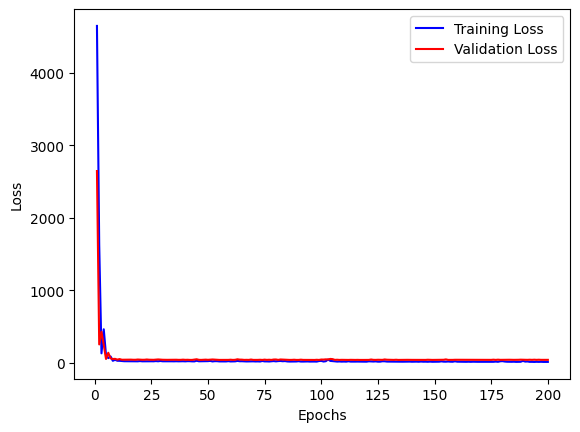

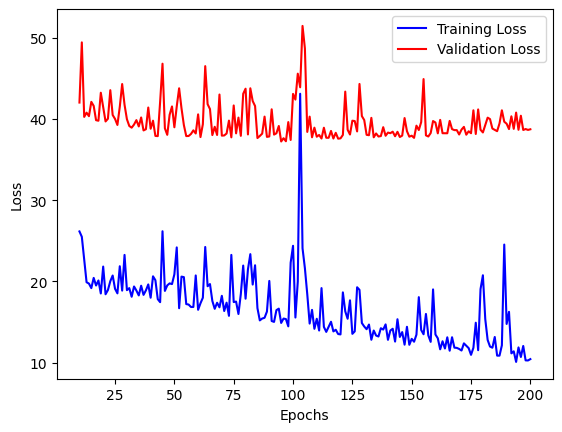

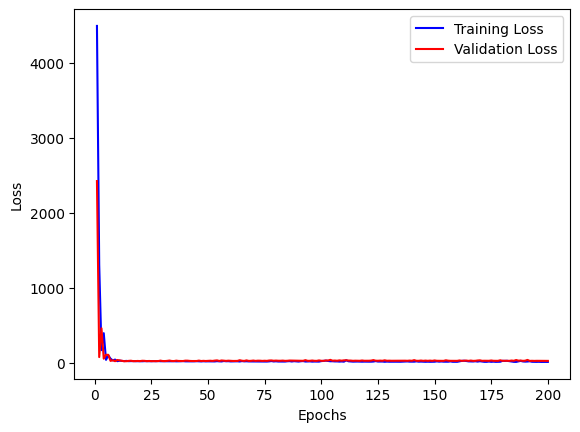

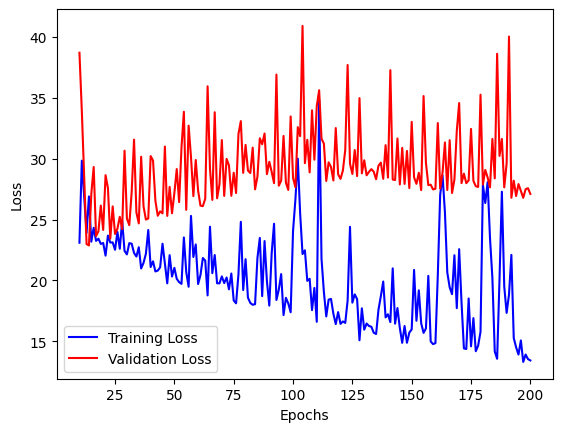

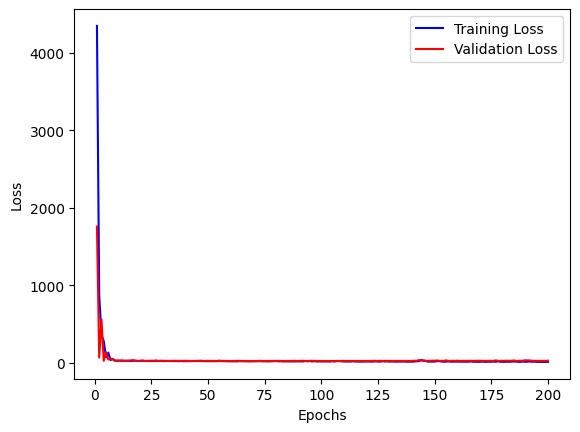

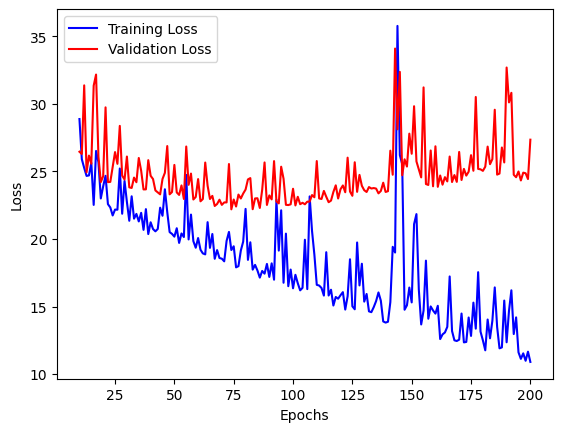

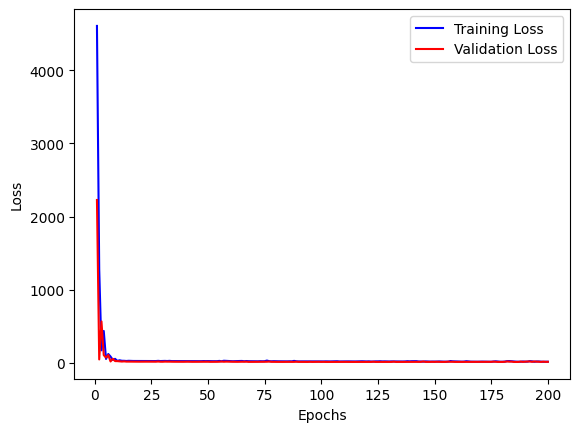

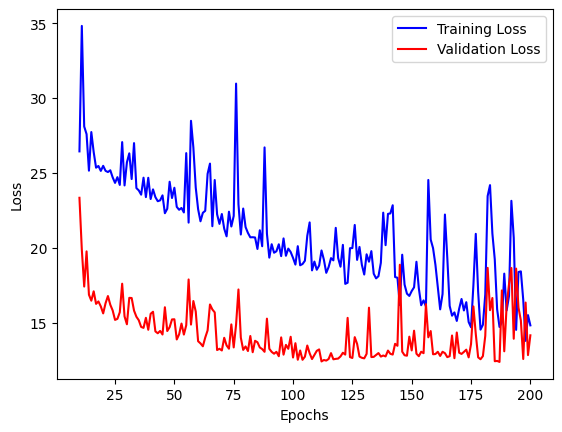

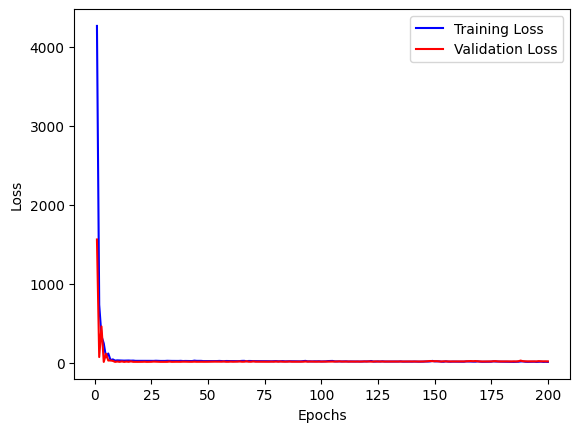

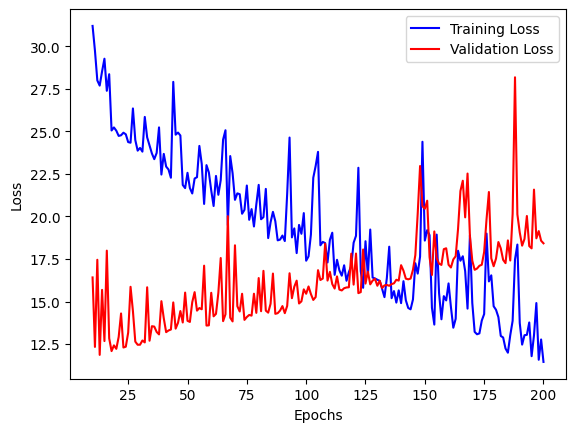

In [ ]:
for history in (histories_115):
  # Access the loss values from the training history
  train_loss = history['loss']
  val_loss = history['val_loss']

  # Access the number of epochs
  epochs = range(1, len(train_loss) + 1)

  # Plot the training and validation curves
  plt.plot(epochs, train_loss, 'b', label='Training Loss')
  plt.plot(epochs, val_loss, 'r', label='Validation Loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()
  epochs = range(10, len(train_loss) + 1)

  # Plot the training and validation curves
  plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
  plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

In [ ]:
dup_bae_3d_im_train = np.repeat(bae_3d_im_train, 3, axis=-1)
dup_bae_3d_im_test = np.repeat(bae_3d_im_test, 3, axis=-1)

model = compile_model()

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, start_from_epoch=10, baseline = 50)
history = model.fit([dup_bae_3d_im_train, bae_3d_sexes_train], bae_3d_ages_train, validation_data= ([dup_bae_3d_im_test, bae_3d_sexes_test], bae_3d_ages_test), epochs = 100, batch_size = 16, callbacks =[callback]).history


Epoch 1/100
6/6 [==============================] - 10s 2s/step - loss: 4509.7544 - mae: 66.8506 - val_loss: 2929.5027 - val_mae: 53.9292
Epoch 2/100
6/6 [==============================] - 10s 2s/step - loss: 1872.4474 - mae: 42.2503 - val_loss: 513.2653 - val_mae: 22.2073
Epoch 3/100
6/6 [==============================] - 11s 2s/step - loss: 171.1388 - mae: 10.7153 - val_loss: 193.8350 - val_mae: 13.1940
Epoch 4/100
6/6 [==============================] - 10s 2s/step - loss: 429.8904 - mae: 20.0234 - val_loss: 316.1963 - val_mae: 17.2167
Epoch 5/100
6/6 [==============================] - 10s 2s/step - loss: 207.0587 - mae: 12.8802 - val_loss: 21.8537 - val_mae: 3.7059
Epoch 6/100
6/6 [==============================] - 10s 2s/step - loss: 53.6144 - mae: 6.0504 - val_loss: 158.7791 - val_mae: 11.7827
Epoch 7/100
6/6 [==============================] - 10s 2s/step - loss: 124.6684 - mae: 10.2825 - val_loss: 112.9653 - val_mae: 9.6458
Epoch 8/100
6/6 [==============================] - 10s 2s

In [ ]:
predictions = model.predict([dup_bae_3d_im_test, bae_3d_sexes_test])

1/1 [==============================] - 0s 300ms/step


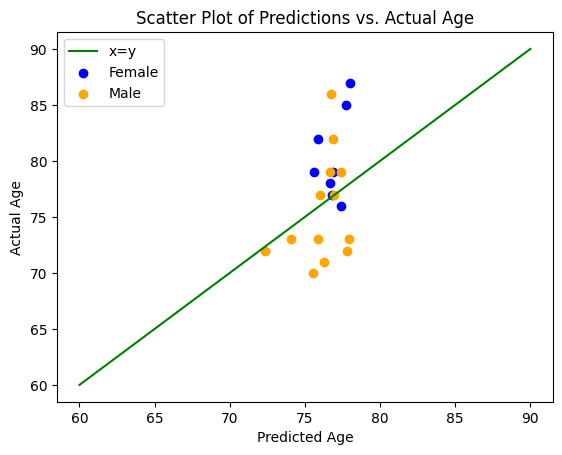

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    return r2, rmse, mse, mae

# Sample data


r2, rmse, mse, mae = evaluate_predictions(predictions, bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")


R^2: 0.10758218365706085
RMSE: 4.568992950712369
MSE: 20.875696583659323
MAE: 3.6234228951590404


### Version 4 no fine tuning

In [ ]:
from classification_models_3D.tfkeras import Classifiers

vgg16, preprocess_input = Classifiers.get('vgg16')
pretrained_model = vgg16(input_shape=(79, 95, 68, 3), weights='imagenet')

In [ ]:
def compile_model():

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(256, activation='relu')(x)
  x = Dense(64, activation='relu')(x)

  additional_input = Input(shape=(1,))
  # Concatenate the flattened output with the new input
  concatenated = concatenate([x, additional_input])
  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[20:]:
            layer.trainable = True

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [ ]:
dup_bae_3d_im_train = np.repeat(bae_3d_im_train, 3, axis=-1)
dup_bae_3d_im_test = np.repeat(bae_3d_im_test, 3, axis=-1)

model = compile_model()

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, start_from_epoch=10, baseline = 50)
history = model.fit([dup_bae_3d_im_train, bae_3d_sexes_train], bae_3d_ages_train, validation_data= ([dup_bae_3d_im_test, bae_3d_sexes_test], bae_3d_ages_test), epochs = 200, batch_size = 16, callbacks =[callback]).history

Epoch 1/200
6/6 [==============================] - 17s 3s/step - loss: 2118.8062 - mse: 2118.8062 - mae: 39.6291 - val_loss: 40.2388 - val_mse: 40.2388 - val_mae: 5.0606
Epoch 2/200
6/6 [==============================] - 9s 2s/step - loss: 286.8680 - mse: 286.8680 - mae: 15.1327 - val_loss: 23.9797 - val_mse: 23.9797 - val_mae: 3.9794
Epoch 3/200
6/6 [==============================] - 9s 2s/step - loss: 209.3670 - mse: 209.3670 - mae: 12.5895 - val_loss: 27.0600 - val_mse: 27.0600 - val_mae: 4.2433
Epoch 4/200
6/6 [==============================] - 9s 2s/step - loss: 81.7718 - mse: 81.7718 - mae: 7.7214 - val_loss: 99.9086 - val_mse: 99.9086 - val_mae: 8.7136
Epoch 5/200
6/6 [==============================] - 9s 2s/step - loss: 42.4092 - mse: 42.4092 - mae: 5.3941 - val_loss: 30.8401 - val_mse: 30.8401 - val_mae: 4.6959
Epoch 6/200
6/6 [==============================] - 9s 1s/step - loss: 33.3838 - mse: 33.3838 - mae: 4.5673 - val_loss: 54.5408 - val_mse: 54.5408 - val_mae: 5.8317
Epoc

In [ ]:
predictions = model.predict([dup_bae_3d_im_test, bae_3d_sexes_test])

1/1 [==============================] - 0s 276ms/step


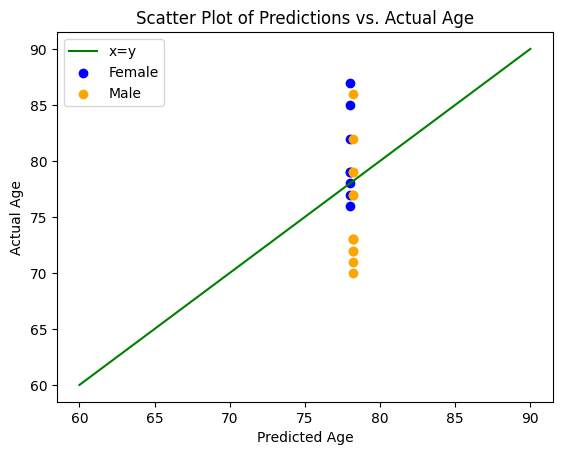

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    return r2, rmse, mse, mae

# Sample data


r2, rmse, mse, mae = evaluate_predictions(predictions, bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")


R^2: -0.5425256889744725
RMSE: 6.006930050674607
MSE: 36.08320863369764
MAE: 5.041613624209449


### Version 4 fine-tuning v2

In [ ]:
from classification_models_3D.tfkeras import Classifiers

vgg16, preprocess_input = Classifiers.get('vgg16')
pretrained_model = vgg16(input_shape=(79, 95, 68, 3), weights='imagenet')

In [ ]:
import keras.backend as K
from tensorflow.keras.initializers import GlorotUniform
import random
def compile_model():

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(256, activation='relu')(x)
  x = Dense(64, activation='relu')(x)

  additional_input = Input(shape=(1,))
  # Concatenate the flattened output with the new input
  concatenated = concatenate([x, additional_input])
  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[15:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[15:19]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])




  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [ ]:
dup_bae_3d_im_train = np.repeat(bae_3d_im_train, 3, axis=-1)
dup_bae_3d_im_test = np.repeat(bae_3d_im_test, 3, axis=-1)

model = compile_model()

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, start_from_epoch=10, baseline = 50)
history = model.fit([dup_bae_3d_im_train, bae_3d_sexes_train], bae_3d_ages_train, validation_data= ([dup_bae_3d_im_test, bae_3d_sexes_test], bae_3d_ages_test), epochs = 200, batch_size = 16, callbacks =[callback]).history

Epoch 1/200
6/6 [==============================] - 12s 2s/step - loss: 499242.0625 - mae: 376.5577 - val_loss: 1181.7386 - val_mae: 34.0078
Epoch 2/200
6/6 [==============================] - 10s 2s/step - loss: 1312.9357 - mae: 31.1180 - val_loss: 616.8050 - val_mae: 24.3045
Epoch 3/200
6/6 [==============================] - 10s 2s/step - loss: 375.3654 - mae: 16.7743 - val_loss: 274.2664 - val_mae: 15.7258
Epoch 4/200
6/6 [==============================] - 9s 2s/step - loss: 108.6578 - mae: 8.5633 - val_loss: 57.2607 - val_mae: 6.0682
Epoch 5/200
6/6 [==============================] - 9s 2s/step - loss: 153.5462 - mae: 10.8866 - val_loss: 103.2562 - val_mae: 8.9659
Epoch 6/200
6/6 [==============================] - 9s 2s/step - loss: 91.0633 - mae: 8.2239 - val_loss: 90.1188 - val_mae: 7.8995
Epoch 7/200
6/6 [==============================] - 9s 2s/step - loss: 48.1290 - mae: 5.3346 - val_loss: 45.9017 - val_mae: 5.5709
Epoch 8/200
6/6 [==============================] - 9s 1s/step - l

In [ ]:
predictions = model.predict([dup_bae_3d_im_test, bae_3d_sexes_test])

1/1 [==============================] - 0s 286ms/step


In [ ]:
for layer in model.layers:
    if layer.trainable:
        print(f"Layer {layer.name} is trainable (not frozen).")
    else:
        print(f"Layer {layer.name} is not trainable (frozen).")


Layer input_61 is trainable (not frozen).
Layer block1_conv1 is not trainable (frozen).
Layer block1_conv2 is not trainable (frozen).
Layer block1_pool is not trainable (frozen).
Layer block2_conv1 is not trainable (frozen).
Layer block2_conv2 is not trainable (frozen).
Layer block2_pool is not trainable (frozen).
Layer block3_conv1 is not trainable (frozen).
Layer block3_conv2 is not trainable (frozen).
Layer block3_conv3 is not trainable (frozen).
Layer block3_pool is not trainable (frozen).
Layer block4_conv1 is not trainable (frozen).
Layer block4_conv2 is not trainable (frozen).
Layer block4_conv3 is not trainable (frozen).
Layer block4_pool is not trainable (frozen).
Layer block5_conv1 is trainable (not frozen).
Layer block5_conv2 is trainable (not frozen).
Layer block5_conv3 is trainable (not frozen).
Layer block5_pool is trainable (not frozen).
Layer flatten_61 is trainable (not frozen).
Layer dense_183 is trainable (not frozen).
Layer dense_184 is trainable (not frozen).
Layer

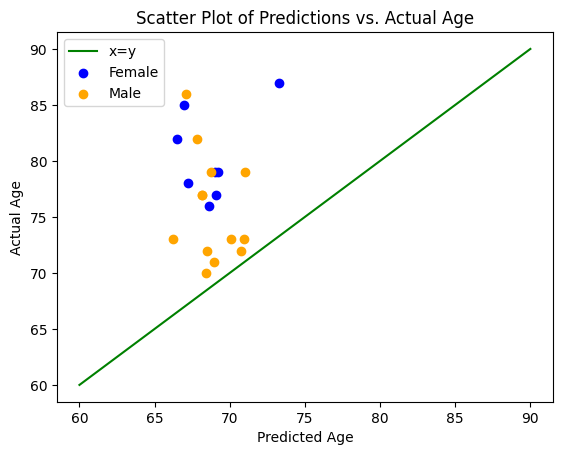

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    return r2, rmse, mse, mae

# Sample data


r2, rmse, mse, mae = evaluate_predictions(predictions, bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")


R^2: -3.3612832460244286
RMSE: 10.10051501414622
MSE: 102.02040355099321
MAE: 8.672603062220983


### Version 4 BO old gen

In [ ]:
from classification_models_3D.tfkeras import Classifiers

vgg16, preprocess_input = Classifiers.get('vgg16')
pretrained_model = vgg16(input_shape=(79, 95, 68, 3), weights='imagenet')

In [ ]:
def create_model(num_ft_layers, neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)

  x = Dense(neurons2, activation='relu')(x)

  additional_input = Input(shape=(1,))
  concatenated = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input

  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[len(pretrained_model.layers)- num_ft_layers:]:
            layer.trainable = True

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [ ]:
dup_bae_3d_im_train = np.repeat(bae_3d_im_train, 3, axis=-1)
dup_bae_3d_im_test = np.repeat(bae_3d_im_test, 3, axis=-1)

In [ ]:
from keras.backend import dropout
import time
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from keras.optimizers import Adam
import traceback

def objective(trial, X = dup_bae_3d_im_train, y = bae_3d_ages_train, z = bae_3d_sexes_train,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 8, step = 1)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 16, step = 1)


    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, start_from_epoch=10, baseline = 50)
    # random forest classifier object
    scores = []
    best_scores = []
    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = create_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback]).history
          scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0))# evaluate the test dataset
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=5, gc_after_trial=True)
time_bayesian = time.time() - time_start

columns = ['Number of iterations', 'Iteration Number of Optimal Hyperparamters', 'Score', 'Time Elapsed (s)']

# store result in a data frame
values_bayesian = [100, study.best_trial.number, study.best_trial.value, time_bayesian]
results_bayesian = pd.DataFrame([values_bayesian], columns = columns)


[I 2023-08-27 19:44:21,431] A new study created in memory with name: no-name-8552fa5f-43c6-4924-ac6e-9de030c8aaa7
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
4/4 [==============================] - 35s 6s/step - loss: 3874.7957 - mae: 60.9660 - val_loss: 388.5290 - val_mae: 18.9716
Epoch 2/100
4/4 [==============================] - 8s 2s/step - loss: 502.8992 - mae: 21.3821 - val_loss: 72.4673 - val_mae: 7.0550
Epoch 3/100
4/4 [==============================] - 8s 2s/step - loss: 159.6186 - mae: 10.7374 - val_loss: 293.2043 - val_mae: 16.2571
Epoch 4/100
4/4 [==============================] - 8s 2s/step - loss: 128.7793 - mae: 8.8358 - val_loss: 121.3681 - val_mae: 9.6153
Epoch 5/100
4/4 [==============================] - 8s 2s/step - loss: 129.7841 - mae: 10.3931 - val_loss: 33.3383 - val_mae: 4.8223
Epoch 6/100
4/4 [==============================] - 8s 2s/step - loss: 46.8958 - mae: 5.7990 - val_loss: 74.8837 - val_mae: 7.2271
Epoch 7/100
4/4 [==============================] - 8s 2s/step - loss: 36.6199 - mae: 4.8440 - val_loss: 34.1089 - val_mae: 4.8735
Epoch 8/100
4/4 [==============================] - 8s 2s/step - loss: 29.6

[I 2023-08-27 19:57:50,237] Trial 0 finished with value: 13.479734619458517 and parameters: {'num_layers': 7, 'neurons1': 18, 'neurons2': 98, 'batch_size': 14}. Best is trial 0 with value: 13.479734619458517.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
5/5 [==============================] - 18s 4s/step - loss: 2771.7520 - mae: 43.7115 - val_loss: 360.7971 - val_mae: 18.3561
Epoch 2/100
5/5 [==============================] - 8s 2s/step - loss: 647.6658 - mae: 24.6932 - val_loss: 206.3732 - val_mae: 13.5101
Epoch 3/100
5/5 [==============================] - 8s 2s/step - loss: 120.4936 - mae: 9.5223 - val_loss: 263.9986 - val_mae: 15.4968
Epoch 4/100
5/5 [==============================] - 8s 2s/step - loss: 265.8612 - mae: 15.5413 - val_loss: 80.9646 - val_mae: 7.9793
Epoch 5/100
5/5 [==============================] - 8s 2s/step - loss: 49.1378 - mae: 6.0808 - val_loss: 124.8174 - val_mae: 10.0483
Epoch 6/100
5/5 [==============================] - 8s 2s/step - loss: 106.8012 - mae: 9.1877 - val_loss: 34.5752 - val_mae: 4.6985
Epoch 7/100
5/5 [==============================] - 8s 2s/step - loss: 31.2985 - mae: 4.3749 - val_loss: 64.6899 - val_mae: 6.8989
Epoch 8/100
5/5 [==============================] - 8s 2s/step - loss: 57

[I 2023-08-27 20:09:28,267] Trial 1 finished with value: 13.172015269597372 and parameters: {'num_layers': 2, 'neurons1': 34, 'neurons2': 210, 'batch_size': 12}. Best is trial 1 with value: 13.172015269597372.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
4/4 [==============================] - 23s 2s/step - loss: 2181.5881 - mae: 43.6818 - val_loss: 42.4530 - val_mae: 5.4969
Epoch 2/100
4/4 [==============================] - 7s 2s/step - loss: 236.3361 - mae: 12.9840 - val_loss: 542.9593 - val_mae: 22.7059
Epoch 3/100
4/4 [==============================] - 7s 2s/step - loss: 242.0422 - mae: 13.7384 - val_loss: 64.1327 - val_mae: 7.1933
Epoch 4/100
4/4 [==============================] - 7s 2s/step - loss: 146.9712 - mae: 11.0344 - val_loss: 71.9999 - val_mae: 7.6736
Epoch 5/100
4/4 [==============================] - 7s 2s/step - loss: 41.9375 - mae: 5.2153 - val_loss: 126.8853 - val_mae: 9.9742
Epoch 6/100
4/4 [==============================] - 7s 2s/step - loss: 89.0718 - mae: 8.2178 - val_loss: 39.9450 - val_mae: 4.8008
Epoch 7/100
4/4 [==============================] - 7s 2s/step - loss: 27.3621 - mae: 4.3668 - val_loss: 47.2104 - val_mae: 5.9410
Epoch 8/100
4/4 [==============================] - 7s 2s/step - loss: 43.8691

[I 2023-08-27 20:20:41,869] Trial 2 finished with value: 13.606011033058167 and parameters: {'num_layers': 2, 'neurons1': 18, 'neurons2': 50, 'batch_size': 15}. Best is trial 1 with value: 13.172015269597372.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
4/4 [==============================] - 21s 6s/step - loss: 1782.2389 - mae: 35.2478 - val_loss: 575.8128 - val_mae: 23.6051
Epoch 2/100
4/4 [==============================] - 8s 2s/step - loss: 243.6787 - mae: 13.0717 - val_loss: 276.4283 - val_mae: 16.0567
Epoch 3/100
4/4 [==============================] - 8s 2s/step - loss: 116.8547 - mae: 8.6233 - val_loss: 113.3078 - val_mae: 9.7312
Epoch 4/100
4/4 [==============================] - 8s 2s/step - loss: 114.2952 - mae: 9.4855 - val_loss: 37.5998 - val_mae: 4.5639
Epoch 5/100
4/4 [==============================] - 7s 2s/step - loss: 70.0338 - mae: 7.3442 - val_loss: 41.5017 - val_mae: 4.9275
Epoch 6/100
4/4 [==============================] - 7s 2s/step - loss: 39.4036 - mae: 5.0287 - val_loss: 32.7104 - val_mae: 5.0156
Epoch 7/100
4/4 [==============================] - 7s 2s/step - loss: 34.2907 - mae: 4.5606 - val_loss: 45.5063 - val_mae: 5.2696
Epoch 8/100
4/4 [==============================] - 7s 2s/step - loss: 35.5405

[I 2023-08-27 20:33:53,283] Trial 3 finished with value: 13.828322410583496 and parameters: {'num_layers': 7, 'neurons1': 50, 'neurons2': 178, 'batch_size': 16}. Best is trial 1 with value: 13.172015269597372.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
6/6 [==============================] - 11s 2s/step - loss: 3025.9688 - mae: 51.1299 - val_loss: 30.0947 - val_mae: 4.7055
Epoch 2/100
6/6 [==============================] - 8s 1s/step - loss: 473.3894 - mae: 18.4265 - val_loss: 120.6398 - val_mae: 9.8133
Epoch 3/100
6/6 [==============================] - 8s 1s/step - loss: 315.5076 - mae: 16.6086 - val_loss: 167.7444 - val_mae: 11.9121
Epoch 4/100
6/6 [==============================] - 8s 1s/step - loss: 105.8206 - mae: 9.1164 - val_loss: 107.1502 - val_mae: 9.0168
Epoch 5/100
6/6 [==============================] - 8s 1s/step - loss: 57.6011 - mae: 6.4885 - val_loss: 143.8156 - val_mae: 10.8613
Epoch 6/100
6/6 [==============================] - 8s 1s/step - loss: 65.5323 - mae: 6.9692 - val_loss: 35.8058 - val_mae: 4.9979
Epoch 7/100
6/6 [==============================] - 8s 1s/step - loss: 48.3066 - mae: 5.9704 - val_loss: 46.3765 - val_mae: 5.3764
Epoch 8/100
6/6 [==============================] - 8s 1s/step - loss: 35.43

[I 2023-08-27 20:47:17,191] Trial 4 finished with value: 14.94538938999176 and parameters: {'num_layers': 4, 'neurons1': 34, 'neurons2': 162, 'batch_size': 9}. Best is trial 1 with value: 13.172015269597372.


In [ ]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [ ]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
1,2,34,210,12,13.172015
0,7,18,98,14,13.479735
2,2,18,50,15,13.606011
3,7,50,178,16,13.828322
4,4,34,162,9,14.945389


In [ ]:
optuna.visualization.plot_param_importances(study)

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, start_from_epoch=10, baseline = 50)
model = create_model(4, 34, 162)
history = model.fit([dup_bae_3d_im_train, bae_3d_sexes_train], bae_3d_ages_train, validation_data= ([dup_bae_3d_im_test, bae_3d_sexes_test], bae_3d_ages_test), epochs = 100, batch_size = 9, callbacks = [callback]).history

Epoch 1/100
9/9 [==============================] - 12s 1s/step - loss: 1999.8088 - mae: 38.2559 - val_loss: 632.7097 - val_mae: 24.6697
Epoch 2/100
9/9 [==============================] - 11s 1s/step - loss: 242.3911 - mae: 13.7862 - val_loss: 245.9165 - val_mae: 14.8927
Epoch 3/100
9/9 [==============================] - 11s 1s/step - loss: 113.3902 - mae: 9.2255 - val_loss: 25.9955 - val_mae: 4.1210
Epoch 4/100
9/9 [==============================] - 11s 1s/step - loss: 61.0746 - mae: 6.6290 - val_loss: 24.9456 - val_mae: 4.0692
Epoch 5/100
9/9 [==============================] - 10s 1s/step - loss: 41.3003 - mae: 5.0660 - val_loss: 59.8654 - val_mae: 6.1913
Epoch 6/100
9/9 [==============================] - 10s 1s/step - loss: 32.1655 - mae: 4.5615 - val_loss: 27.7576 - val_mae: 4.3276
Epoch 7/100
9/9 [==============================] - 10s 1s/step - loss: 27.5698 - mae: 4.3667 - val_loss: 44.4350 - val_mae: 5.2354
Epoch 8/100
9/9 [==============================] - 10s 1s/step - loss: 24

In [ ]:
predictions = model.predict([dup_bae_3d_im_train, bae_3d_sexes_train])

3/3 [==============================] - 47s 10s/step


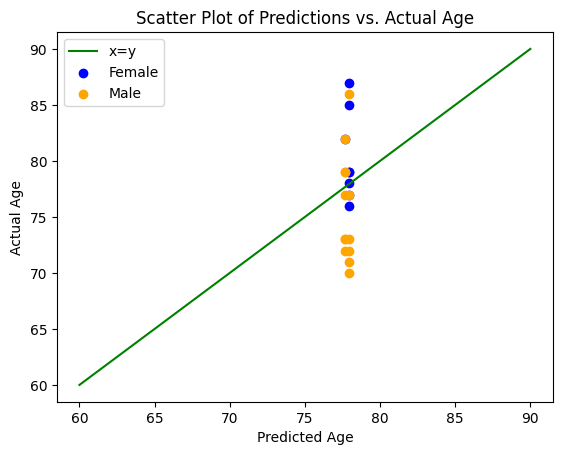

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    return r2, rmse, mse, mae

# Sample data


r2, rmse, mse, mae = evaluate_predictions(predictions, bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")


R^2: -0.498937505624812
RMSE: 5.92145093683439
MSE: 35.06358119733687
MAE: 4.788323175339472


### Version 4 bo v2

In [63]:
from classification_models_3D.tfkeras import Classifiers

vgg16, preprocess_input = Classifiers.get('vgg16')
pretrained_model = vgg16(input_shape=(79, 95, 68, 3), weights='imagenet')

176606448/176606448 [==============================] - 4s 0us/step


In [64]:
import keras.backend as K
from tensorflow.keras.initializers import GlorotUniform
from keras.optimizers import Adam

def create_model(num_ft_layers, neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)

  x = Dense(neurons2, activation='relu')(x)

  additional_input = Input(shape=(1,))
  concatenated = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input

  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[19 - num_ft_layers:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[19 - num_ft_layers:19]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]


  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [65]:
dup_bae_3d_im_train = np.repeat(bae_3d_im_train, 3, axis=-1)
dup_bae_3d_im_test = np.repeat(bae_3d_im_test, 3, axis=-1)

In [ ]:
from keras.backend import dropout
import time
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from keras.optimizers import Adam
import traceback

def objective(trial, X = dup_bae_3d_im_train, y = bae_3d_ages_train, z = bae_3d_sexes_train,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 12, step = 2)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 16, step = 1)


    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)

    # random forest classifier object
    scores = []
    best_scores = []
    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = create_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback, reduce_lr]).history
          scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0))# evaluate the test dataset
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(best_scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=3, gc_after_trial=True)
time_bayesian = time.time() - time_start

columns = ['Number of iterations', 'Iteration Number of Optimal Hyperparamters', 'Score', 'Time Elapsed (s)']

# store result in a data frame
values_bayesian = [100, study.best_trial.number, study.best_trial.value, time_bayesian]
results_bayesian = pd.DataFrame([values_bayesian], columns = columns)


[I 2023-08-28 09:50:46,408] A new study created in memory with name: no-name-2622d153-e162-41a0-a7c1-77c73a891ca0
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
7/7 [==============================] - 27s 3s/step - loss: 1754.0692 - mae: 33.6134 - val_loss: 715.5513 - val_mae: 26.0954
Epoch 2/100
7/7 [==============================] - 8s 1s/step - loss: 311.5875 - mae: 15.4870 - val_loss: 116.7186 - val_mae: 9.1605
Epoch 3/100
7/7 [==============================] - 8s 1s/step - loss: 115.9233 - mae: 9.4373 - val_loss: 39.8988 - val_mae: 5.0280
Epoch 4/100
7/7 [==============================] - 8s 1s/step - loss: 68.6298 - mae: 6.5506 - val_loss: 85.5129 - val_mae: 7.9847
Epoch 5/100
7/7 [==============================] - 8s 1s/step - loss: 48.7176 - mae: 5.7673 - val_loss: 49.3340 - val_mae: 5.6304
Epoch 6/100
7/7 [==============================] - 8s 1s/step - loss: 37.0988 - mae: 4.8289 - val_loss: 41.8546 - val_mae: 5.2492
Epoch 7/100
7/7 [==============================] - 8s 1s/step - loss: 23.1873 - mae: 3.5314 - val_loss: 36.9672 - val_mae: 4.9242
Epoch 8/100
7/7 [==============================] - 8s 1s/step - loss: 19.2287 - 

[I 2023-08-28 10:15:14,786] Trial 0 finished with value: 19.6632506052653 and parameters: {'num_layers': 2, 'neurons1': 114, 'neurons2': 146, 'batch_size': 8}. Best is trial 0 with value: 19.6632506052653.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
5/5 [==============================] - 27s 2s/step - loss: 4263516160.0000 - mae: 30836.6387 - val_loss: 1311.7587 - val_mae: 35.9119
Epoch 2/100
5/5 [==============================] - 9s 2s/step - loss: 4149.0581 - mae: 62.4738 - val_loss: 531.8912 - val_mae: 22.6582
Epoch 3/100
5/5 [==============================] - 9s 2s/step - loss: 7714.0498 - mae: 60.1479 - val_loss: 10915.3008 - val_mae: 104.3268
Epoch 4/100
5/5 [==============================] - 9s 2s/step - loss: 5531.9873 - mae: 71.1035 - val_loss: 5577.7930 - val_mae: 74.5690
Epoch 5/100
5/5 [==============================] - 9s 2s/step - loss: 4728.2837 - mae: 68.2533 - val_loss: 367.9487 - val_mae: 18.6900
Epoch 6/100
5/5 [==============================] - 9s 2s/step - loss: 1278.8773 - mae: 29.0391 - val_loss: 1467.0239 - val_mae: 38.0696
Epoch 7/100
5/5 [==============================] - 9s 2s/step - loss: 768.7859 - mae: 24.3800 - val_loss: 627.7223 - val_mae: 24.5853
Epoch 8/100
5/5 [=======================

[I 2023-08-28 10:31:42,854] Trial 1 finished with value: 19.45284144083659 and parameters: {'num_layers': 10, 'neurons1': 18, 'neurons2': 18, 'batch_size': 12}. Best is trial 1 with value: 19.45284144083659.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
7/7 [==============================] - 13s 1s/step - loss: 11055.0244 - mae: 83.2428 - val_loss: 41.9190 - val_mae: 5.4892
Epoch 2/100
7/7 [==============================] - 9s 1s/step - loss: 4416.2646 - mae: 61.6645 - val_loss: 5781.5864 - val_mae: 75.9081
Epoch 3/100
7/7 [==============================] - 9s 1s/step - loss: 5616.4106 - mae: 74.7809 - val_loss: 5211.4199 - val_mae: 72.0547
Epoch 4/100
7/7 [==============================] - 9s 1s/step - loss: 2471.4502 - mae: 44.4316 - val_loss: 659.0879 - val_mae: 25.2892
Epoch 5/100
7/7 [==============================] - 9s 1s/step - loss: 488.5835 - mae: 20.0040 - val_loss: 406.3326 - val_mae: 19.6669
Epoch 6/100
7/7 [==============================] - 9s 1s/step - loss: 167.4536 - mae: 11.2032 - val_loss: 49.2113 - val_mae: 6.0689
Epoch 7/100
7/7 [==============================] - 9s 1s/step - loss: 63.4501 - mae: 6.8333 - val_loss: 69.0358 - val_mae: 7.4877
Epoch 8/100
7/7 [==============================] - 9s 1s/step 

[I 2023-08-28 10:54:12,396] Trial 2 finished with value: 22.325473149617512 and parameters: {'num_layers': 8, 'neurons1': 98, 'neurons2': 242, 'batch_size': 8}. Best is trial 1 with value: 19.45284144083659.


In [ ]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [ ]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
1,10,18,18,12,19.452841
0,2,114,146,8,19.663251
2,8,98,242,8,22.325473


In [ ]:
optuna.visualization.plot_param_importances(study)

In [66]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(10, 18, 18)
history = model.fit([dup_bae_3d_im_train, bae_3d_sexes_train], bae_3d_ages_train, validation_data= ([dup_bae_3d_im_test, bae_3d_sexes_test], bae_3d_ages_test), epochs = 100, batch_size = 12, callbacks = [callback, reduce_lr]).history

Epoch 1/100
7/7 [==============================] - 17s 2s/step - loss: 450772544.0000 - mae: 8237.9834 - val_loss: 6142.5815 - val_mae: 78.2339 - lr: 0.0010
Epoch 2/100
7/7 [==============================] - 11s 2s/step - loss: 6602.4717 - mae: 73.0406 - val_loss: 35.2825 - val_mae: 5.0361 - lr: 0.0010
Epoch 3/100
7/7 [==============================] - 11s 2s/step - loss: 3898.1328 - mae: 57.7041 - val_loss: 5873.7051 - val_mae: 76.4967 - lr: 0.0010
Epoch 4/100
7/7 [==============================] - 11s 2s/step - loss: 5425.2998 - mae: 73.4709 - val_loss: 3915.6414 - val_mae: 62.4032 - lr: 0.0010
Epoch 5/100
7/7 [==============================] - 12s 2s/step - loss: 1819.7456 - mae: 35.5356 - val_loss: 1355.2759 - val_mae: 36.5238 - lr: 0.0010
Epoch 6/100
7/7 [==============================] - 12s 2s/step - loss: 476.8861 - mae: 19.6297 - val_loss: 81.5894 - val_mae: 7.7206 - lr: 0.0010
Epoch 7/100
7/7 [==============================] - 12s 2s/step - loss: 66.0878 - mae: 6.9341 - val_l

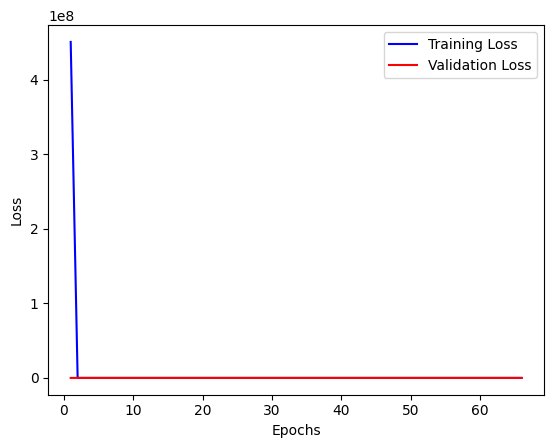

In [67]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

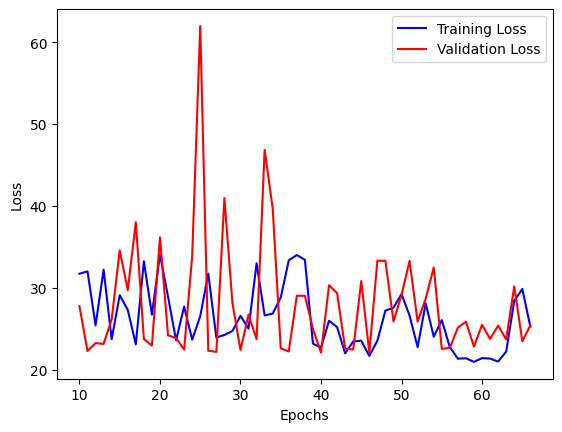

In [68]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [69]:
predictions = model.predict([dup_bae_3d_im_test, bae_3d_sexes_test])

1/1 [==============================] - 0s 271ms/step


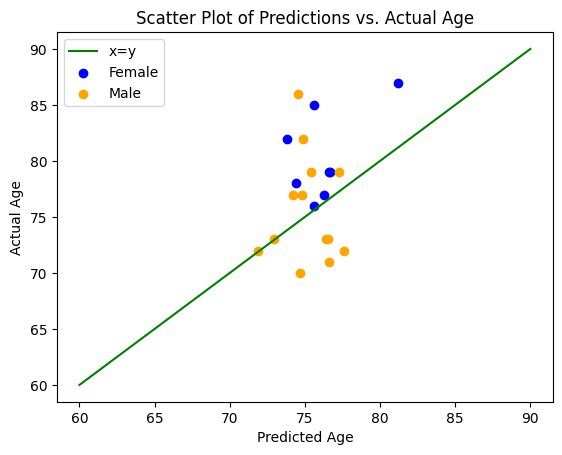

In [70]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [71]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")



R^2: -0.0858636769683867
RMSE: 5.03992443425109
MSE: 25.400838302961173
MAE: 4.030390784853981
Pearson's r: 0.2727436057719176


### Version 5 BO

In [31]:
rews =[1,2,3,4,5]
print(rews[2:4])

[3, 4]


In [32]:
from classification_models_3D.tfkeras import Classifiers

vgg19, preprocess_input = Classifiers.get('vgg19')
pretrained_model = vgg19(input_shape=(79, 95, 68, 3), weights='imagenet')

240321880/240321880 [==============================] - 5s 0us/step


In [33]:
import keras.backend as K
from tensorflow.keras.initializers import GlorotUniform
from keras.optimizers import Adam

def create_model(num_ft_layers, neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)

  x = Dense(neurons2, activation='relu')(x)

  additional_input = Input(shape=(1,))
  concatenated = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input

  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[22 - num_ft_layers:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[22 - num_ft_layers:22]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]


  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [34]:
dup_bae_3d_im_train = np.repeat(bae_3d_im_train, 3, axis=-1)
dup_bae_3d_im_test = np.repeat(bae_3d_im_test, 3, axis=-1)

In [37]:
from keras.backend import dropout
import time
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from keras.optimizers import Adam
import traceback

def objective(trial, X = dup_bae_3d_im_train, y = bae_3d_ages_train, z = bae_3d_sexes_train,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 12, step = 2)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 16, step = 1)


    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)

    # random forest classifier object
    scores = []
    best_scores = []
    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = create_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback, reduce_lr]).history
          scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0))# evaluate the test dataset
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(best_scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=3, gc_after_trial=True)
time_bayesian = time.time() - time_start

columns = ['Number of iterations', 'Iteration Number of Optimal Hyperparamters', 'Score', 'Time Elapsed (s)']

# store result in a data frame
values_bayesian = [100, study.best_trial.number, study.best_trial.value, time_bayesian]
results_bayesian = pd.DataFrame([values_bayesian], columns = columns)


[I 2023-08-28 13:27:28,393] A new study created in memory with name: no-name-65fe62bc-58c3-473c-b58a-2229119054d4


Epoch 1/100
6/6 [==============================] - 35s 2s/step - loss: 77562298368.0000 - mae: 113757.5938 - val_loss: 3218.1606 - val_mae: 56.4884 - lr: 0.0010
Epoch 2/100
6/6 [==============================] - 11s 2s/step - loss: 15563.9121 - mae: 100.6370 - val_loss: 5919.9351 - val_mae: 76.7563 - lr: 0.0010
Epoch 3/100
6/6 [==============================] - 12s 2s/step - loss: 5715.3159 - mae: 75.4723 - val_loss: 5881.2847 - val_mae: 76.5042 - lr: 0.0010
Epoch 4/100
6/6 [==============================] - 12s 2s/step - loss: 5680.3335 - mae: 75.2410 - val_loss: 5745.7788 - val_mae: 75.6138 - lr: 0.0010
Epoch 5/100
6/6 [==============================] - 11s 2s/step - loss: 6328.4131 - mae: 69.2432 - val_loss: 5168.9883 - val_mae: 71.7005 - lr: 0.0010
Epoch 6/100
6/6 [==============================] - 11s 2s/step - loss: 4182.8555 - mae: 62.4025 - val_loss: 2024.8357 - val_mae: 44.7018 - lr: 0.0010
Epoch 7/100
6/6 [==============================] - 11s 2s/step - loss: 2623.0339 - mae:

[I 2023-08-28 13:57:38,208] Trial 0 finished with value: 21.182727813720703 and parameters: {'num_layers': 12, 'neurons1': 82, 'neurons2': 226, 'batch_size': 9}. Best is trial 0 with value: 21.182727813720703.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
7/7 [==============================] - 33s 3s/step - loss: 28276965376.0000 - mae: 64990.6406 - val_loss: 372.4016 - val_mae: 18.6817 - lr: 0.0010
Epoch 2/100
7/7 [==============================] - 11s 2s/step - loss: 1731.1549 - mae: 36.5871 - val_loss: 22.7348 - val_mae: 3.6686 - lr: 0.0010
Epoch 3/100
7/7 [==============================] - 11s 2s/step - loss: 85.8989 - mae: 8.0860 - val_loss: 34.2767 - val_mae: 4.9045 - lr: 0.0010
Epoch 4/100
7/7 [==============================] - 11s 2s/step - loss: 498.2188 - mae: 19.1818 - val_loss: 230.2794 - val_mae: 14.4184 - lr: 0.0010
Epoch 5/100
7/7 [==============================] - 11s 2s/step - loss: 237.2867 - mae: 13.6303 - val_loss: 258.5427 - val_mae: 15.4325 - lr: 0.0010
Epoch 6/100
7/7 [==============================] - 11s 2s/step - loss: 105.7182 - mae: 9.0802 - val_loss: 27.4803 - val_mae: 4.0438 - lr: 0.0010
Epoch 7/100
7/7 [==============================] - 11s 2s/step - loss: 73.7751 - mae: 7.2657 - val_loss: 138.

[I 2023-08-28 14:26:46,659] Trial 1 finished with value: 21.424903869628906 and parameters: {'num_layers': 10, 'neurons1': 114, 'neurons2': 178, 'batch_size': 8}. Best is trial 0 with value: 21.182727813720703.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
5/5 [==============================] - 23s 2s/step - loss: 678080512.0000 - mae: 12349.5430 - val_loss: 128.5692 - val_mae: 10.6504 - lr: 0.0010
Epoch 2/100
5/5 [==============================] - 9s 2s/step - loss: 7602.9150 - mae: 66.3870 - val_loss: 7556.9712 - val_mae: 86.7686 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 9s 2s/step - loss: 3620.0156 - mae: 52.5380 - val_loss: 34.1116 - val_mae: 4.4563 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 9s 2s/step - loss: 846.1890 - mae: 24.5676 - val_loss: 73.2792 - val_mae: 7.7497 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 9s 2s/step - loss: 291.1375 - mae: 15.2828 - val_loss: 52.0384 - val_mae: 6.2456 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 9s 2s/step - loss: 142.1765 - mae: 9.8495 - val_loss: 123.6504 - val_mae: 10.4411 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 9s 2s/step - loss: 94.5987 - mae: 8.0669 - val_loss: 22.2550 

[I 2023-08-28 15:05:48,171] Trial 2 finished with value: 22.30445607503255 and parameters: {'num_layers': 6, 'neurons1': 114, 'neurons2': 66, 'batch_size': 12}. Best is trial 0 with value: 21.182727813720703.


In [38]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [39]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
0,12,82,226,9,21.182728
1,10,114,178,8,21.424904
2,6,114,66,12,22.304456


In [40]:
optuna.visualization.plot_param_importances(study)

In [41]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(12, 82, 226)
history = model.fit([dup_bae_3d_im_train, bae_3d_sexes_train], bae_3d_ages_train, validation_data= ([dup_bae_3d_im_test, bae_3d_sexes_test], bae_3d_ages_test), epochs = 100, batch_size = 9, callbacks = [callback, reduce_lr]).history

Epoch 1/100
9/9 [==============================] - 18s 2s/step - loss: 1086371328.0000 - mae: 11056.4971 - val_loss: 4087.9050 - val_mae: 63.7555 - lr: 0.0010
Epoch 2/100
9/9 [==============================] - 14s 2s/step - loss: 1301.6505 - mae: 32.0909 - val_loss: 504.4330 - val_mae: 21.9538 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 14s 2s/step - loss: 164.3921 - mae: 10.7226 - val_loss: 84.6383 - val_mae: 8.0451 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 15s 2s/step - loss: 47.2561 - mae: 5.5530 - val_loss: 78.9046 - val_mae: 7.5035 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 15s 2s/step - loss: 44.5072 - mae: 5.7215 - val_loss: 22.8007 - val_mae: 3.7963 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 15s 2s/step - loss: 58.6125 - mae: 6.5292 - val_loss: 84.4198 - val_mae: 8.0330 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 15s 2s/step - loss: 44.4174 - mae: 5.4808 - val_loss: 66.9103 -

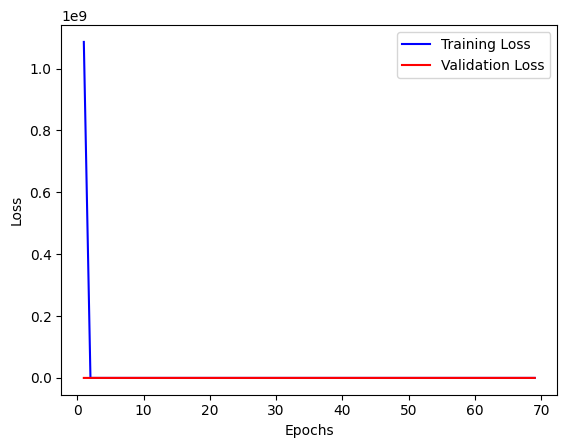

In [42]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

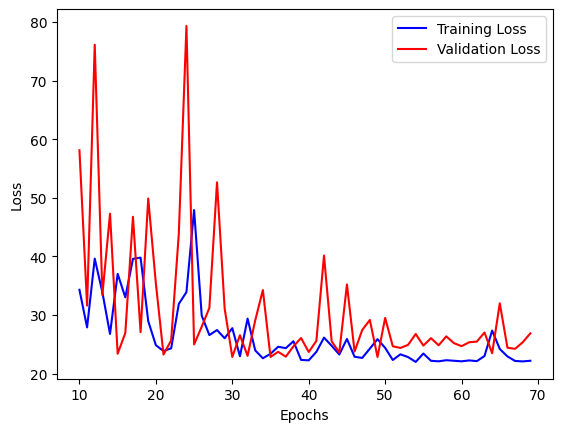

In [43]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [44]:
predictions = model.predict([dup_bae_3d_im_test, bae_3d_sexes_test])

1/1 [==============================] - 20s 20s/step


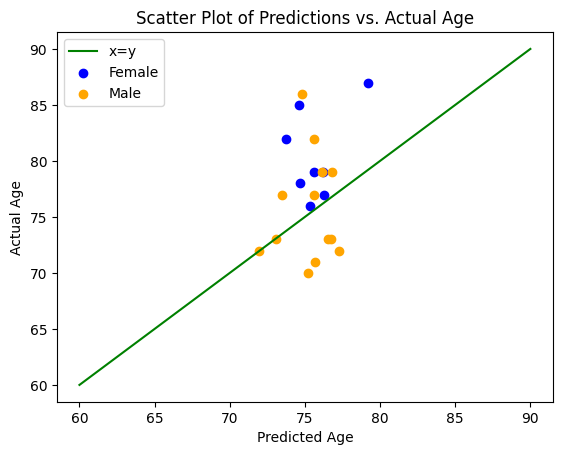

In [45]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [62]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")


R^2: -0.148869634966176
RMSE: 5.184080628220307
MSE: 26.874691959889052
MAE: 4.167414710635231
Pearson's r: 0.19981059684333607


### V6

In [ ]:
from classification_models_3D.tfkeras import Classifiers

vgg19, preprocess_input = Classifiers.get('vgg19')
pretrained_model = vgg19(input_shape=(79, 95, 68, 3), weights='imagenet')

In [ ]:
duplicated_data = np.repeat(image_data, 3, axis=-1)
print(duplicated_data.shape)

NameError: ignored

In [ ]:
from keras.backend import dropout
import time
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from keras.optimizers import Adam
import traceback
import gc

def create_model(learning_rate, neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)
  x = Dense(neurons2, activation='relu')(x)

  additional_input = Input(shape=(1,))
  # Concatenate the flattened output with the new input
  concatenated = concatenate([x, additional_input])
  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[19:]:
            layer.trainable = True


  METRICS = [keras.metrics.MeanSquaredError(name='mse'),
               keras.metrics.MeanAbsoluteError(name='mae')]
  optimizer = Adam(learning_rate=learning_rate)
  # Compile the model
  model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=METRICS)

  return(model)




def objective(trial, X = duplicated_data,y=ages,z=sexes,K = 5):
    global the_best_score
    """return the mse"""
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 16, high = 64, step = 8)
    learning_rate = trial.suggest_float('learning_rate', low = 0.00001, high = 0.01, step = 0.0005)

    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, start_from_epoch=50, baseline = 100)
    # random forest classifier object
    scores = []
    best_scores = []
    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = create_model(neurons1 = neurons1, neurons2 = neurons2, learning_rate = learning_rate)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=125, batch_size=batch_size, callbacks= [callback]).history
          scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0))# evaluate the test dataset
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=20, gc_after_trial=True)
time_bayesian = time.time() - time_start

columns = ['Number of iterations', 'Iteration Number of Optimal Hyperparamters', 'Score', 'Time Elapsed (s)']

# store result in a data frame
values_bayesian = [100, study.best_trial.number, study.best_trial.value, time_bayesian]
results_bayesian = pd.DataFrame([values_bayesian], columns = columns)

[I 2023-08-25 21:44:26,465] A new study created in memory with name: no-name-fe109a48-7487-44b1-80ab-b5c5a81d7ddb
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(


Epoch 1/125
3/3 [==============================] - 77s 20s/step - loss: 146997.3594 - mse: 146997.3594 - mae: 323.7651 - val_loss: 842.7560 - val_mse: 842.7560 - val_mae: 28.7473
Epoch 2/125
3/3 [==============================] - 9s 3s/step - loss: 692.4028 - mse: 692.4028 - mae: 24.1966 - val_loss: 857.1779 - val_mse: 857.1779 - val_mae: 28.8787
Epoch 3/125
3/3 [==============================] - 9s 3s/step - loss: 963.5236 - mse: 963.5236 - mae: 27.6239 - val_loss: 1090.2405 - val_mse: 1090.2405 - val_mae: 32.6443
Epoch 4/125
3/3 [==============================] - 9s 3s/step - loss: 515.1633 - mse: 515.1633 - mae: 19.2332 - val_loss: 441.3922 - val_mse: 441.3922 - val_mae: 20.5995
Epoch 5/125
3/3 [==============================] - 9s 3s/step - loss: 285.6599 - mse: 285.6599 - mae: 14.9951 - val_loss: 244.6807 - val_mse: 244.6807 - val_mae: 14.8487
Epoch 6/125
3/3 [==============================] - 9s 3s/step - loss: 128.9642 - mse: 128.9642 - mae: 9.3298 - val_loss: 170.3097 - val_mse

Traceback (most recent call last):
  File "<ipython-input-55-300bc1734d52>", line 68, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_5/block1_conv2/Conv3D' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_new

Epoch 1/125
4/4 [==============================] - 40s 6s/step - loss: 8018.0649 - mse: 8018.0640 - mae: 72.6672 - val_loss: 1623.1744 - val_mse: 1623.1744 - val_mae: 40.1226
Epoch 2/125
4/4 [==============================] - 10s 3s/step - loss: 2382.5037 - mse: 2382.5037 - mae: 48.2625 - val_loss: 812.8715 - val_mse: 812.8715 - val_mae: 28.1313
Epoch 3/125
4/4 [==============================] - 10s 2s/step - loss: 536.5755 - mse: 536.5755 - mae: 20.3759 - val_loss: 583.1462 - val_mse: 583.1462 - val_mae: 23.4685
Epoch 4/125
4/4 [==============================] - 9s 2s/step - loss: 259.7328 - mse: 259.7329 - mae: 13.2118 - val_loss: 366.6834 - val_mse: 366.6834 - val_mae: 18.2444
Epoch 5/125
4/4 [==============================] - 9s 2s/step - loss: 315.0962 - mse: 315.0962 - mae: 17.1881 - val_loss: 99.3549 - val_mse: 99.3549 - val_mae: 8.6701
Epoch 6/125
4/4 [==============================] - 10s 2s/step - loss: 61.6436 - mse: 61.6436 - mae: 6.5242 - val_loss: 186.5989 - val_mse: 186.

[I 2023-08-26 00:13:36,420] Trial 1 finished with value: 20.422413237889607 and parameters: {'neurons1': 178, 'neurons2': 114, 'batch_size': 24, 'learning_rate': 0.00701}. Best is trial 1 with value: 20.422413237889607.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(


Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-55-300bc1734d52>", line 68, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_11/block1_conv2/Conv3D' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_ne

Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-55-300bc1734d52>", line 68, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_12/block1_conv2/Conv3D' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_ne

Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-55-300bc1734d52>", line 68, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_13/block1_conv2/Conv3D' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_ne

Epoch 1/125
4/4 [==============================] - 11s 3s/step - loss: 4974.5542 - mse: 4974.5537 - mae: 70.0223 - val_loss: 1733.2891 - val_mse: 1733.2891 - val_mae: 41.3524
Epoch 2/125
4/4 [==============================] - 10s 3s/step - loss: 804.9641 - mse: 804.9641 - mae: 24.1532 - val_loss: 1234.2675 - val_mse: 1234.2675 - val_mae: 34.7991
Epoch 3/125
4/4 [==============================] - 10s 3s/step - loss: 970.8572 - mse: 970.8572 - mae: 30.4200 - val_loss: 78.3020 - val_mse: 78.3020 - val_mae: 7.5574
Epoch 4/125
4/4 [==============================] - 10s 3s/step - loss: 106.3131 - mse: 106.3131 - mae: 8.7447 - val_loss: 361.9982 - val_mse: 361.9982 - val_mae: 18.4038
Epoch 5/125
4/4 [==============================] - 10s 2s/step - loss: 412.7760 - mse: 412.7760 - mae: 19.6950 - val_loss: 178.3458 - val_mse: 178.3458 - val_mae: 12.4515
Epoch 6/125
4/4 [==============================] - 9s 2s/step - loss: 110.7704 - mse: 110.7704 - mae: 8.6005 - val_loss: 88.2898 - val_mse: 88.

Traceback (most recent call last):
  File "<ipython-input-55-300bc1734d52>", line 68, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 1685, in fit
    tmp_logs = self.train_function(iterator)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/util/traceback_utils.py", line 150, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/polymorphic_function.py", line 894, in __call__
    result = self._call(*args, **kwds)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/polymorphic_function.py", line 926, in _call
    return self._no_variable_creation_fn(*args, **kwds)  # pylint: disable=not-callable
  File "/usr/

Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-55-300bc1734d52>", line 68, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_17/block1_conv2/Conv3D' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_ne

Epoch 1/125


## 2D

### Creating the 2D data

In [33]:
from skimage.feature import greycomatrix
from skimage import img_as_ubyte
twod_df = pd.DataFrame(columns = ['id','age','sex','entropy','data', 'split'])
slice_counter = 0
rotation_angle = 90
counter = 0
for image_array, age, sex in zip(image_data, ages, sexes):
  counter += 1
  nx, ny, nz, nw = image_array.shape
  total_volumes = image_array.shape[3]
  total_slices = image_array.shape[2]
  if counter -1 in train_idx:
    split = 'train'
  else:
    split = 'test'
  for current_volume in range(0, total_volumes):
      # iterate through slices
      for current_slice in range(0, total_slices):
          if (slice_counter % 1) == 0:
              if rotation_angle == 90:
                  data = np.rot90(image_array[:, :, current_slice, current_volume])
              elif rotation_angle == 180:
                  data = np.rot90(np.rot90(image_array[:, :, current_slice, current_volume]))
              elif rotation_angle == 270:
                  data = np.rot90(np.rot90(np.rot90(image_array[:, :, current_slice, current_volume])))
              #alternate slices and save as png
              if (slice_counter % 1) == 0:
                  print('Adding image...')
                  min_val = np.min(data)
                  max_val = np.max(data)
                  im = 2 * (data - min_val) / (max_val - min_val) - 1
                  im = img_as_ubyte(im)
                  glcm = np.squeeze(greycomatrix(im, distances=[1], angles=[0], symmetric=True, normed=True))
                  entropy = -np.sum(glcm*np.log2(glcm + (glcm==0)))

                  new_row = {'id':counter, 'age':age, 'sex':sex, 'entropy':entropy, 'data':data, 'split':split}
                  twod_df = twod_df.append(new_row, ignore_index=True)
                  #imsave(imge_folder +str(counter)+'_'+x_label2+'.jpg', data,format='jpg')
                  print('Saved.')



Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-33-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

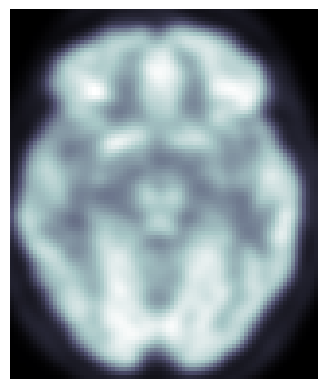

In [34]:
plt.imshow(twod_df['data'][twod_df['entropy'].idxmax()], cmap='bone')
plt.axis('off')
plt.show()
# Syntax

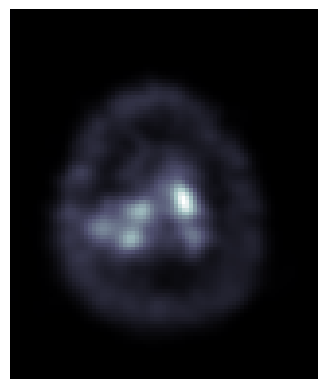

In [35]:
plt.imshow(twod_df['data'][twod_df['entropy'].idxmin()], cmap='bone')
plt.axis('off')
plt.show()
# Syntax

In [36]:
high_entropy_df = pd.DataFrame(columns = ['id','age','sex','entropy','data', 'split'])
for id in twod_df.id.unique():
  filtered_df = twod_df[twod_df.id == id].sort_values(by=['entropy'], ascending=False).head(50)
  high_entropy_df = high_entropy_df.append(filtered_df)



<ipython-input-36-c4dbd69f977b>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  high_entropy_df = high_entropy_df.append(filtered_df)
<ipython-input-36-c4dbd69f977b>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  high_entropy_df = high_entropy_df.append(filtered_df)
<ipython-input-36-c4dbd69f977b>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  high_entropy_df = high_entropy_df.append(filtered_df)
<ipython-input-36-c4dbd69f977b>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  high_entropy_df = high_entropy_df.append(filtered_df)
<ipython-input-36-c4dbd69f977b>:4: FutureWarning: The frame.append method is deprecated and will be remo

In [37]:
high_entropy_df

,id,age,sex,entropy,data,split
17,1,72,1,8.277041,"[[0.0, 5.446882482829096e-07, 3.61596175935119...",train
18,1,72,1,8.126583,"[[4.070339855388738e-06, 2.0476438749028603e-0...",train
20,1,72,1,8.058210,"[[1.7031876268447377e-05, 0.0, 9.1300666099414...",train
19,1,72,1,7.996672,"[[1.5409554180223495e-05, 9.637770972403814e-0...",train
21,1,72,1,7.990576,"[[1.791168142517563e-05, 0.0, 6.01622014073655...",train
...,...,...,...,...,...,...
6876,102,81,-1,5.191991,"[[0.001679067499935627, 0.0029688584618270397,...",train
6922,102,81,-1,5.130491,"[[0.00018155016005039215, 0.000132429748191498...",train
6923,102,81,-1,4.813114,"[[0.00047863251529634, 0.00038588137249462306,...",train
6875,102,81,-1,4.755886,"[[0.002294617472216487, 0.003809461835771799, ...",train


In [38]:
group_id = np.array(high_entropy_df[high_entropy_df.split == 'train']['id'])

In [39]:
bae_2d_X_train = np.array(high_entropy_df[high_entropy_df.split == 'train']['data'])
bae_2d_y_train = np.array(high_entropy_df[high_entropy_df.split == 'train']['age'])
bae_2d_X_test = np.array(high_entropy_df[high_entropy_df.split == 'test']['data'])
bae_2d_y_test = np.array(high_entropy_df[high_entropy_df.split == 'test']['age'])

In [40]:
bae_2d_X_train = np.array([bae_2d_X_train[i] for i in range(len(bae_2d_X_train))])
bae_2d_y_train = np.array([bae_2d_y_train[i] for i in range(len(bae_2d_y_train))])
bae_2d_X_test = np.array([bae_2d_X_test[i] for i in range(len(bae_2d_X_test))])
bae_2d_y_test = np.array([bae_2d_y_test[i] for i in range(len(bae_2d_y_test))])

In [41]:
bae_2d_z_train =  np.array(high_entropy_df[high_entropy_df.split == 'train']['sex'])
bae_2d_z_test =  np.array(high_entropy_df[high_entropy_df.split == 'test']['sex'])
bae_2d_z_train = np.array([bae_2d_z_train[i] for i in range(len(bae_2d_z_train))])
bae_2d_z_test = np.array([bae_2d_z_test[i] for i in range(len(bae_2d_z_test))])

### V1

In [69]:
def compile_model():
  model = Sequential() # using sequential

  # Add 3D Convolutional layers with MaxPooling
  model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(95, 79, 1)))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=(95, 79, 1)))
  model.add(MaxPooling2D(pool_size=(2, 2)))


  # Flatten the output and add Dense layers for age prediction
  model.add(Flatten())
  model.add(Dense(128, activation='relu'))
  model.add(Dense(1, activation='linear'))  # Use 'linear' activation for regression tasks

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=[metrics.mean_absolute_error])

  return(model)

In [ ]:
def cross_validate(X, y, K = 5):
    scores = []
    histories = []
    r2 = []
    for train, test in KFold(n_splits=K, shuffle=True).split(range(102)):
        model = compile_model() # compile model
        train = [i for i,a in enumerate(group_id) if a in train+1]
        test = [i for i,a in enumerate(group_id) if a in test+1]
        histories.append(model.fit(X[train], y[train],
                                   validation_data = (X[test],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate(X[test], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict(X[test]), y[test]))
    print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())
    print("average test r2: ", np.mean(r2))
    print(model.summary())
    return scores, histories, r2


In [ ]:
scores, histories, r2 = cross_validate(X, y, K = 5)

Epoch 1/200
102/102 [==============================] - 2s 9ms/step - loss: 219.4288 - mean_absolute_error: 9.1442 - val_loss: 32.4966 - val_mean_absolute_error: 4.2024
Epoch 2/200
102/102 [==============================] - 1s 6ms/step - loss: 29.9962 - mean_absolute_error: 4.3973 - val_loss: 35.6735 - val_mean_absolute_error: 4.3931
Epoch 3/200
102/102 [==============================] - 1s 6ms/step - loss: 25.9643 - mean_absolute_error: 4.0967 - val_loss: 28.8267 - val_mean_absolute_error: 3.9126
Epoch 4/200
102/102 [==============================] - 1s 6ms/step - loss: 24.2915 - mean_absolute_error: 3.9597 - val_loss: 30.1132 - val_mean_absolute_error: 3.9207
Epoch 5/200
102/102 [==============================] - 1s 6ms/step - loss: 22.1496 - mean_absolute_error: 3.7921 - val_loss: 32.1957 - val_mean_absolute_error: 4.0642
Epoch 6/200
102/102 [==============================] - 1s 6ms/step - loss: 29.4622 - mean_absolute_error: 4.4411 - val_loss: 38.7725 - val_mean_absolute_error: 5.20

In [ ]:
model = compile_model()

# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
model = compile_model()
for train, test in KFold(n_splits=5, shuffle=True).split(range(102)):
    train = [i for i,a in enumerate(group_id) if a in train+1]
    test = [i for i,a in enumerate(group_id) if a in test+1]
    break
history = model.fit(X[train], y[train], validation_data = (X[test],y[test]), epochs=200, batch_size=16).history
predictions = model.predict(X[test])

Epoch 1/200
102/102 [==============================] - 2s 8ms/step - loss: 320.1429 - mean_absolute_error: 10.4812 - val_loss: 48.2010 - val_mean_absolute_error: 5.5568
Epoch 2/200
102/102 [==============================] - 1s 6ms/step - loss: 28.9686 - mean_absolute_error: 4.2058 - val_loss: 45.0629 - val_mean_absolute_error: 5.3092
Epoch 3/200
102/102 [==============================] - 1s 6ms/step - loss: 24.5492 - mean_absolute_error: 3.8917 - val_loss: 35.6170 - val_mean_absolute_error: 4.7396
Epoch 4/200
102/102 [==============================] - 1s 6ms/step - loss: 20.7110 - mean_absolute_error: 3.6067 - val_loss: 41.8773 - val_mean_absolute_error: 5.1059
Epoch 5/200
102/102 [==============================] - 1s 6ms/step - loss: 18.9488 - mean_absolute_error: 3.4142 - val_loss: 37.4084 - val_mean_absolute_error: 4.8609
Epoch 6/200
102/102 [==============================] - 1s 6ms/step - loss: 15.3226 - mean_absolute_error: 3.0889 - val_loss: 35.3739 - val_mean_absolute_error: 4.5

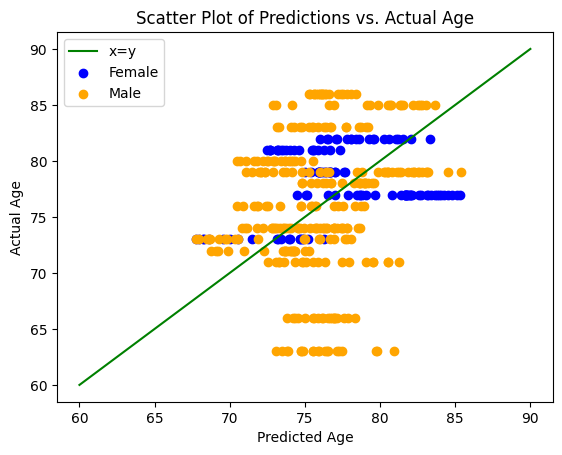

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(z[test] == g)
    print()
    plt.scatter(predictions[i], y[test][i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

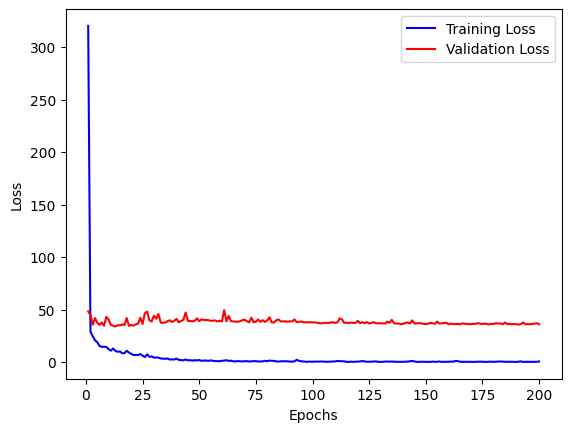

In [ ]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

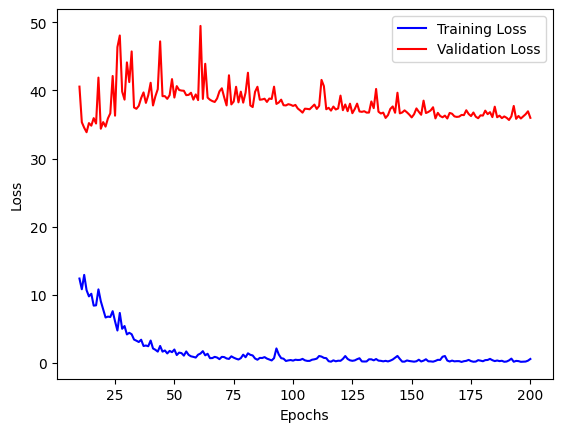

In [ ]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### V2

In [ ]:
from sklearn import metrics
from sklearn.metrics import r2_score
from keras import metrics

def compile_model():

  # Define the input layer for the 3D Convolutional network
  input_img = Input(shape=(95, 79, 1))

  # Apply 3D Convolutional layers with MaxPooling using the Functional API
  x = Conv2D(32, kernel_size=(3, 3), activation='relu')(input_img)
  x = MaxPooling2D(pool_size=(2, 2))(x)
  x = Conv2D(64, kernel_size=(3, 3), activation='relu')(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)


  # Flatten the output and add Dense layers for age prediction
  x = Flatten()(x)
  x = Dense(128, activation='relu')(x)
  output_img = Dense(32, activation='linear')(x)

  # Define the input layer for the extra feature
  input_extra = Input(shape=(1,))

  # Concatenate the output of the Convolutional network with the extra feature
  merged = concatenate([output_img, input_extra])

  # Add Dense layers for further prediction
  merged = Dense(32, activation='relu')(merged)
  merged = Dense(4, activation='relu')(merged)
  output = Dense(1, activation='linear')(merged)  # Use 'linear' activation for regression tasks

  # Define the model with both inputs and the final output
  model = Model(inputs=[input_img, input_extra], outputs=output)

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=[metrics.mean_absolute_error])

  return(model)

In [ ]:
def cross_validate(X, y, z, K = 5):

    scores = []
    histories = []
    r2 = []
    for train, test in KFold(n_splits=K, shuffle=True).split(range(102)):
        model = compile_model() # compile model
        train = [i for i,a in enumerate(group_id) if a in train+1]
        test = [i for i,a in enumerate(group_id) if a in test+1]
        histories.append(model.fit([X[train], z[train]], y[train],
                                   validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict([X[test], z[test]]), y[test]))
    print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())
    print("average test r2: ", np.mean(r2))
    print(model.summary())
    return scores, histories, r2




In [ ]:
scores_v2, histories_v2, r2_v2 = cross_validate(X, y, z, K = 5)

Epoch 1/200
102/102 [==============================] - 3s 9ms/step - loss: 543.5230 - mean_absolute_error: 14.2078 - val_loss: 42.6500 - val_mean_absolute_error: 4.9227
Epoch 2/200
102/102 [==============================] - 1s 7ms/step - loss: 37.4340 - mean_absolute_error: 4.7879 - val_loss: 18.8358 - val_mean_absolute_error: 3.5484
Epoch 3/200
102/102 [==============================] - 1s 7ms/step - loss: 31.5973 - mean_absolute_error: 4.4626 - val_loss: 17.4392 - val_mean_absolute_error: 3.2654
Epoch 4/200
102/102 [==============================] - 1s 6ms/step - loss: 29.6207 - mean_absolute_error: 4.3119 - val_loss: 17.0636 - val_mean_absolute_error: 3.4784
Epoch 5/200
102/102 [==============================] - 1s 6ms/step - loss: 28.3204 - mean_absolute_error: 4.2335 - val_loss: 20.1508 - val_mean_absolute_error: 3.3040
Epoch 6/200
102/102 [==============================] - 1s 6ms/step - loss: 28.4121 - mean_absolute_error: 4.2397 - val_loss: 24.9296 - val_mean_absolute_error: 3.7

In [ ]:
scores_v2

[[28.079561233520508, 4.432161808013916],
 [33.709259033203125, 4.530690670013428],
 [30.072385787963867, 4.64683198928833],
 [31.423490524291992, 4.610693454742432],
 [3079.831298828125, 55.23661804199219]]

In [ ]:
np.mean([4.432161808013916,
4.530690670013428,
4.64683198928833,
4.610693454742432])

4.555094480514526

In [ ]:
np.mean([28.079561233520508,
33.709259033203125,
30.072385787963867,
31.423490524291992])

30.821174144744873

In [ ]:
np.mean([-0.9116567749839588,
 -2.4629745336738234,
 -0.4520105970184283,
 -1.8885788782523218])

-1.4288051959821328

In [ ]:
model = compile_model()

# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
model = compile_model()
for train, test in KFold(n_splits=6, shuffle=True).split(range(102)):
    train = [i for i,a in enumerate(group_id) if a in train+1]
    test = [i for i,a in enumerate(group_id) if a in test+1]
    break
history = model.fit([X[train],z[train]], y[train], validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16).history
predictions = model.predict([X[test], z[test]])

Epoch 1/200
107/107 [==============================] - 3s 8ms/step - loss: 321.2924 - mean_absolute_error: 10.7249 - val_loss: 35.9917 - val_mean_absolute_error: 5.1461
Epoch 2/200
107/107 [==============================] - 1s 6ms/step - loss: 30.8050 - mean_absolute_error: 4.3570 - val_loss: 41.9153 - val_mean_absolute_error: 5.7694
Epoch 3/200
107/107 [==============================] - 1s 6ms/step - loss: 26.2580 - mean_absolute_error: 4.0160 - val_loss: 52.8268 - val_mean_absolute_error: 6.3889
Epoch 4/200
107/107 [==============================] - 1s 6ms/step - loss: 27.6207 - mean_absolute_error: 4.1467 - val_loss: 29.0737 - val_mean_absolute_error: 4.4230
Epoch 5/200
107/107 [==============================] - 1s 6ms/step - loss: 25.5574 - mean_absolute_error: 3.9187 - val_loss: 31.1551 - val_mean_absolute_error: 4.7068
Epoch 6/200
107/107 [==============================] - 1s 6ms/step - loss: 23.6197 - mean_absolute_error: 3.8164 - val_loss: 33.8167 - val_mean_absolute_error: 4.9

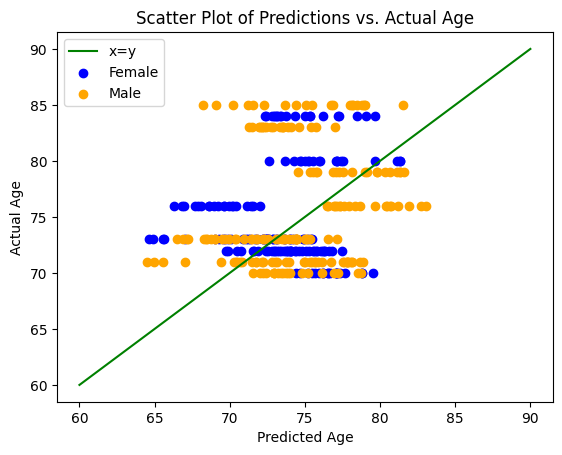

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(z[test] == g)
    print()
    plt.scatter(predictions[i], y[test][i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

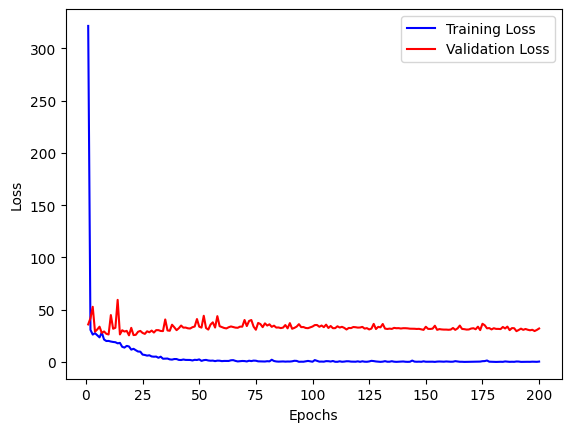

In [ ]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

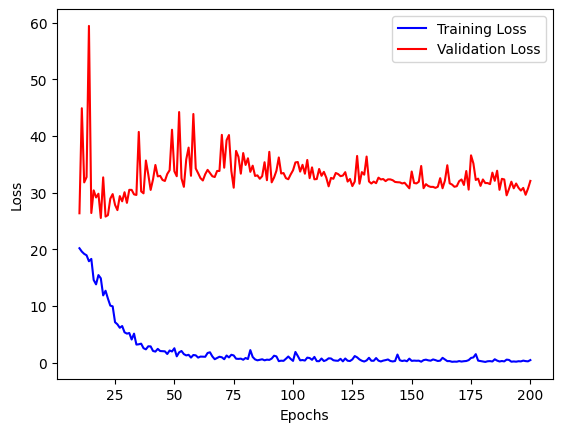

In [ ]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Version 1

In [70]:
from keras.applications.vgg19 import VGG19
pretrained_model = VGG19(input_shape=(95, 79, 3), include_top=False)

In [71]:
bae_2d_X_train_vgg = np.repeat(bae_2d_X_train[:, :, :, np.newaxis], 3, axis=3)
bae_2d_X_test_vgg = np.repeat(bae_2d_X_test[:, :, :, np.newaxis], 3, axis=3)

In [78]:
def create_model(num_ft_layers,neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers[:14]:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  additional_input = Input(shape=(1,))


  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)
  x = Dense(neurons2, activation='relu')(x)
  x = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[14 - num_ft_layers:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[14 - num_ft_layers:14]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])
  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]



  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)


In [79]:
import random

def objective(trial, X = bae_2d_X_train_vgg,y = bae_2d_y_train,z=bae_2d_z_train ,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 12, step = 2)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 128, step = 16)

    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, start_from_epoch=50, baseline = 100)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
    # random forest classifier object
    scores = []
    best_scores = []
    for _ in range(2):
        vals = list(set(group_id))
        random.shuffle(vals)

        # Calculate the index to split
        split_idx = int(0.8 * len(vals))

        # Split the list into 80% and 20%
        train = vals[:split_idx]
        test = vals[split_idx:]

        model = create_model(num_ft_layers = num_ft_layers,neurons1 = neurons1, neurons2 = neurons2) # compile model
        train = [i for i,a in enumerate(group_id) if a in train]
        test = [i for i,a in enumerate(group_id) if a in test]

        model = create_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback, reduce_lr]).history
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(best_scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=3, gc_after_trial=True)
time_bayesian = time.time() - time_start


[I 2023-08-29 00:08:07,055] A new study created in memory with name: no-name-e4cdd700-f4d6-4aaa-b457-20bd807058c6


Epoch 1/100
58/58 [==============================] - 9s 69ms/step - loss: 679.2753 - mae: 15.0907 - val_loss: 24.6428 - val_mae: 4.2740 - lr: 0.0010
Epoch 2/100
58/58 [==============================] - 3s 50ms/step - loss: 19.3309 - mae: 3.3700 - val_loss: 100.1941 - val_mae: 8.8711 - lr: 0.0010
Epoch 3/100
58/58 [==============================] - 3s 51ms/step - loss: 15.9404 - mae: 3.0901 - val_loss: 22.3097 - val_mae: 4.0926 - lr: 0.0010
Epoch 4/100
58/58 [==============================] - 3s 51ms/step - loss: 11.2112 - mae: 2.6249 - val_loss: 43.8792 - val_mae: 5.4117 - lr: 0.0010
Epoch 5/100
58/58 [==============================] - 3s 51ms/step - loss: 10.4432 - mae: 2.5173 - val_loss: 21.7072 - val_mae: 4.0438 - lr: 0.0010
Epoch 6/100
58/58 [==============================] - 3s 51ms/step - loss: 7.6371 - mae: 2.1706 - val_loss: 21.7524 - val_mae: 3.9904 - lr: 0.0010
Epoch 7/100
58/58 [==============================] - 3s 51ms/step - loss: 7.5750 - mae: 2.1959 - val_loss: 26.4754 -

[I 2023-08-29 00:15:56,249] Trial 0 finished with value: 17.570483207702637 and parameters: {'num_layers': 0, 'neurons1': 82, 'neurons2': 82, 'batch_size': 56}. Best is trial 0 with value: 17.570483207702637.


Epoch 1/100
37/37 [==============================] - 9s 141ms/step - loss: 623.1962 - mae: 17.0576 - val_loss: 86.5147 - val_mae: 8.0886 - lr: 0.0010
Epoch 2/100
37/37 [==============================] - 3s 70ms/step - loss: 27.0194 - mae: 4.0556 - val_loss: 26.9131 - val_mae: 4.4059 - lr: 0.0010
Epoch 3/100
37/37 [==============================] - 3s 71ms/step - loss: 16.7564 - mae: 3.1697 - val_loss: 21.0461 - val_mae: 3.8644 - lr: 0.0010
Epoch 4/100
37/37 [==============================] - 3s 70ms/step - loss: 13.5855 - mae: 2.8562 - val_loss: 27.8278 - val_mae: 4.3739 - lr: 0.0010
Epoch 5/100
37/37 [==============================] - 3s 70ms/step - loss: 14.7066 - mae: 3.0187 - val_loss: 26.9595 - val_mae: 4.2727 - lr: 0.0010
Epoch 6/100
37/37 [==============================] - 3s 70ms/step - loss: 10.6788 - mae: 2.5678 - val_loss: 35.9587 - val_mae: 4.9333 - lr: 0.0010
Epoch 7/100
37/37 [==============================] - 3s 71ms/step - loss: 11.1989 - mae: 2.6782 - val_loss: 21.0809

[I 2023-08-29 00:22:56,955] Trial 1 finished with value: 16.606005668640137 and parameters: {'num_layers': 0, 'neurons1': 162, 'neurons2': 34, 'batch_size': 88}. Best is trial 1 with value: 16.606005668640137.


Epoch 1/100
45/45 [==============================] - 10s 95ms/step - loss: 13440.0225 - mae: 35.9145 - val_loss: 41.8748 - val_mae: 5.0211 - lr: 0.0010
Epoch 2/100
45/45 [==============================] - 4s 79ms/step - loss: 43.2509 - mae: 5.3264 - val_loss: 33.2120 - val_mae: 4.2955 - lr: 0.0010
Epoch 3/100
45/45 [==============================] - 4s 79ms/step - loss: 32.0634 - mae: 4.5427 - val_loss: 29.4482 - val_mae: 4.2911 - lr: 0.0010
Epoch 4/100
45/45 [==============================] - 4s 79ms/step - loss: 26.8704 - mae: 4.1518 - val_loss: 28.2807 - val_mae: 4.1966 - lr: 0.0010
Epoch 5/100
45/45 [==============================] - 4s 79ms/step - loss: 25.5173 - mae: 4.0221 - val_loss: 25.4677 - val_mae: 3.8322 - lr: 0.0010
Epoch 6/100
45/45 [==============================] - 4s 79ms/step - loss: 25.1023 - mae: 4.0216 - val_loss: 25.1339 - val_mae: 3.7223 - lr: 0.0010
Epoch 7/100
45/45 [==============================] - 4s 79ms/step - loss: 24.0102 - mae: 3.9547 - val_loss: 28.42

[I 2023-08-29 00:32:25,877] Trial 2 finished with value: 24.866841316223145 and parameters: {'num_layers': 4, 'neurons1': 146, 'neurons2': 98, 'batch_size': 72}. Best is trial 1 with value: 16.606005668640137.


In [80]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [81]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
1,0,162,34,88,16.606006
0,0,82,82,56,17.570483
2,4,146,98,72,24.866841


In [50]:
optuna.visualization.plot_param_importances(study)

In [82]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(0,162,34)
history = model.fit([bae_2d_X_train_vgg, bae_2d_z_train], bae_2d_y_train, validation_data= ([bae_2d_X_test_vgg, bae_2d_z_test], bae_2d_y_test), epochs = 100, batch_size = 88, callbacks = [callback, reduce_lr]).history

Epoch 1/100
47/47 [==============================] - 7s 129ms/step - loss: 271.6669 - mae: 10.0603 - val_loss: 23.9190 - val_mae: 4.0147 - lr: 0.0010
Epoch 2/100
47/47 [==============================] - 3s 71ms/step - loss: 17.1330 - mae: 3.2559 - val_loss: 27.6586 - val_mae: 4.3053 - lr: 0.0010
Epoch 3/100
47/47 [==============================] - 3s 71ms/step - loss: 14.5209 - mae: 2.9713 - val_loss: 29.8749 - val_mae: 4.5100 - lr: 0.0010
Epoch 4/100
47/47 [==============================] - 3s 71ms/step - loss: 14.4703 - mae: 2.9607 - val_loss: 34.8037 - val_mae: 4.8785 - lr: 0.0010
Epoch 5/100
47/47 [==============================] - 3s 72ms/step - loss: 13.0568 - mae: 2.7837 - val_loss: 33.0084 - val_mae: 4.7711 - lr: 0.0010
Epoch 6/100
47/47 [==============================] - 3s 72ms/step - loss: 11.7547 - mae: 2.6202 - val_loss: 30.4852 - val_mae: 4.5393 - lr: 0.0010
Epoch 7/100
47/47 [==============================] - 3s 72ms/step - loss: 11.0490 - mae: 2.5222 - val_loss: 34.4254

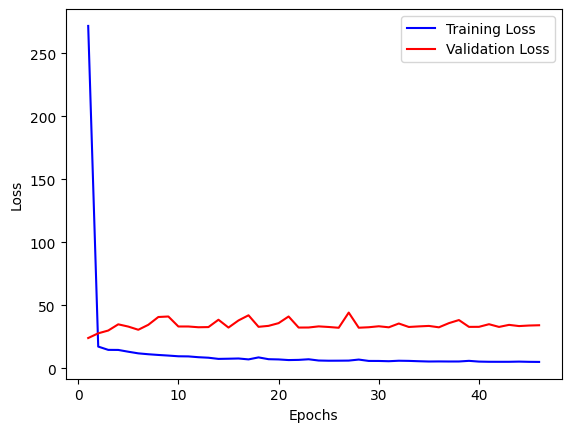

In [83]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

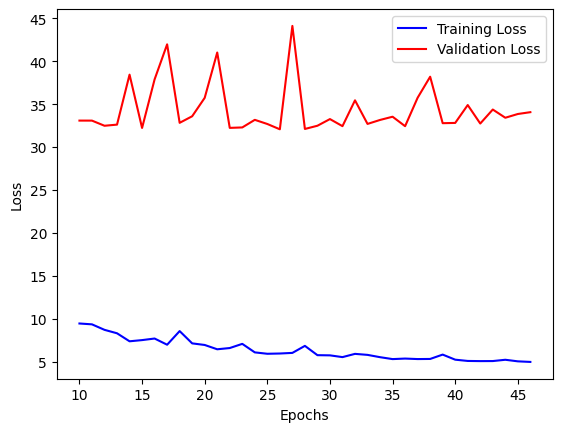

In [84]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [85]:
predictions = model.predict([bae_2d_X_test_vgg, bae_2d_z_test])

33/33 [==============================] - 2s 44ms/step


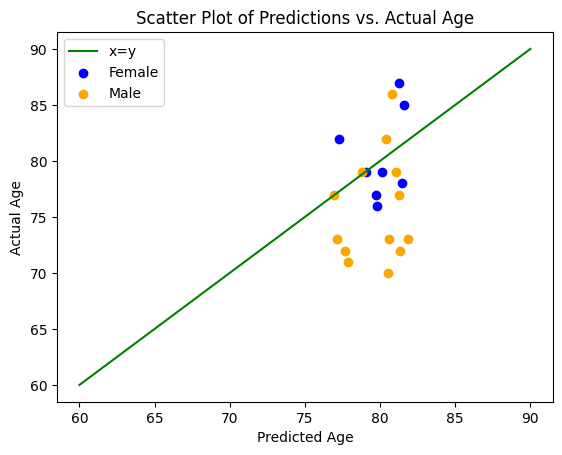

In [86]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [87]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_2d_y_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")


R^2: -0.4561333099198914
RMSE: 5.836291033482979
MSE: 34.062293027513824
MAE: 4.842763359433128
Pearson's r: 0.06266979637223338


### Version 2

In [60]:
from keras.applications.vgg16 import VGG16
pretrained_model = VGG16(input_shape=(95, 79, 3), include_top=False)

58889256/58889256 [==============================] - 3s 0us/step


In [61]:
bae_2d_X_train_vgg = np.repeat(bae_2d_X_train[:, :, :, np.newaxis], 3, axis=3)
bae_2d_X_test_vgg = np.repeat(bae_2d_X_test[:, :, :, np.newaxis], 3, axis=3)

In [154]:
from keras.layers import Dropout, BatchNormalization

def create_model(num_ft_layers,neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers[:11]:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  additional_input = Input(shape=(1,))


  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)

  x = Dense(neurons2, activation='relu')(x)

  x = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[11 - num_ft_layers:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[11 - num_ft_layers:11]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])
  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]



  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)


In [63]:
def objective(trial, X = bae_2d_X_train_vgg,y = bae_2d_y_train,z=bae_2d_z_train ,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 12, step = 2)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 128, step = 16)

    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, start_from_epoch=50, baseline = 100)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
    # random forest classifier object
    scores = []
    best_scores = []
    for train, test in KFold(n_splits=K, shuffle=True).split(range(81)):
        model = create_model(num_ft_layers = num_ft_layers,neurons1 = neurons1, neurons2 = neurons2) # compile model
        train = [i for i,a in enumerate(group_id) if a in train+1]
        test = [i for i,a in enumerate(group_id) if a in test+1]

        model = compile_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback, reduce_lr]).history
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(best_scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=3, gc_after_trial=True)
time_bayesian = time.time() - time_start


[I 2023-08-28 19:38:05,485] A new study created in memory with name: no-name-f165b52e-f128-41a1-b832-ab2d52701ce1
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].

/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [8, 128] and step=16, but the range is not divisible by `step`. It will be replaced by [8, 120].



Epoch 1/100
113/113 [==============================] - 6s 40ms/step - loss: 590.8915 - mae: 14.4944 - val_loss: 48.8477 - val_mae: 5.7207 - lr: 0.0010
Epoch 2/100
113/113 [==============================] - 4s 35ms/step - loss: 32.4456 - mae: 4.5598 - val_loss: 39.9918 - val_mae: 5.2149 - lr: 0.0010
Epoch 3/100
113/113 [==============================] - 4s 35ms/step - loss: 25.1114 - mae: 3.9939 - val_loss: 32.8901 - val_mae: 4.6863 - lr: 0.0010
Epoch 4/100
113/113 [==============================] - 4s 35ms/step - loss: 20.7365 - mae: 3.6076 - val_loss: 31.0252 - val_mae: 4.5908 - lr: 0.0010
Epoch 5/100
113/113 [==============================] - 4s 35ms/step - loss: 17.7348 - mae: 3.3406 - val_loss: 27.7886 - val_mae: 4.2711 - lr: 0.0010
Epoch 6/100
113/113 [==============================] - 4s 35ms/step - loss: 15.8530 - mae: 3.1555 - val_loss: 27.2764 - val_mae: 4.1442 - lr: 0.0010
Epoch 7/100
113/113 [==============================] - 4s 36ms/step - loss: 14.5913 - mae: 3.0164 - val_

[I 2023-08-28 19:54:06,940] Trial 0 finished with value: 23.81220277150472 and parameters: {'num_layers': 0, 'neurons1': 178, 'neurons2': 98, 'batch_size': 24}. Best is trial 0 with value: 23.81220277150472.


Epoch 1/100
23/23 [==============================] - 9s 216ms/step - loss: 4782.7588 - mae: 68.8326 - val_loss: 3318.4070 - val_mae: 57.4394 - lr: 0.0010
Epoch 2/100
23/23 [==============================] - 3s 126ms/step - loss: 2453.5847 - mae: 48.5679 - val_loss: 1011.7357 - val_mae: 31.0400 - lr: 0.0010
Epoch 3/100
23/23 [==============================] - 3s 126ms/step - loss: 527.1057 - mae: 19.9690 - val_loss: 110.8657 - val_mae: 8.6008 - lr: 0.0010
Epoch 4/100
23/23 [==============================] - 3s 126ms/step - loss: 124.1289 - mae: 9.1246 - val_loss: 140.2859 - val_mae: 10.0071 - lr: 0.0010
Epoch 5/100
23/23 [==============================] - 3s 126ms/step - loss: 114.1220 - mae: 8.7032 - val_loss: 106.9273 - val_mae: 8.5856 - lr: 0.0010
Epoch 6/100
23/23 [==============================] - 3s 127ms/step - loss: 107.9249 - mae: 8.3389 - val_loss: 104.5505 - val_mae: 8.5047 - lr: 0.0010
Epoch 7/100
23/23 [==============================] - 3s 127ms/step - loss: 103.2279 - mae:

[I 2023-08-28 20:08:35,840] Trial 1 finished with value: 112.31176948547363 and parameters: {'num_layers': 4, 'neurons1': 2, 'neurons2': 18, 'batch_size': 120}. Best is trial 0 with value: 23.81220277150472.


Epoch 1/100
23/23 [==============================] - 6s 162ms/step - loss: 665.1454 - mae: 18.3905 - val_loss: 31.7051 - val_mae: 4.5655 - lr: 0.0010
Epoch 2/100
23/23 [==============================] - 3s 133ms/step - loss: 44.5579 - mae: 5.2793 - val_loss: 27.4563 - val_mae: 4.3917 - lr: 0.0010
Epoch 3/100
23/23 [==============================] - 3s 133ms/step - loss: 31.7607 - mae: 4.4635 - val_loss: 17.7655 - val_mae: 3.3715 - lr: 0.0010
Epoch 4/100
23/23 [==============================] - 3s 134ms/step - loss: 30.1750 - mae: 4.3397 - val_loss: 16.5039 - val_mae: 3.2654 - lr: 0.0010
Epoch 5/100
23/23 [==============================] - 3s 134ms/step - loss: 27.9228 - mae: 4.1645 - val_loss: 17.6607 - val_mae: 3.4548 - lr: 0.0010
Epoch 6/100
23/23 [==============================] - 3s 134ms/step - loss: 27.4245 - mae: 4.1351 - val_loss: 22.3186 - val_mae: 3.7248 - lr: 0.0010
Epoch 7/100
23/23 [==============================] - 3s 135ms/step - loss: 24.9509 - mae: 3.9204 - val_loss: 2

[I 2023-08-28 20:20:50,066] Trial 2 finished with value: 23.546820322672527 and parameters: {'num_layers': 6, 'neurons1': 162, 'neurons2': 82, 'batch_size': 120}. Best is trial 2 with value: 23.546820322672527.


In [64]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [65]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
2,6,162,82,120,23.546820
0,0,178,98,24,23.812203
1,4,2,18,120,112.311769


In [66]:
optuna.visualization.plot_param_importances(study)

In [155]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(8,162,82)
history = model.fit([bae_2d_X_train_vgg, bae_2d_z_train], bae_2d_y_train, validation_data= ([bae_2d_X_test_vgg, bae_2d_z_test], bae_2d_y_test), epochs = 100, batch_size = 40, callbacks = [callback, reduce_lr]).history

Epoch 1/100
102/102 [==============================] - 8s 53ms/step - loss: 1159.5509 - mae: 19.2852 - val_loss: 36.1700 - val_mae: 5.0066 - lr: 0.0010
Epoch 2/100
102/102 [==============================] - 5s 49ms/step - loss: 29.0800 - mae: 4.3233 - val_loss: 52.4370 - val_mae: 5.7724 - lr: 0.0010
Epoch 3/100
102/102 [==============================] - 5s 49ms/step - loss: 27.7376 - mae: 4.1913 - val_loss: 27.8791 - val_mae: 4.3514 - lr: 0.0010
Epoch 4/100
102/102 [==============================] - 5s 49ms/step - loss: 32.2689 - mae: 4.5231 - val_loss: 42.9126 - val_mae: 5.3293 - lr: 0.0010
Epoch 5/100
102/102 [==============================] - 5s 50ms/step - loss: 27.3323 - mae: 4.1916 - val_loss: 49.4704 - val_mae: 5.5714 - lr: 0.0010
Epoch 6/100
102/102 [==============================] - 5s 50ms/step - loss: 27.5609 - mae: 4.1792 - val_loss: 39.6349 - val_mae: 5.1369 - lr: 0.0010
Epoch 7/100
102/102 [==============================] - 5s 50ms/step - loss: 24.5380 - mae: 3.9525 - val

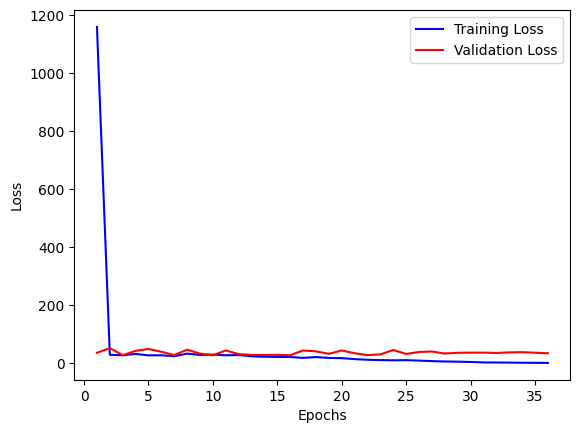

In [156]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

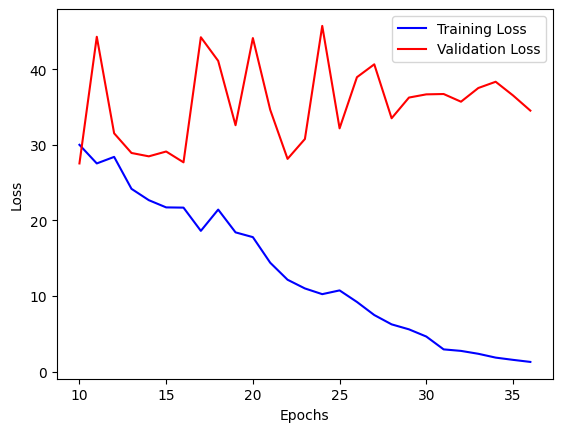

In [157]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [110]:
predictions = model.predict([bae_2d_X_test_vgg, bae_2d_z_test])

33/33 [==============================] - 1s 24ms/step


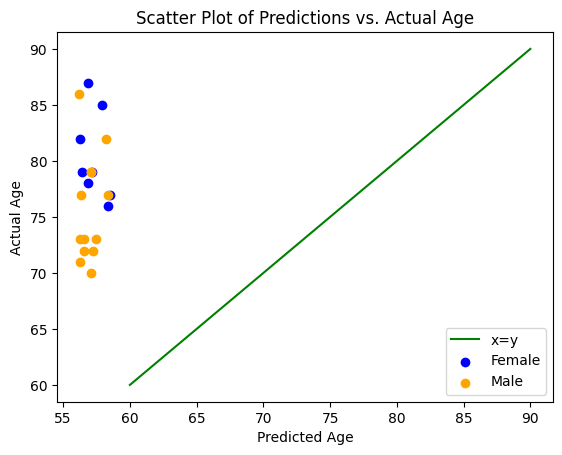

In [136]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [112]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_2d_y_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")


R^2: -0.2890243804567083
RMSE: 5.491195903101528
MSE: 30.15323244623901
MAE: 4.658810112362816
Pearson's r: -0.07355484664467223


### Version 2?

In [ ]:
from keras.applications.vgg16 import VGG16
pretrained_model = VGG16(input_shape=(95, 79, 3), include_top=False)

In [ ]:
bae_2d_X_train_vgg = np.repeat(bae_2d_X_train[:, :, :, np.newaxis], 3, axis=3)
bae_2d_X_test_vgg = np.repeat(bae_2d_X_test[:, :, :, np.newaxis], 3, axis=3)

In [ ]:
def compile_model():

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  additional_input = Input(shape=(1,))


  # Add Dense layers after concatenation
  x = Dense(256, activation='relu')(x)

  x = concatenate([x, additional_input])

  x = Dense(64, activation='relu')(x)

  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[16:]:
            layer.trainable = True

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [ ]:
model = compile_model()
history = model.fit([bae_2d_X_train_vgg, bae_2d_z_train], bae_2d_y_train, validation_data= ([bae_2d_X_test_vgg, bae_2d_z_test], bae_2d_y_test), epochs = 100, batch_size = 16).history

Epoch 1/100
254/254 [==============================] - 8s 25ms/step - loss: 135.9900 - mae: 6.5451 - val_loss: 34.4217 - val_mae: 4.7392
Epoch 2/100
254/254 [==============================] - 6s 24ms/step - loss: 22.3318 - mae: 3.7618 - val_loss: 31.3110 - val_mae: 4.5890
Epoch 3/100
254/254 [==============================] - 6s 24ms/step - loss: 19.5357 - mae: 3.5196 - val_loss: 29.0529 - val_mae: 4.5122
Epoch 4/100
254/254 [==============================] - 6s 24ms/step - loss: 18.2146 - mae: 3.3944 - val_loss: 26.5953 - val_mae: 4.3555
Epoch 5/100
254/254 [==============================] - 6s 24ms/step - loss: 15.5860 - mae: 3.1205 - val_loss: 30.9609 - val_mae: 4.5133
Epoch 6/100
254/254 [==============================] - 6s 24ms/step - loss: 15.2326 - mae: 3.1149 - val_loss: 36.7314 - val_mae: 5.0056
Epoch 7/100
254/254 [==============================] - 6s 24ms/step - loss: 11.4823 - mae: 2.7142 - val_loss: 42.4985 - val_mae: 5.1826
Epoch 8/100
254/254 [==========================

In [ ]:
predictions = model.predict([bae_2d_X_test_vgg, bae_2d_z_test])

33/33 [==============================] - 1s 24ms/step


In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    return r2, rmse, mse, mae

# Sample data


r2, rmse, mse, mae = evaluate_predictions(predictions, bae_2d_y_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")

R^2: -0.27493310312543384
RMSE: 5.461099266349274
MSE: 29.823605196920578
MAE: 4.683057643345424


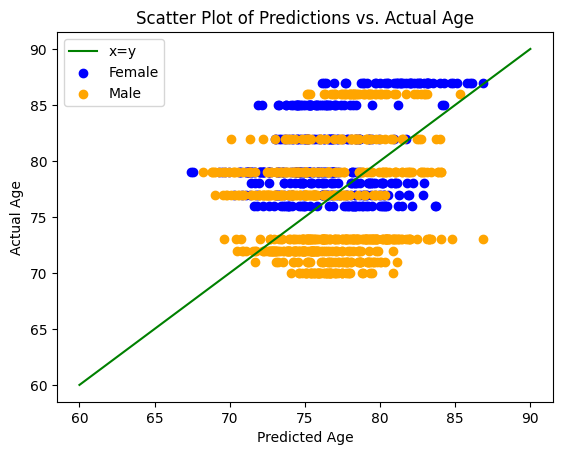

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_2d_z_test == g)
    plt.scatter(predictions[i], bae_2d_y_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

### Version 5

In [ ]:
from keras.applications.vgg19 import VGG19
pretrained_model = VGG19(input_shape=(95, 79, 3), include_top=False)

bae_2d_X_train_vgg = np.repeat(bae_2d_X_train[:, :, :, np.newaxis], 3, axis=3)
bae_2d_X_test_vgg = np.repeat(bae_2d_X_test[:, :, :, np.newaxis], 3, axis=3)

def compile_model():

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  additional_input = Input(shape=(1,))


  # Add Dense layers after concatenation
  x = Dense(256, activation='relu')(x)

  x = concatenate([x, additional_input])

  x = Dense(64, activation='relu')(x)

  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[22:]:
            layer.trainable = True

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

model = compile_model()
history = model.fit([bae_2d_X_train_vgg, bae_2d_z_train], bae_2d_y_train, validation_data= ([bae_2d_X_test_vgg, bae_2d_z_test], bae_2d_y_test), epochs = 200, batch_size = 16).history
print(model.evaluate([bae_2d_X_test_vgg, bae_2d_z_test], bae_2d_y_test))

Epoch 1/200
102/102 [==============================] - 4s 28ms/step - loss: 566.7046 - mae: 14.5024 - val_loss: 45.0534 - val_mae: 5.2563
Epoch 2/200
102/102 [==============================] - 2s 24ms/step - loss: 31.7853 - mae: 4.6137 - val_loss: 33.9440 - val_mae: 4.6389
Epoch 3/200
102/102 [==============================] - 2s 24ms/step - loss: 25.8300 - mae: 4.0724 - val_loss: 33.5161 - val_mae: 4.7029
Epoch 4/200
102/102 [==============================] - 2s 24ms/step - loss: 20.9307 - mae: 3.6466 - val_loss: 33.2399 - val_mae: 4.7518
Epoch 5/200
102/102 [==============================] - 2s 24ms/step - loss: 18.7993 - mae: 3.4314 - val_loss: 31.1054 - val_mae: 4.6765
Epoch 6/200
102/102 [==============================] - 2s 24ms/step - loss: 18.1776 - mae: 3.3539 - val_loss: 29.1949 - val_mae: 4.5146
Epoch 7/200
102/102 [==============================] - 2s 24ms/step - loss: 16.5291 - mae: 3.1994 - val_loss: 29.6894 - val_mae: 4.5922
Epoch 8/200
102/102 [=========================

### Version 3

In [41]:
from keras.applications.vgg19 import VGG19
pretrained_model = VGG19(input_shape=(95, 79, 3), include_top=False)

In [42]:
bae_2d_X_train_ = np.array(twod_df[twod_df.split == 'train']['data'])
bae_2d_y_train_ = np.array(twod_df[twod_df.split == 'train']['age'])
bae_2d_X_test_ = np.array(twod_df[twod_df.split == 'test']['data'])
bae_2d_y_test_ = np.array(twod_df[twod_df.split == 'test']['age'])

In [43]:
bae_2d_X_train_ = np.array([bae_2d_X_train_[i] for i in range(len(bae_2d_X_train_))])
bae_2d_y_train_ = np.array([bae_2d_y_train_[i] for i in range(len(bae_2d_y_train_))])
bae_2d_X_test_ = np.array([bae_2d_X_test_[i] for i in range(len(bae_2d_X_test_))])
bae_2d_y_test_ = np.array([bae_2d_y_test_[i] for i in range(len(bae_2d_y_test_))])

In [44]:
bae_2d_z_train_ =  np.array(twod_df[twod_df.split == 'train']['sex'])
bae_2d_z_test_ =  np.array(twod_df[twod_df.split == 'test']['sex'])
bae_2d_z_train_ = np.array([bae_2d_z_train_[i] for i in range(len(bae_2d_z_train_))])
bae_2d_z_test_ = np.array([bae_2d_z_test_[i] for i in range(len(bae_2d_z_test_))])

In [45]:
from keras.applications.vgg19 import VGG19
pretrained_model = VGG19(input_shape=(95, 79, 3), include_top=False)

In [46]:
bae_2d_X_train_vgg_ = np.repeat(bae_2d_X_train_[:, :, :, np.newaxis], 3, axis=3)
bae_2d_X_test_vgg_ = np.repeat(bae_2d_X_test_[:, :, :, np.newaxis], 3, axis=3)

In [88]:
group_id_ = np.array(twod_df[twod_df.split == 'train']['id'])

In [89]:
def create_model(num_ft_layers,neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers[:14]:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  additional_input = Input(shape=(1,))


  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)
  x = Dense(neurons2, activation='relu')(x)
  x = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[14 - num_ft_layers:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[14 - num_ft_layers:14]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])
  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]



  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)


In [49]:
group_id_

array([1, 1, 1, ..., 102, 102, 102], dtype=object)

In [91]:
def objective(trial, X = bae_2d_X_train_vgg_,y = bae_2d_y_train_,z=bae_2d_z_train_ ,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 12, step = 2)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
               neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 128, step = 16)

    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, start_from_epoch=50, baseline = 100)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
    # random forest classifier object
    scores = []
    best_scores = []
    for _ in range(2):
        vals = list(set(group_id_))
        random.shuffle(vals)

        # Calculate the index to split
        split_idx = int(0.8 * len(vals))

        # Split the list into 80% and 20%
        train = vals[:split_idx]
        test = vals[split_idx:]

        model = create_model(num_ft_layers = num_ft_layers,neurons1 = neurons1, neurons2 = neurons2) # compile model
        train = [i for i,a in enumerate(group_id) if a in train]
        test = [i for i,a in enumerate(group_id) if a in test]


        model = create_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback, reduce_lr]).history
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(best_scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=3, gc_after_trial=True)
time_bayesian = time.time() - time_start


[I 2023-08-29 00:50:06,660] A new study created in memory with name: no-name-1cd2b062-8208-470f-a0af-dcd97301cb84


Epoch 1/100
31/31 [==============================] - 14s 254ms/step - loss: 62518.9805 - mae: 68.6698 - val_loss: 200.9536 - val_mae: 11.7279 - lr: 0.0010
Epoch 2/100
31/31 [==============================] - 4s 135ms/step - loss: 79.7401 - mae: 7.1462 - val_loss: 30.3036 - val_mae: 4.4329 - lr: 0.0010
Epoch 3/100
31/31 [==============================] - 4s 136ms/step - loss: 33.3759 - mae: 4.6024 - val_loss: 45.5266 - val_mae: 5.2760 - lr: 0.0010
Epoch 4/100
31/31 [==============================] - 4s 137ms/step - loss: 30.6031 - mae: 4.4006 - val_loss: 30.8973 - val_mae: 4.3488 - lr: 0.0010
Epoch 5/100
31/31 [==============================] - 4s 137ms/step - loss: 28.5976 - mae: 4.2643 - val_loss: 28.1958 - val_mae: 4.1654 - lr: 0.0010
Epoch 6/100
31/31 [==============================] - 4s 137ms/step - loss: 27.0038 - mae: 4.1448 - val_loss: 36.4122 - val_mae: 4.6946 - lr: 0.0010
Epoch 7/100
31/31 [==============================] - 4s 139ms/step - loss: 27.1351 - mae: 4.1306 - val_lo

[I 2023-08-29 01:01:55,880] Trial 0 finished with value: 21.333364486694336 and parameters: {'num_layers': 6, 'neurons1': 194, 'neurons2': 98, 'batch_size': 104}. Best is trial 0 with value: 21.333364486694336.


Epoch 1/100
80/80 [==============================] - 12s 79ms/step - loss: 3333.7832 - mae: 31.4065 - val_loss: 19.7584 - val_mae: 3.5786 - lr: 0.0010
Epoch 2/100
80/80 [==============================] - 6s 75ms/step - loss: 30.6856 - mae: 4.3637 - val_loss: 16.4915 - val_mae: 2.7299 - lr: 0.0010
Epoch 3/100
80/80 [==============================] - 6s 75ms/step - loss: 28.6775 - mae: 4.2451 - val_loss: 13.5585 - val_mae: 2.9738 - lr: 0.0010
Epoch 4/100
80/80 [==============================] - 6s 75ms/step - loss: 30.5666 - mae: 4.3673 - val_loss: 17.4846 - val_mae: 3.6822 - lr: 0.0010
Epoch 5/100
80/80 [==============================] - 6s 76ms/step - loss: 28.2815 - mae: 4.2236 - val_loss: 28.1915 - val_mae: 4.8604 - lr: 0.0010
Epoch 6/100
80/80 [==============================] - 6s 76ms/step - loss: 30.4585 - mae: 4.3508 - val_loss: 16.1130 - val_mae: 3.4669 - lr: 0.0010
Epoch 7/100
80/80 [==============================] - 6s 75ms/step - loss: 28.5672 - mae: 4.2365 - val_loss: 20.045

[I 2023-08-29 01:19:42,241] Trial 1 finished with value: 22.60694980621338 and parameters: {'num_layers': 10, 'neurons1': 194, 'neurons2': 226, 'batch_size': 40}. Best is trial 0 with value: 21.333364486694336.


Epoch 1/100
31/31 [==============================] - 9s 158ms/step - loss: 22617.5566 - mae: 65.2306 - val_loss: 27.4967 - val_mae: 4.3352 - lr: 0.0010
Epoch 2/100
31/31 [==============================] - 4s 142ms/step - loss: 51.6603 - mae: 5.6826 - val_loss: 25.1007 - val_mae: 4.2120 - lr: 0.0010
Epoch 3/100
31/31 [==============================] - 4s 142ms/step - loss: 24.1522 - mae: 3.8279 - val_loss: 25.4001 - val_mae: 4.1561 - lr: 0.0010
Epoch 4/100
31/31 [==============================] - 4s 143ms/step - loss: 23.1917 - mae: 3.7765 - val_loss: 25.0287 - val_mae: 4.1149 - lr: 0.0010
Epoch 5/100
31/31 [==============================] - 4s 144ms/step - loss: 22.6539 - mae: 3.7277 - val_loss: 25.5964 - val_mae: 4.0932 - lr: 0.0010
Epoch 6/100
31/31 [==============================] - 4s 144ms/step - loss: 21.6842 - mae: 3.6372 - val_loss: 26.5588 - val_mae: 4.0744 - lr: 0.0010
Epoch 7/100
31/31 [==============================] - 4s 144ms/step - loss: 20.8590 - mae: 3.5666 - val_loss:

[I 2023-08-29 01:31:21,729] Trial 2 finished with value: 24.411200523376465 and parameters: {'num_layers': 8, 'neurons1': 66, 'neurons2': 114, 'batch_size': 104}. Best is trial 0 with value: 21.333364486694336.


In [92]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [93]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
0,6,194,98,104,21.333364
1,10,194,226,40,22.606950
2,8,66,114,104,24.411201


In [94]:
optuna.visualization.plot_param_importances(study)

In [95]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(6,194,98)
history = model.fit([bae_2d_X_train_vgg, bae_2d_z_train], bae_2d_y_train, validation_data= ([bae_2d_X_test_vgg, bae_2d_z_test], bae_2d_y_test), epochs = 100, batch_size = 104, callbacks = [callback, reduce_lr]).history

Epoch 1/100
39/39 [==============================] - 12s 231ms/step - loss: 2454.4661 - mae: 39.4427 - val_loss: 24.1004 - val_mae: 4.0004 - lr: 0.0010
Epoch 2/100
39/39 [==============================] - 5s 135ms/step - loss: 37.3399 - mae: 4.8292 - val_loss: 30.1328 - val_mae: 4.5372 - lr: 0.0010
Epoch 3/100
39/39 [==============================] - 5s 136ms/step - loss: 22.8945 - mae: 3.8911 - val_loss: 27.4079 - val_mae: 4.3264 - lr: 0.0010
Epoch 4/100
39/39 [==============================] - 5s 137ms/step - loss: 22.8377 - mae: 3.8922 - val_loss: 26.1838 - val_mae: 4.2135 - lr: 0.0010
Epoch 5/100
39/39 [==============================] - 5s 138ms/step - loss: 22.4793 - mae: 3.8674 - val_loss: 27.1179 - val_mae: 4.3255 - lr: 0.0010
Epoch 6/100
39/39 [==============================] - 5s 139ms/step - loss: 21.7282 - mae: 3.7871 - val_loss: 35.6655 - val_mae: 5.0189 - lr: 0.0010
Epoch 7/100
39/39 [==============================] - 5s 139ms/step - loss: 21.6934 - mae: 3.7496 - val_loss:

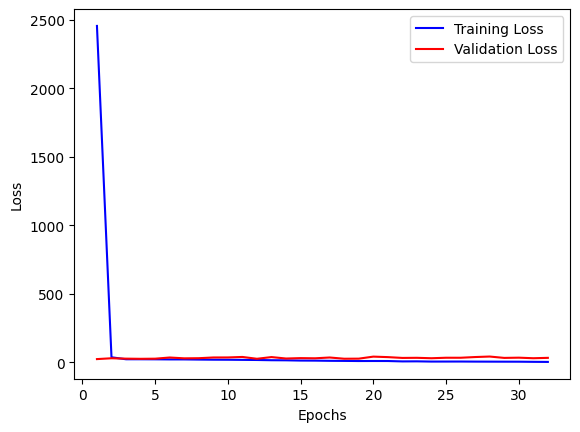

In [96]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

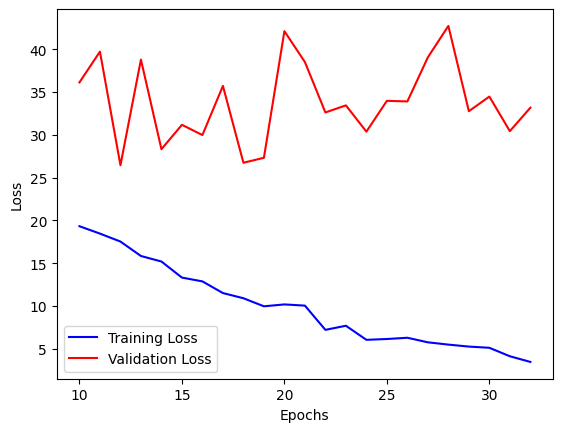

In [97]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [98]:
predictions = model.predict([bae_2d_X_test_vgg, bae_2d_z_test])

33/33 [==============================] - 1s 19ms/step


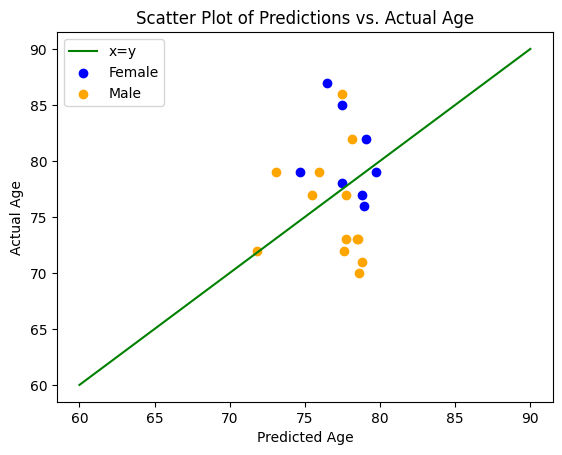

In [99]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [100]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_2d_y_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")


R^2: -0.4181693245843754
RMSE: 5.759707324467122
MSE: 33.174228463520215
MAE: 4.694369644891648
Pearson's r: 0.11552972137707414


### Version 4

In [42]:
from keras.applications.vgg16 import VGG16
pretrained_model = VGG16(input_shape=(95, 79, 3), include_top=False)

In [43]:
bae_2d_X_train_ = np.array(twod_df[twod_df.split == 'train']['data'])
bae_2d_y_train_ = np.array(twod_df[twod_df.split == 'train']['age'])
bae_2d_X_test_ = np.array(twod_df[twod_df.split == 'test']['data'])
bae_2d_y_test_ = np.array(twod_df[twod_df.split == 'test']['age'])

In [44]:
bae_2d_X_train_ = np.array([bae_2d_X_train_[i] for i in range(len(bae_2d_X_train_))])
bae_2d_y_train_ = np.array([bae_2d_y_train_[i] for i in range(len(bae_2d_y_train_))])
bae_2d_X_test_ = np.array([bae_2d_X_test_[i] for i in range(len(bae_2d_X_test_))])
bae_2d_y_test_ = np.array([bae_2d_y_test_[i] for i in range(len(bae_2d_y_test_))])

In [45]:
bae_2d_z_train_ =  np.array(twod_df[twod_df.split == 'train']['sex'])
bae_2d_z_test_ =  np.array(twod_df[twod_df.split == 'test']['sex'])
bae_2d_z_train_ = np.array([bae_2d_z_train_[i] for i in range(len(bae_2d_z_train_))])
bae_2d_z_test_ = np.array([bae_2d_z_test_[i] for i in range(len(bae_2d_z_test_))])

In [47]:
bae_2d_X_train_vgg_ = np.repeat(bae_2d_X_train_[:, :, :, np.newaxis], 3, axis=3)
bae_2d_X_test_vgg_ = np.repeat(bae_2d_X_test_[:, :, :, np.newaxis], 3, axis=3)

In [48]:
group_id_ = np.array(twod_df[twod_df.split == 'train']['id'])

In [49]:
def create_model(num_ft_layers,neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers[:14]:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  additional_input = Input(shape=(1,))


  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)
  x = Dense(neurons2, activation='relu')(x)
  x = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[14 - num_ft_layers:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[14 - num_ft_layers:14]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])
  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]



  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)


In [50]:
group_id_

array([1, 1, 1, ..., 102, 102, 102], dtype=object)

In [53]:
import random
def objective(trial, X = bae_2d_X_train_vgg_,y = bae_2d_y_train_,z=bae_2d_z_train_ ,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 12, step = 2)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 128, step = 16)

    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, start_from_epoch=50, baseline = 100)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
    # random forest classifier object
    scores = []
    best_scores = []
    for _ in range(2):
        vals = list(set(group_id_))
        random.shuffle(vals)

        # Calculate the index to split
        split_idx = int(0.8 * len(vals))

        # Split the list into 80% and 20%
        train = vals[:split_idx]
        test = vals[split_idx:]

        model = create_model(num_ft_layers = num_ft_layers,neurons1 = neurons1, neurons2 = neurons2) # compile model
        train = [i for i,a in enumerate(group_id) if a in train]
        test = [i for i,a in enumerate(group_id) if a in test]


        model = create_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback, reduce_lr]).history
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(best_scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=3, gc_after_trial=True)
time_bayesian = time.time() - time_start


[I 2023-08-29 09:17:22,859] A new study created in memory with name: no-name-3a52da1b-e01d-477b-95f7-8aca86338cb4
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [8, 128] and step=16, but the range is not divisible by `step`. It will be replaced by [8, 120].
  warnings.warn(


Epoch 1/100
37/37 [==============================] - 16s 130ms/step - loss: 2612.2021 - mae: 31.8197 - val_loss: 114.3351 - val_mae: 8.7830 - lr: 0.0010
Epoch 2/100
37/37 [==============================] - 2s 64ms/step - loss: 35.2358 - mae: 4.6205 - val_loss: 35.1690 - val_mae: 4.3815 - lr: 0.0010
Epoch 3/100
37/37 [==============================] - 2s 64ms/step - loss: 17.2226 - mae: 3.3219 - val_loss: 37.4102 - val_mae: 4.8950 - lr: 0.0010
Epoch 4/100
37/37 [==============================] - 2s 64ms/step - loss: 14.9292 - mae: 3.0701 - val_loss: 33.0858 - val_mae: 4.4202 - lr: 0.0010
Epoch 5/100
37/37 [==============================] - 2s 64ms/step - loss: 11.0131 - mae: 2.6231 - val_loss: 33.2404 - val_mae: 4.4261 - lr: 0.0010
Epoch 6/100
37/37 [==============================] - 2s 64ms/step - loss: 9.2988 - mae: 2.3997 - val_loss: 32.0035 - val_mae: 4.2922 - lr: 0.0010
Epoch 7/100
37/37 [==============================] - 2s 65ms/step - loss: 7.7261 - mae: 2.1920 - val_loss: 36.310

[I 2023-08-29 09:24:55,767] Trial 0 finished with value: 24.489944458007812 and parameters: {'num_layers': 0, 'neurons1': 50, 'neurons2': 66, 'batch_size': 88}. Best is trial 0 with value: 24.489944458007812.


Epoch 1/100
58/58 [==============================] - 17s 136ms/step - loss: 250739.9844 - mae: 98.8231 - val_loss: 29.5866 - val_mae: 4.1562 - lr: 0.0010
Epoch 2/100
58/58 [==============================] - 6s 110ms/step - loss: 26.8809 - mae: 4.1845 - val_loss: 31.5289 - val_mae: 4.1093 - lr: 0.0010
Epoch 3/100
58/58 [==============================] - 6s 110ms/step - loss: 23.0970 - mae: 3.9399 - val_loss: 26.1431 - val_mae: 3.7337 - lr: 0.0010
Epoch 4/100
58/58 [==============================] - 6s 110ms/step - loss: 23.4065 - mae: 3.9265 - val_loss: 25.5991 - val_mae: 3.6930 - lr: 0.0010
Epoch 5/100
58/58 [==============================] - 6s 110ms/step - loss: 24.4264 - mae: 4.0291 - val_loss: 28.8190 - val_mae: 3.9485 - lr: 0.0010
Epoch 6/100
58/58 [==============================] - 6s 110ms/step - loss: 23.1184 - mae: 3.9462 - val_loss: 34.1266 - val_mae: 4.2977 - lr: 0.0010
Epoch 7/100
58/58 [==============================] - 6s 110ms/step - loss: 23.6022 - mae: 3.9717 - val_los

Traceback (most recent call last):
  File "<ipython-input-53-52d374a16ff8>", line 33, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 1691, in fit
    callbacks.on_train_batch_end(end_step, logs)
  File "/usr/local/lib/python3.10/dist-packages/keras/callbacks.py", line 475, in on_train_batch_end
    self._call_batch_hook(ModeKeys.TRAIN, "end", batch, logs=logs)
  File "/usr/local/lib/python3.10/dist-packages/keras/callbacks.py", line 322, in _call_batch_hook
    self._call_batch_end_hook(mode, batch, logs)
  File "/usr/local/lib/python3.10/dist-packages/keras/callbacks.py", line 345, in _call_batch_end_hook
    self._call_batch_hook_helper(hook_name, batch, logs)
  File "/usr/local/lib/python3.10/dist-packages/keras/callbacks.py", line 393, in _call_b

Epoch 1/100


Traceback (most recent call last):
  File "<ipython-input-53-52d374a16ff8>", line 33, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 1685, in fit
    tmp_logs = self.train_function(iterator)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/util/traceback_utils.py", line 150, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/polymorphic_function.py", line 894, in __call__
    result = self._call(*args, **kwds)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/polymorphic_function.py", line 959, in _call
    return self._no_variable_creation_fn(*args, **kwds)
  File "/usr/local/lib/python3.10/dist-packag

In [ ]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [ ]:
bayesian_results.sort_values(by=['val'])

In [ ]:
optuna.visualization.plot_param_importances(study)

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(6,194,98)
history = model.fit([bae_2d_X_train_vgg, bae_2d_z_train], bae_2d_y_train, validation_data= ([bae_2d_X_test_vgg, bae_2d_z_test], bae_2d_y_test), epochs = 100, batch_size = 104, callbacks = [callback, reduce_lr]).history

In [ ]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
predictions = model.predict([bae_2d_X_test_vgg, bae_2d_z_test])

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_2d_y_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")


## Getting the best model

In [ ]:
model = Sequential() # using sequential

# Add 3D Convolutional layers with MaxPooling
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(95, 79, 1)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=(95, 79, 1)))
model.add(MaxPooling2D(pool_size=(2, 2)))


# Flatten the output and add Dense layers for age prediction
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))  # Use 'linear' activation for regression tasks

# Compile the model
model.compile(loss='mean_squared_error', optimizer='adam', metrics=[metrics.mean_absolute_error])


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test, z_train, z_test = train_test_split(X, y, z, test_size=0.2, random_state=42)
model.fit(X_train, y_train, epochs=400, batch_size=16, validation_data = (X_test, y_test))

Epoch 1/400
102/102 [==============================] - 13s 9ms/step - loss: 247.8621 - mean_absolute_error: 10.0326 - val_loss: 33.7370 - val_mean_absolute_error: 4.5954
Epoch 2/400
102/102 [==============================] - 1s 5ms/step - loss: 31.2726 - mean_absolute_error: 4.3872 - val_loss: 31.0015 - val_mean_absolute_error: 4.3434
Epoch 3/400
102/102 [==============================] - 1s 5ms/step - loss: 28.6745 - mean_absolute_error: 4.2530 - val_loss: 26.9340 - val_mean_absolute_error: 4.0794
Epoch 4/400
102/102 [==============================] - 1s 5ms/step - loss: 29.7851 - mean_absolute_error: 4.3504 - val_loss: 26.6544 - val_mean_absolute_error: 4.0875
Epoch 5/400
102/102 [==============================] - 1s 5ms/step - loss: 24.5405 - mean_absolute_error: 3.8903 - val_loss: 32.3695 - val_mean_absolute_error: 4.5452
Epoch 6/400
102/102 [==============================] - 1s 5ms/step - loss: 26.4569 - mean_absolute_error: 4.0463 - val_loss: 51.9999 - val_mean_absolute_error: 6.

13/13 [==============================] - 0s 7ms/step


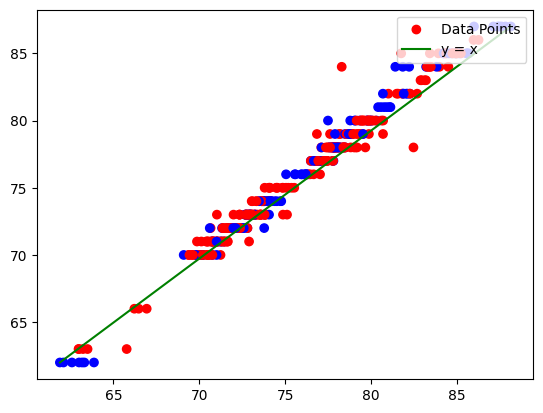

In [ ]:
predictions = model.predict(X_test)

import matplotlib.pyplot as plt

color = {1:'red',-1:'blue'}
# Plot scatter points with colors based on the third list
plt.scatter(predictions, y_test, c = [color[c] for c in z_test], label='Data Points')

# Draw the line x = y
plt.plot([min(predictions), max(predictions)], [min(y_test), max(y_test)], color='green', label='y = x')

# Add legend to the plot
plt.legend(loc='upper right')

# Display the plot
plt.show()

What if we average round the predictions to the nearest integer

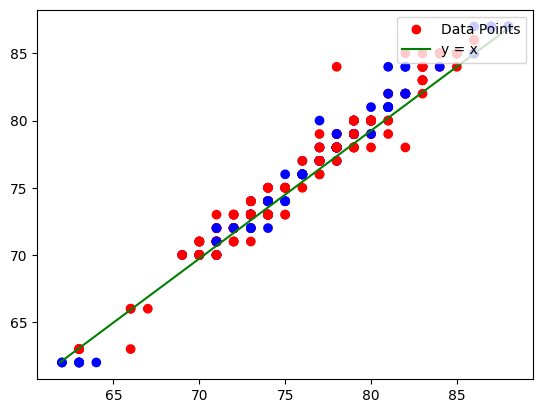

In [ ]:
# Plot scatter points with colors based on the third list
plt.scatter([round(x[0]) for x in predictions], y_test, c = [color[c] for c in z_test], label='Data Points')

# Draw the line x = y
plt.plot([min(predictions), max(predictions)], [min(y_test), max(y_test)], color='green', label='y = x')

# Add legend to the plot
plt.legend(loc='upper right')

# Display the plot
plt.show()

# MCI conversion Predictor

## Preparing the data

In [ ]:
mci_df = pd.read_csv('/content/drive/MyDrive/MCI DATA/MCI_processed.csv')

In [ ]:
mci_df

,Unnamed: 0,Image Data ID,Subject,Group,Sex,Age,Visit,Modality,Description,Type,Acq Date,Format,Downloaded,Label,Date
0,0,I211819,012_S_1033,MCI,F,73,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,12/01/2006,NiFTI,NaN,pMCI,6
1,1,I212445,941_S_1311,MCI,M,69,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,3/30/2007,NiFTI,NaN,pMCI,12
2,2,I211835,018_S_0155,MCI,M,81,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,3/23/2006,NiFTI,NaN,pMCI,36
3,3,I211851,027_S_0485,MCI,M,65,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,5/31/2006,NiFTI,NaN,sMCI,18
4,4,I211867,033_S_0906,MCI,F,65,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,10/23/2006,NiFTI,NaN,pMCI,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232,247,I210152,098_S_2052,EMCI,M,73,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,9/29/2010,NiFTI,NaN,sMCI,60
233,248,I212404,127_S_1419,MCI,M,78,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,8/31/2007,NiFTI,NaN,sMCI,48
234,249,I211794,003_S_1074,MCI,F,85,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,2/15/2007,NiFTI,NaN,pMCI,108
235,250,I212420,128_S_1407,MCI,F,75,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,6/08/2007,NiFTI,NaN,pMCI,36


In [ ]:
mci_df['Sex'] = mci_df['Sex'].apply(lambda x: 1 if x == 'M' else -1)
mci_df['Label'] = mci_df['Label'].apply(lambda x: 1 if x == 'pMCI' else 0)

Lets see how are data is split depending on where we set the threshhold:

In [ ]:
dates = sorted(mci_df.Date.unique())
for threshhold in dates:
  print('Threshhold',threshhold)
  pMCI_counts, sMCI_counts = 0,0
  for row in mci_df.iterrows():
    if row[1]['Label'] == 1:
      if row[1]['Date'] > threshhold:
        sMCI_counts += 1
      else:
        pMCI_counts += 1
    else:
      if row[1]['Date'] < threshhold:
        None
      else:
        sMCI_counts += 1
  print(f'pMCI count: {pMCI_counts}, sMCI count: {sMCI_counts}, we removed {237 - (sMCI_counts + pMCI_counts)} images')




Threshhold 6
pMCI count: 5, sMCI count: 232, we removed 0 images
Threshhold 12
pMCI count: 24, sMCI count: 200, we removed 13 images
Threshhold 18
pMCI count: 40, sMCI count: 173, we removed 24 images
Threshhold 24
pMCI count: 60, sMCI count: 145, we removed 32 images
Threshhold 36
pMCI count: 80, sMCI count: 108, we removed 49 images
Threshhold 48
pMCI count: 91, sMCI count: 75, we removed 71 images
Threshhold 60
pMCI count: 96, sMCI count: 58, we removed 83 images
Threshhold 72
pMCI count: 100, sMCI count: 42, we removed 95 images
Threshhold 78
pMCI count: 100, sMCI count: 38, we removed 99 images
Threshhold 84
pMCI count: 101, sMCI count: 36, we removed 100 images
Threshhold 96
pMCI count: 105, sMCI count: 26, we removed 106 images
Threshhold 108
pMCI count: 107, sMCI count: 20, we removed 110 images
Threshhold 120
pMCI count: 110, sMCI count: 12, we removed 115 images
Threshhold 132
pMCI count: 110, sMCI count: 8, we removed 119 images
Threshhold 138
pMCI count: 111, sMCI count: 6,

36 seems to be the best threshhold as it splits the data the best without removing too much data

In [ ]:
mci_df['Golden Label'] = ''
for i, row in enumerate(mci_df.iterrows()):
    if row[1]['Label'] == 1:
      if row[1]['Date'] > 36:
        mci_df.loc[i, 'Golden Label'] = 'sMCI'

      else:
        mci_df.loc[i, 'Golden Label'] = 'pMCI'
    else:
      if row[1]['Date'] < 36:
        None
      else:
        mci_df.loc[i, 'Golden Label'] = 'sMCI'

In [ ]:
mci_df= mci_df[mci_df['Golden Label'] != '']

In [ ]:
mci_df['Golden Label'] = mci_df['Golden Label'].apply(lambda x: 1 if x == 'pMCI' else 0)

In [ ]:
# new colunm for the paths
mci_df['Loc'] = ''
directory = '/content/drive/MyDrive/MCI DATA/output_imageID' # enter the dir were the images are stored

# iterate over files in that directory
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    image_id_folder = filename
    if image_id_folder in list(mci_df['Image Data ID']):
      for image in os.listdir(f):
        f = os.path.join(f, image)
        if os.path.isfile(f) and f.endswith('nii'):  # checking if it is a file and a .nii file
            mci_df.loc[mci_df['Image Data ID']==image_id_folder, 'Loc' ] = f # appending the path



In [ ]:
mci_df[mci_df['Loc'] == '']

,Unnamed: 0,Image Data ID,Subject,Group,Sex,Age,Visit,Modality,Description,Type,Acq Date,Format,Downloaded,Label,Date,Golden Label,Loc


In [ ]:

# Extract image data and corresponding ages from the DataFrame
mci_image_paths = mci_df['Loc'].values
mci_ages = mci_df['Age'].values
mci_sexes = mci_df['Sex'].values
mci_labels = mci_df['Golden Label'].values

# Initialize empty lists to store image arrays and labels
mci_image_data = []

# Loop through each image path, load the image, and append to the lists
for path in mci_image_paths:
    image = nib.load(path).get_fdata()
    mci_image_data.append(image)

# Convert lists to numpy arrays
mci_image_data = np.array(mci_image_data)

In [ ]:
count = 0
locations = []
shape = mci_image_data.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(mci_image_data[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)

19805


In [ ]:
from collections import Counter
Counter([ele[0] for ele in locations])

Counter({9: 7035, 60: 6490, 119: 817, 135: 3069, 185: 2394})

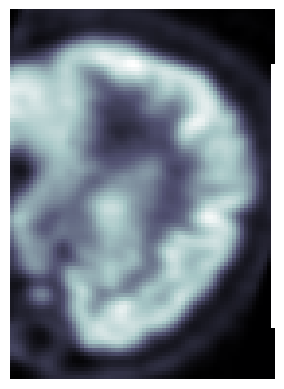

In [ ]:
plt.imshow(mci_image_data[9][20], cmap='bone')
plt.axis('off')
plt.show()

In [ ]:
for location in locations:
  surrounding_pixels = []
  try:
    surrounding_pixels.append(mci_image_data[location[0]][location[1]-1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(mci_image_data[location[0]][location[1]+1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(mci_image_data[location[0]][location[1]][location[2]-1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(mci_image_data[location[0]][location[1]][location[2]+1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(mci_image_data[location[0]][location[1]][location[2]][location[3]-1])
  except:
    None
  try:
    surrounding_pixels.append(mci_image_data[location[0]][location[1]][location[2]][location[3]+1])
  except:
    None
  mci_image_data[location[0]][location[1]][location[2]][location[3]]  =  np.nanmean(surrounding_pixels)

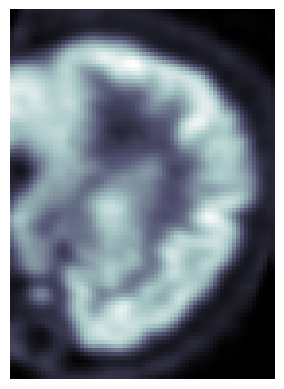

In [ ]:
plt.imshow(mci_image_data[9][20], cmap='bone')
plt.axis('off')
plt.show()

In [ ]:
"""count = 0
locations = []
shape = mci_image_data.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(mci_image_data[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)"""

0


In [ ]:
# Convert mci_labels and mci_sexes to string type
mci_labels_str = [str(i) for i in mci_labels]
mci_sexes_str = [str(i) for i in mci_sexes]

# Create a combined stratification variable
stratify_var = [label + sex for label, sex in zip(mci_labels_str, mci_sexes_str)]

# Split the data using the combined stratification variable
train_idx, test_idx, a, b = train_test_split(
    np.arange(188), mci_labels, test_size=0.2, stratify=stratify_var
)


NameError: ignored

In [ ]:
from skimage.feature import greycomatrix
from skimage import img_as_ubyte
mci_twod_df = pd.DataFrame(columns = ['id','age','sex','entropy','data', 'label'])
slice_counter = 0
rotation_angle = 90
counter = 0
for image_array, age, sex, label in zip(mci_image_data, mci_ages, mci_sexes, mci_labels):
  print(image_array.shape)
  counter += 1
  total_volumes = 1
  total_slices = image_array.shape[2]
  for current_volume in range(0, total_volumes):
      # iterate through slices
      for current_slice in range(0, total_slices):
          if (slice_counter % 1) == 0:
              if rotation_angle == 90:
                  data = np.rot90(image_array[:, :, current_slice])
              elif rotation_angle == 180:
                  data = np.rot90(np.rot90(image_array[:, :, current_slice]))
              elif rotation_angle == 270:
                  data = np.rot90(np.rot90(np.rot90(image_array[:, :, current_slice])))
              #alternate slices and save as png
              if (slice_counter % 1) == 0:
                  print('Adding image...')
                  min_val = np.min(data)
                  max_val = np.max(data)
                  im = 2 * (data - min_val) / (max_val - min_val) - 1
                  im = img_as_ubyte(im)
                  glcm = np.squeeze(greycomatrix(im, distances=[1], angles=[0], symmetric=True, normed=True))
                  entropy = -np.sum(glcm*np.log2(glcm + (glcm==0)))
                  new_row = {'id':counter, 'age':age, 'sex':sex, 'entropy':entropy, 'data':data, 'label':label}
                  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
                  #imsave(imge_folder +str(counter)+'_'+x_label2+'.jpg', data,format='jpg')
                  print('Saved.')

(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79,

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79,

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79,

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/

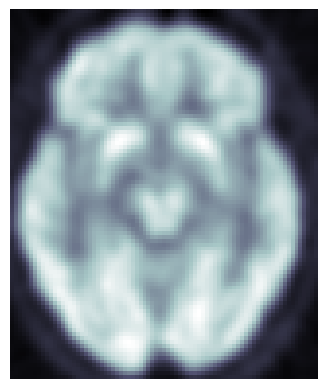

In [ ]:
plt.imshow(mci_twod_df['data'][mci_twod_df['entropy'].idxmax()], cmap='bone')
plt.axis('off')
plt.show()

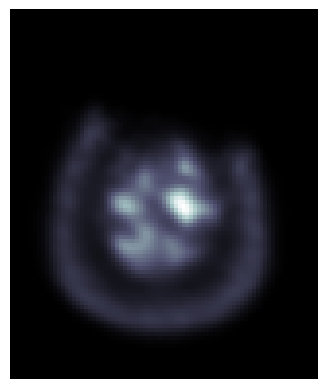

In [ ]:
plt.imshow(mci_twod_df['data'][mci_twod_df['entropy'].idxmin()], cmap='bone')
plt.axis('off')
plt.show()

## Some visualisations of the data

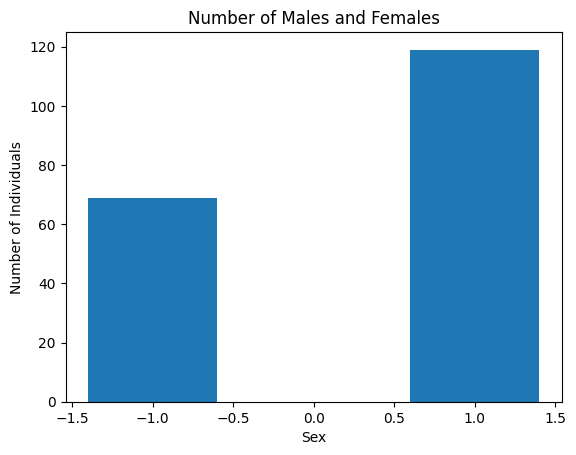

In [ ]:
sex_counts = mci_df["Sex"].value_counts()
# Plot the bar chart
plt.bar(sex_counts.index, sex_counts.values)
plt.xlabel("Sex")
plt.ylabel("Number of Individuals")
plt.title("Number of Males and Females")
plt.show()

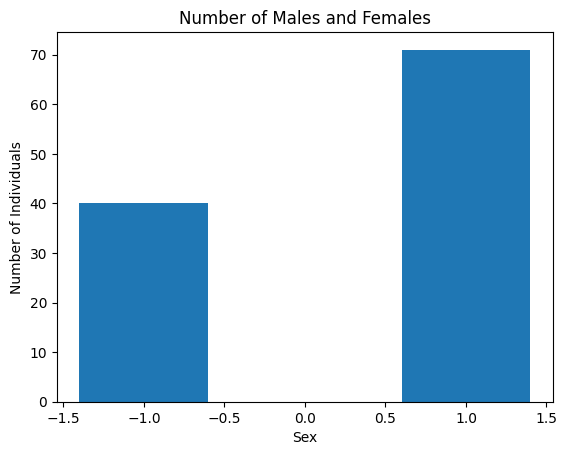

In [ ]:
sex_counts = mci_df[mci_df['Label']==1]["Sex"].value_counts()
# Plot the bar chart
plt.bar(sex_counts.index, sex_counts.values)
plt.xlabel("Sex")
plt.ylabel("Number of Individuals")
plt.title("Number of Males and Females")
plt.show()

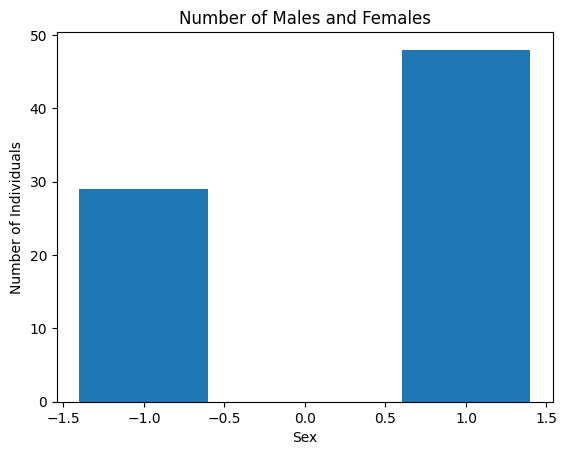

In [ ]:
sex_counts = mci_df[mci_df['Label']==-1]["Sex"].value_counts()
# Plot the bar chart
plt.bar(sex_counts.index, sex_counts.values)
plt.xlabel("Sex")
plt.ylabel("Number of Individuals")
plt.title("Number of Males and Females")
plt.show()

Text(0.5, 1.0, 'Age Distribution')

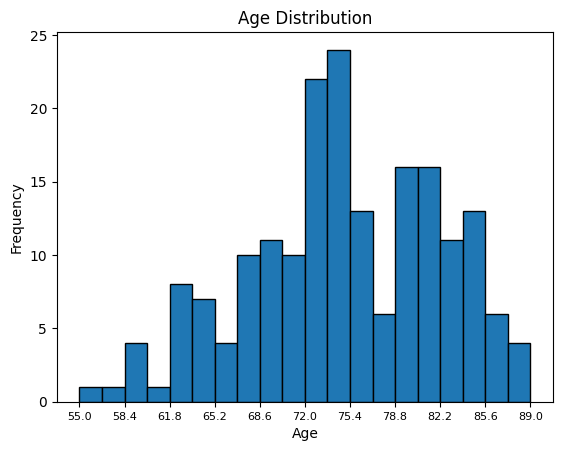

In [ ]:
plt.hist(mci_df["Age"], bins=20, edgecolor="black")
plt.xlabel("Age")
plt.ylabel("Frequency")
num_ticks = 11  # The number of ticks you want
x_ticks = np.linspace(mci_df["Age"].min(), mci_df["Age"].max(), num_ticks)
plt.xticks(x_ticks, fontsize=8)

plt.title("Age Distribution")

Text(0.5, 1.0, 'Age Distribution')

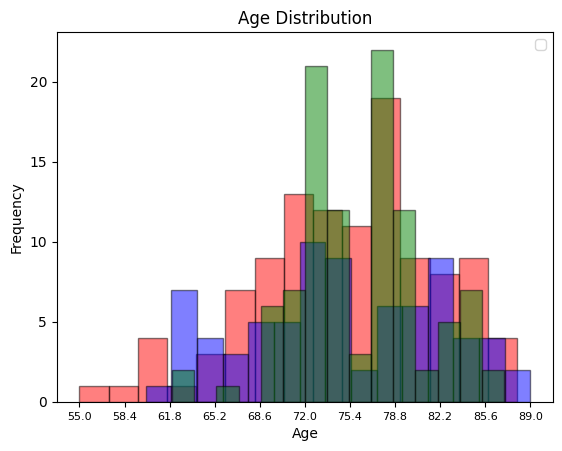

In [ ]:
plt.hist(mci_df[mci_df['Label']==1]["Age"], bins=15, alpha=0.5, edgecolor="black", color='red')
plt.hist(mci_df[mci_df['Label']==-1]["Age"], bins=15, alpha=0.5, edgecolor="black", color = 'blue')
plt.hist(df["Age"], bins=15, alpha=0.5, edgecolor="black", color='green')
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.legend(loc='upper right')

num_ticks = 11  # The number of ticks you want
x_ticks = np.linspace(mci_df["Age"].min(), mci_df["Age"].max(), num_ticks)
plt.xticks(x_ticks, fontsize=8)

plt.title("Age Distribution")

In [ ]:
mci_twod_df

,id,age,sex,entropy,data,label
0,1,73,-1,2.962042,"[[0.0012566640507429838, 0.0006672602030448616...",1
1,1,73,-1,3.266010,"[[0.005831534508615732, 0.004074377007782459, ...",1
2,1,73,-1,3.586705,"[[0.0025276336818933487, 0.0037867948412895203...",1
3,1,73,-1,3.913472,"[[-0.0035421315114945173, 0.001200263504870236...",1
4,1,73,-1,4.186998,"[[-0.00891648419201374, -0.005033640656620264,...",1
...,...,...,...,...,...,...
12779,188,75,-1,1.968181,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.969149707292...",1
12780,188,75,-1,1.548230,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.2756951...",1
12781,188,75,-1,1.314213,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1
12782,188,75,-1,1.111402,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1


In [ ]:
mci_high_entropy_df = pd.DataFrame(columns = ['id','age','sex','entropy','data', 'label'])
for id in mci_twod_df.id.unique():
  filtered_df = mci_twod_df[mci_twod_df.id == id].sort_values(by=['entropy'], ascending=False).head(20)
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)


<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)
<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)
<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)
<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)
<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append metho

In [ ]:
mci_high_entropy_df

,id,age,sex,entropy,data,label
16,1,73,-1,8.503109,"[[-0.010737914592027664, -0.01956712268292904,...",1
18,1,73,-1,8.467059,"[[-0.009189191274344921, -0.010210409760475159...",1
15,1,73,-1,8.433147,"[[-0.008829991333186626, -0.018925653770565987...",1
17,1,73,-1,8.414684,"[[-0.011152115650475025, -0.016327910125255585...",1
14,1,73,-1,8.198814,"[[-0.0070784869603812695, -0.01700356416404247...",1
...,...,...,...,...,...,...
12731,188,75,-1,7.856287,"[[0.0, 0.0, 0.0, 0.0, 2.0399130562509526e-07, ...",1
12747,188,75,-1,7.417500,"[[0.0, 0.0, 0.0, 0.0, 1.7709224948703195e-06, ...",1
12730,188,75,-1,7.395668,"[[0.0, 0.0, 0.0, 0.0, 0.0, 1.7699372619972564e...",1
12748,188,75,-1,6.981628,"[[2.254813352919882e-06, 1.7587442471267423e-0...",1


In [ ]:
mci_X = np.array(mci_high_entropy_df['data'])
mci_y = np.array(mci_high_entropy_df['label'])

In [ ]:
mci_X = np.array([mci_X[i] for i in range(len(mci_X))])
mci_y = np.array([mci_y[i] for i in range(len(mci_y))])

In [ ]:
mci_age = np.array(mci_high_entropy_df['age'])
mci_sex = np.array(mci_high_entropy_df['sex'])

## Adding the Age gap biomarker

In [ ]:
mci_age_predictions = model.predict(mci_X)

118/118 [==============================] - 0s 3ms/step


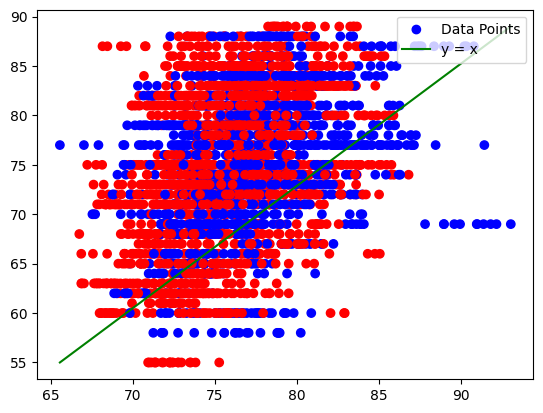

In [ ]:
import matplotlib.pyplot as plt

# Create a color map: -1 is red and 1 is blue
colormap = {0: 'red', 1: 'blue'}

# Plot scatter points with colors based on the third list
plt.scatter(mci_age_predictions, mci_age, c=[colormap[c] for c in mci_y], label='Data Points')

# Draw the line x = y
plt.plot([min(mci_age_predictions), max(mci_age_predictions)], [min(mci_age), max(mci_age)], color='green', label='y = x')

# Add legend to the plot
plt.legend(loc='upper right')

# Display the plot
plt.show()


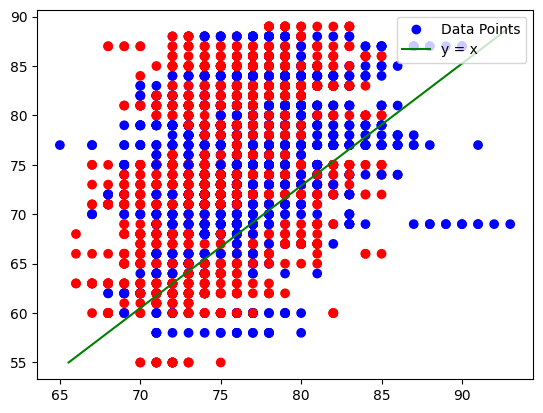

In [ ]:
import matplotlib.pyplot as plt


# Plot scatter points with colors based on the third list
plt.scatter([int(x[0]) for x in mci_age_predictions], mci_age, c=[colormap[c] for c in mci_y], label='Data Points')

# Draw the line x = y
plt.plot([min(mci_age_predictions), max(mci_age_predictions)], [min(mci_age), max(mci_age)], color='green', label='y = x')

# Add legend to the plot
plt.legend(loc='upper right')

# Display the plot
plt.show()

In [ ]:
age_gap = [prediction - actual for prediction, actual in zip(mci_age_predictions, mci_age)]

In [ ]:
smci_age_gaps = [age for age,label,sex in zip(age_gap, mci_y, mci_sex) if label ==-1]
pmci_age_gaps = [age for age,label,sex in zip(age_gap, mci_y, mci_sex) if label ==1]

In [ ]:
len(smci_age_gaps) + len(pmci_age_gaps)

3760

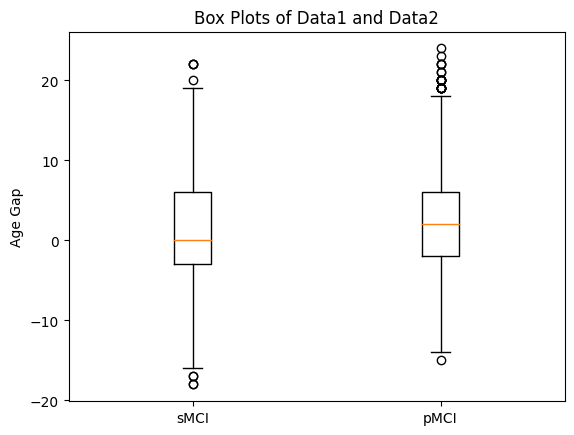

In [ ]:
import matplotlib.pyplot as plt

# Create a combined dataset
box_plot_data = [[int(a[0]) for a in smci_age_gaps], [int(a[0]) for a in pmci_age_gaps]]

# Create labels for the box plots
labels = ['sMCI', 'pMCI']

# Create the box plots
plt.boxplot(box_plot_data, labels=labels)

# Set the title and y-axis label
plt.title("Box Plots of sMCI vs pMCI Age Gap")
plt.ylabel("Age Gap")

# Display the plot
plt.show()


In [ ]:
print(np.mean([a[0] for a in smci_age_gaps]),np.mean([a[0] for a in pmci_age_gaps]))

1.1330577 2.042619


## Building a model

In [ ]:
from sklearn import metrics
from sklearn.metrics import r2_score
from keras import metrics

def compile_model():

  # Define the input layer for the 3D Convolutional network
  input_img = Input(shape=(95, 79, 1))

  # Apply 3D Convolutional layers with MaxPooling using the Functional API
  x = Conv2D(32, kernel_size=(3, 3), activation='relu')(input_img)
  x = MaxPooling2D(pool_size=(2, 2))(x)
  x = Conv2D(64, kernel_size=(3, 3), activation='relu')(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)


  # Flatten the output and add Dense layers for age prediction
  x = Flatten()(x)
  x = Dense(128, activation='relu')(x)
  output_img = Dense(32, activation='relu')(x)

  # Define the input layer for the extra feature
  input_extra = Input(shape=(1,))

  # Concatenate the output of the Convolutional network with the extra feature
  merged = concatenate([output_img, input_extra])

  # Add Dense layers for further prediction
  merged = Dense(32, activation='relu')(merged)
  merged = Dense(4, activation='relu')(merged)
  output = Dense(1, activation='sigmoid')(merged)  # Use 'linear' activation for regression tasks

  # Define the model with both inputs and the final output
  model = Model(inputs=[input_img, input_extra], outputs=output)

  # Compile the model
  model.compile(loss=keras.losses.binary_crossentropy, optimizer='adam', metrics=['accuracy'])

  return(model)

In [ ]:
def cross_validate(X, y, z, K = 5):
    scores = []
    histories = []
    for train, test in KFold(n_splits=K, shuffle=True).split(X,y):
        model = compile_model() # compile model
        histories.append(model.fit([X[train], z[train]], y[train],
                                   validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16, shuffle = True # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0)) # evaluate the test dataset
    """print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())"""
    print(model.summary())
    return scores, histories

In [ ]:
mci_y = np.array([(i+1)/2 for i in mci_y])

In [ ]:
scores_mci, histories_mci = cross_validate(mci_X, mci_y, age_gap, K = 5)

Epoch 1/200
188/188 [==============================] - 4s 8ms/step - loss: 0.6871 - accuracy: 0.5662 - val_loss: 0.6800 - val_accuracy: 0.5931
Epoch 2/200
188/188 [==============================] - 1s 7ms/step - loss: 0.6638 - accuracy: 0.5961 - val_loss: 0.6440 - val_accuracy: 0.6622
Epoch 3/200
188/188 [==============================] - 1s 7ms/step - loss: 0.6179 - accuracy: 0.6549 - val_loss: 0.6101 - val_accuracy: 0.6769
Epoch 4/200
188/188 [==============================] - 1s 7ms/step - loss: 0.5917 - accuracy: 0.6699 - val_loss: 0.5881 - val_accuracy: 0.6795
Epoch 5/200
188/188 [==============================] - 1s 7ms/step - loss: 0.5745 - accuracy: 0.6825 - val_loss: 0.5624 - val_accuracy: 0.7074
Epoch 6/200
188/188 [==============================] - 1s 7ms/step - loss: 0.5185 - accuracy: 0.7221 - val_loss: 0.5051 - val_accuracy: 0.7380
Epoch 7/200
188/188 [==============================] - 1s 7ms/step - loss: 0.4677 - accuracy: 0.7660 - val_loss: 0.4510 - val_accuracy: 0.7739

In [ ]:
import random
random.seed(42)
def cross_validate(X, y, z, K = 5):
    scores = []
    histories = []
    for train, test in KFold(n_splits=K, shuffle=True).split(X,y):
        z_train = z[train]
        z_test = z[test]
        random.shuffle(z_train)
        random.shuffle(z_test)
        model = compile_model() # compile model
        histories.append(model.fit([X[train], z_train], y[train],
                                   validation_data = ([X[test], z_test],y[test]), epochs=200, batch_size=32, shuffle = True # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z_test], y[test], verbose = 0)) # evaluate the test dataset
    """print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())"""
    print(model.summary())
    return scores, histories



In [ ]:
scores_mci_noag, histories_mci_noag = cross_validate(mci_X, mci_y, age_gap, K = 5)

Epoch 1/200
94/94 [==============================] - 4s 11ms/step - loss: 0.6890 - accuracy: 0.5625 - val_loss: 0.6903 - val_accuracy: 0.5532
Epoch 2/200
94/94 [==============================] - 1s 8ms/step - loss: 0.6852 - accuracy: 0.5775 - val_loss: 0.6924 - val_accuracy: 0.5505
Epoch 3/200
94/94 [==============================] - 1s 8ms/step - loss: 0.6611 - accuracy: 0.6220 - val_loss: 0.6385 - val_accuracy: 0.6569
Epoch 4/200
94/94 [==============================] - 1s 8ms/step - loss: 0.6319 - accuracy: 0.6546 - val_loss: 0.6274 - val_accuracy: 0.6543
Epoch 5/200
94/94 [==============================] - 1s 8ms/step - loss: 0.6187 - accuracy: 0.6606 - val_loss: 0.6160 - val_accuracy: 0.6569
Epoch 6/200
94/94 [==============================] - 1s 8ms/step - loss: 0.5821 - accuracy: 0.6805 - val_loss: 0.5889 - val_accuracy: 0.6848
Epoch 7/200
94/94 [==============================] - 1s 8ms/step - loss: 0.5116 - accuracy: 0.7354 - val_loss: 0.5399 - val_accuracy: 0.7460
Epoch 8/200
